In [1]:
# Set up autoreload
%load_ext autoreload
%autoreload 2

In [2]:
# Sys Imports
import sys
from pathlib import Path

github_root = Path.cwd().resolve().parents[3]
sys.path.append(str(github_root))


In [3]:
# Self-def imports
from src.dl.data import get_data
from src.dl.loaders import *
from src.dl.train import train_model

In [4]:
# Package imports
import torch
import torch.nn as nn
import numpy as np

In [5]:
# Get device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [6]:
# Data hyperparams
save_path = rf"{github_root}\data\simpler_data_rwc.csv"
batch_size = 20
epoch = 80
n_train = 100
n_val = 24
n_test = 20
n_tb_epoch = n_train // batch_size

# Model hyperparam and weights
cfg_p = {'in_channels': 1, 'out_channels': 128, 'hidden_channels': [8, 32], 'dropout': 0.05,'act_fn': 'gelu'}
cfg_q = {'in_channels': 128, 'out_channels': 32, 'hidden_channels': [128, 64], 'dropout': 0.05,'act_fn': 'gelu'}
model_cfg = {'fb_hidden_channels': [16,16], 'fb_modes': [[8], [8], [8]], 'fb_kernel': [3, 3, 3], 'cfg_p': cfg_p, 'cfg_q': cfg_q}
statedict_path = rf"{github_root}\runs\dl\simpler_data\fno\fno_16\model_weights.pth"

# Training hyperparams
lr = 1e-4
weight_decay = 1e-2

# Global hyperparams
n_randoms = 50 # Number of random seeds to use to split the data, and to train on. The metrics will be
               # recrded for each random seed, to create distributions of metrics.
master_seed = 1878439041 # The master seed to use to generate the random seeds for data splitting and training. This is used to ensure reproducibility.
seed_generator = np.random.default_rng(master_seed)
mccv_seeds = seed_generator.integers(low=0, high=2**32 - 1, size=n_randoms).tolist()

In [7]:
for i in mccv_seeds:
    save_dir = github_root / 'runs' / 'dl' / 'atmo_data' / 'fno_16' / 'results' /str(i)
    save_dir.mkdir(parents=True, exist_ok=True)

C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012596
Epoch 1/80, Step 2/5, Train Loss: 0.006322
Epoch 1/80, Step 3/5, Train Loss: 0.007826
Epoch 1/80, Step 4/5, Train Loss: 0.007461
Epoch 1/80, Step 5/5, Train Loss: 0.016413
Epoch 1/80 complete. Train Loss: 0.010123, Val Loss: 0.005896
Epoch 2/80, Step 1/5, Train Loss: 0.008612
Epoch 2/80, Step 2/5, Train Loss: 0.006229
Epoch 2/80, Step 3/5, Train Loss: 0.006583
Epoch 2/80, Step 4/5, Train Loss: 0.009448
Epoch 2/80, Step 5/5, Train Loss: 0.006144
Epoch 2/80 complete. Train Loss: 0.007403, Val Loss: 0.005555
Epoch 3/80, Step 1/5, Train Loss: 0.005013
Epoch 3/80, Step 2/5, Train Loss: 0.014979
Epoch 3/80, Step 3/5, Train Loss: 0.007933
Epoch 3/80, Step 4/5, Train Loss: 0.006668
Epoch 3/80, Step 5/5, Train Loss: 0.012280
Epoch 3/80 complete. Train Loss: 0.009375, Val Loss: 0.005282
Epoch 4/80, Step 1/5, Train Loss: 0.010774
Epoch 4/80, Step 2/5, Train Loss: 0.006625
Epoch 4/80, Step 3/5, Train Loss: 0.009815
Epoch 4/80, Step 4/5, Train Loss: 0.0071

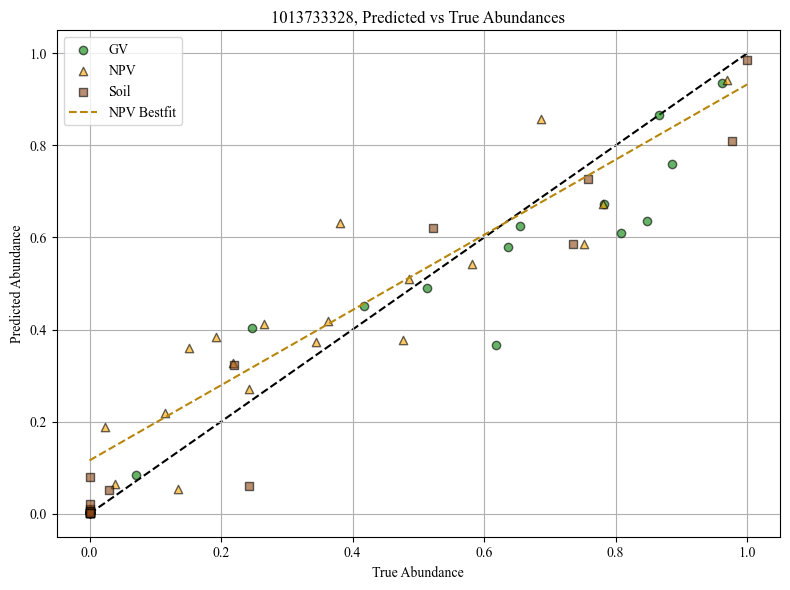

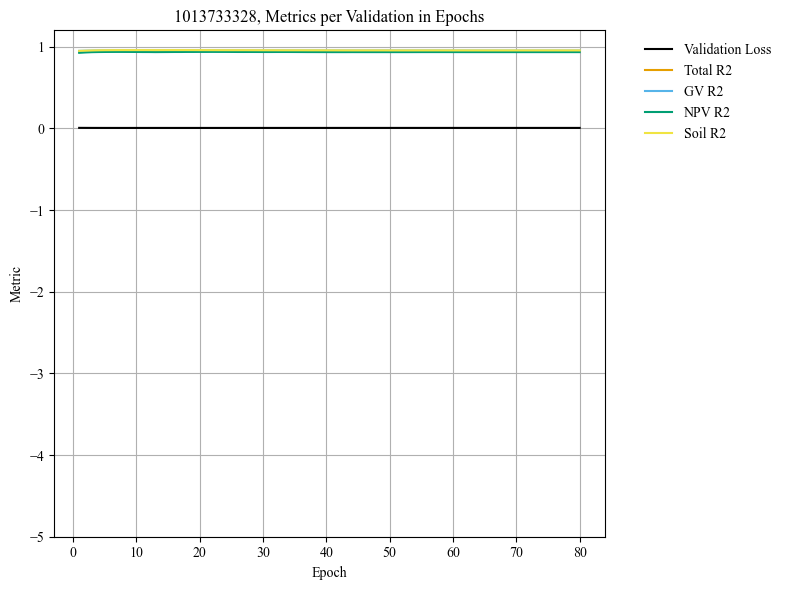

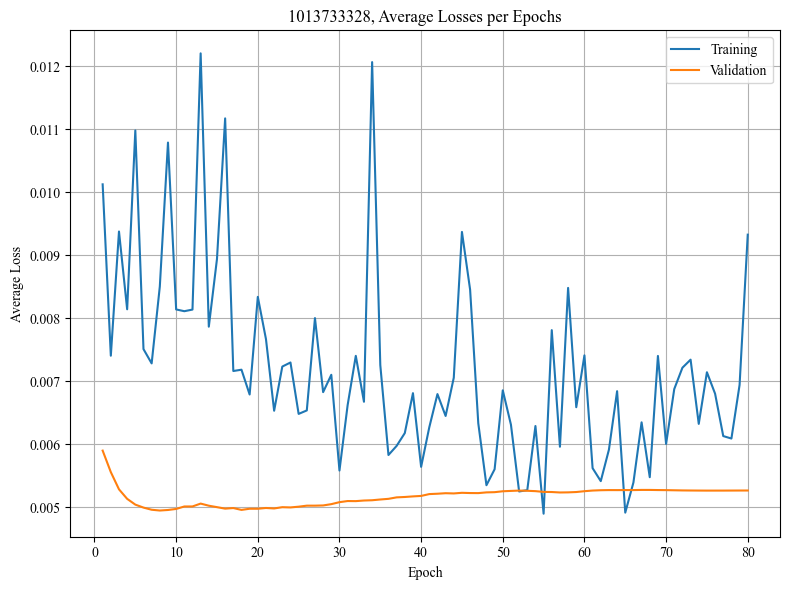

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004886
Epoch 1/80, Step 2/5, Train Loss: 0.009709
Epoch 1/80, Step 3/5, Train Loss: 0.007199
Epoch 1/80, Step 4/5, Train Loss: 0.005874
Epoch 1/80, Step 5/5, Train Loss: 0.009628
Epoch 1/80 complete. Train Loss: 0.007459, Val Loss: 0.005776
Epoch 2/80, Step 1/5, Train Loss: 0.011971
Epoch 2/80, Step 2/5, Train Loss: 0.005263
Epoch 2/80, Step 3/5, Train Loss: 0.006530
Epoch 2/80, Step 4/5, Train Loss: 0.003869
Epoch 2/80, Step 5/5, Train Loss: 0.009252
Epoch 2/80 complete. Train Loss: 0.007377, Val Loss: 0.005441
Epoch 3/80, Step 1/5, Train Loss: 0.004345
Epoch 3/80, Step 2/5, Train Loss: 0.006746
Epoch 3/80, Step 3/5, Train Loss: 0.010552
Epoch 3/80, Step 4/5, Train Loss: 0.002976
Epoch 3/80, Step 5/5, Train Loss: 0.008927
Epoch 3/80 complete. Train Loss: 0.006709, Val Loss: 0.005341
Epoch 4/80, Step 1/5, Train Loss: 0.006362
Epoch 4/80, Step 2/5, Train Loss: 0.005099
Epoch 4/80, Step 3/5, Train Loss: 0.013462
Epoch 4/80, Step 4/5, Train Loss: 0.0044

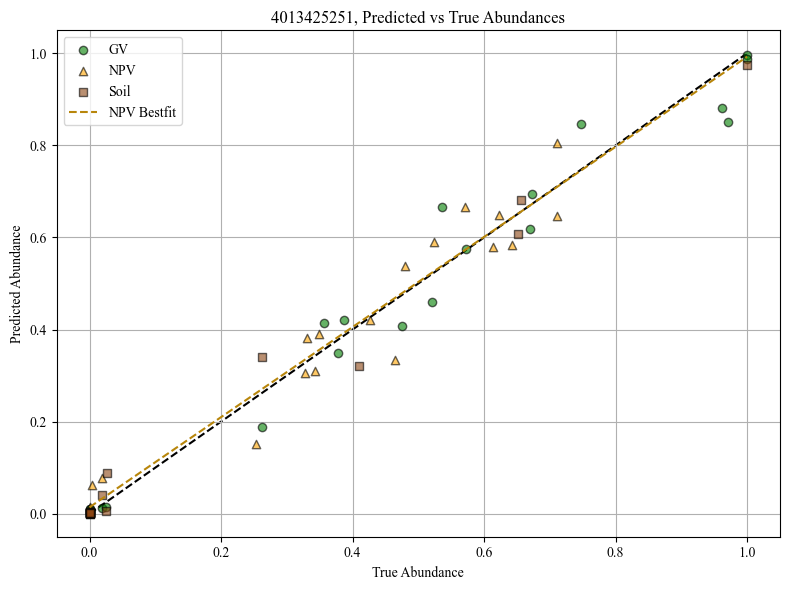

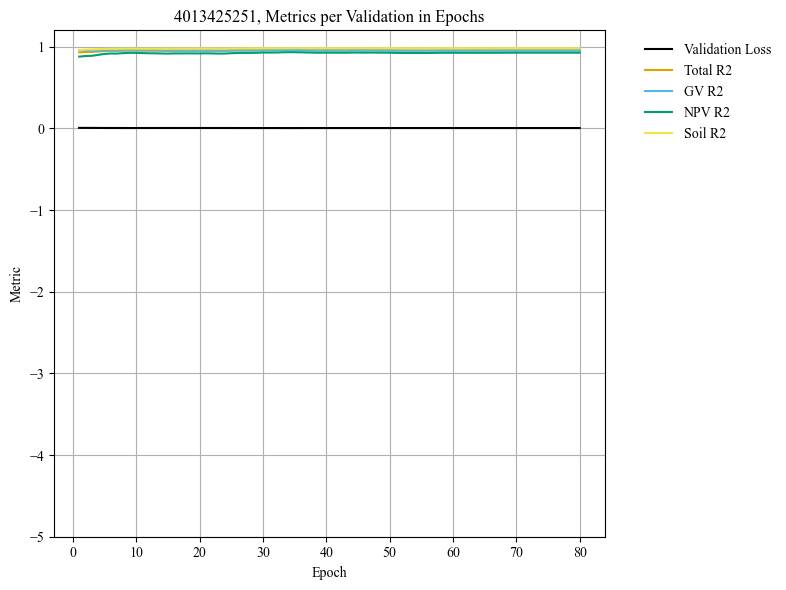

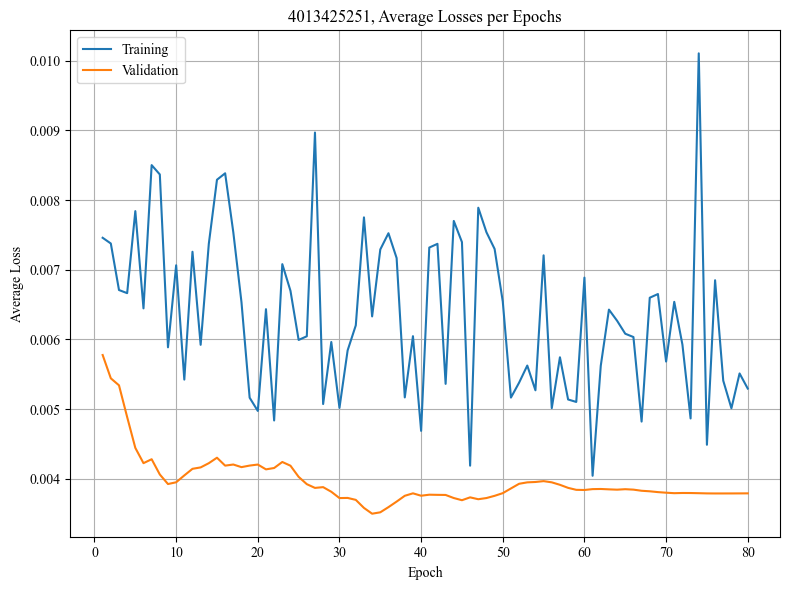

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009143
Epoch 1/80, Step 2/5, Train Loss: 0.010980
Epoch 1/80, Step 3/5, Train Loss: 0.015391
Epoch 1/80, Step 4/5, Train Loss: 0.029711
Epoch 1/80, Step 5/5, Train Loss: 0.007565
Epoch 1/80 complete. Train Loss: 0.014558, Val Loss: 0.006246
Epoch 2/80, Step 1/5, Train Loss: 0.008371
Epoch 2/80, Step 2/5, Train Loss: 0.011190
Epoch 2/80, Step 3/5, Train Loss: 0.020221
Epoch 2/80, Step 4/5, Train Loss: 0.009361
Epoch 2/80, Step 5/5, Train Loss: 0.006706
Epoch 2/80 complete. Train Loss: 0.011170, Val Loss: 0.006287
Epoch 3/80, Step 1/5, Train Loss: 0.008188
Epoch 3/80, Step 2/5, Train Loss: 0.009193
Epoch 3/80, Step 3/5, Train Loss: 0.007422
Epoch 3/80, Step 4/5, Train Loss: 0.011517
Epoch 3/80, Step 5/5, Train Loss: 0.004215
Epoch 3/80 complete. Train Loss: 0.008107, Val Loss: 0.006359
Epoch 4/80, Step 1/5, Train Loss: 0.004520
Epoch 4/80, Step 2/5, Train Loss: 0.008677
Epoch 4/80, Step 3/5, Train Loss: 0.009260
Epoch 4/80, Step 4/5, Train Loss: 0.0102

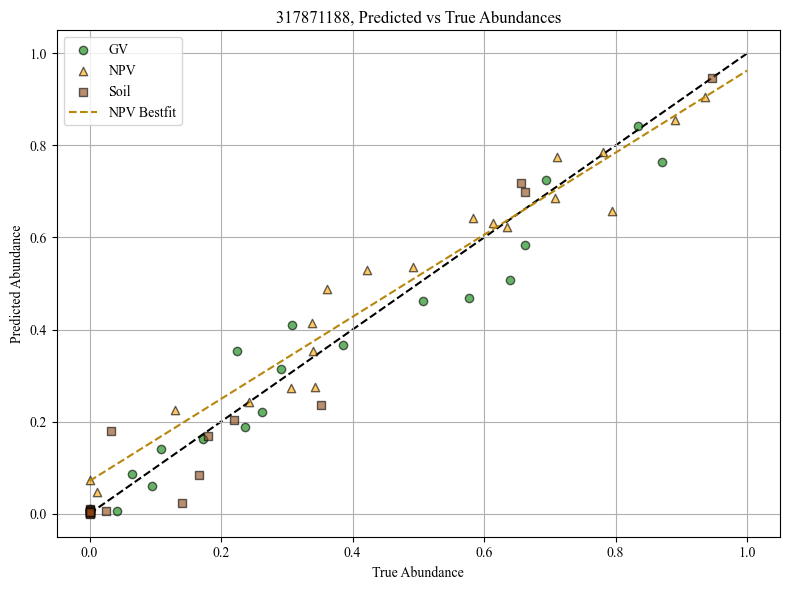

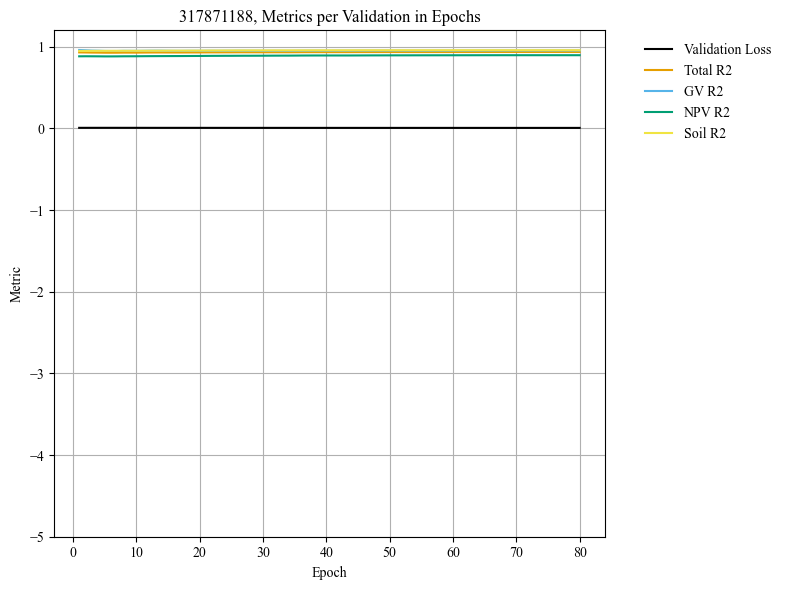

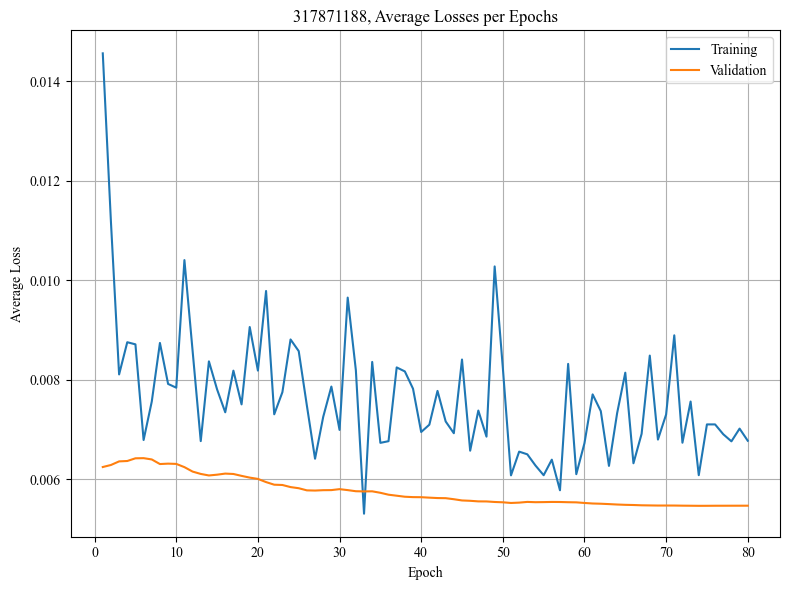

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006880
Epoch 1/80, Step 2/5, Train Loss: 0.014182
Epoch 1/80, Step 3/5, Train Loss: 0.014541
Epoch 1/80, Step 4/5, Train Loss: 0.006228
Epoch 1/80, Step 5/5, Train Loss: 0.004397
Epoch 1/80 complete. Train Loss: 0.009246, Val Loss: 0.006006
Epoch 2/80, Step 1/5, Train Loss: 0.014948
Epoch 2/80, Step 2/5, Train Loss: 0.008352
Epoch 2/80, Step 3/5, Train Loss: 0.009633
Epoch 2/80, Step 4/5, Train Loss: 0.004300
Epoch 2/80, Step 5/5, Train Loss: 0.010673
Epoch 2/80 complete. Train Loss: 0.009581, Val Loss: 0.005824
Epoch 3/80, Step 1/5, Train Loss: 0.012051
Epoch 3/80, Step 2/5, Train Loss: 0.001736
Epoch 3/80, Step 3/5, Train Loss: 0.009938
Epoch 3/80, Step 4/5, Train Loss: 0.005801
Epoch 3/80, Step 5/5, Train Loss: 0.008865
Epoch 3/80 complete. Train Loss: 0.007678, Val Loss: 0.005687
Epoch 4/80, Step 1/5, Train Loss: 0.010920
Epoch 4/80, Step 2/5, Train Loss: 0.004868
Epoch 4/80, Step 3/5, Train Loss: 0.009823
Epoch 4/80, Step 4/5, Train Loss: 0.0072

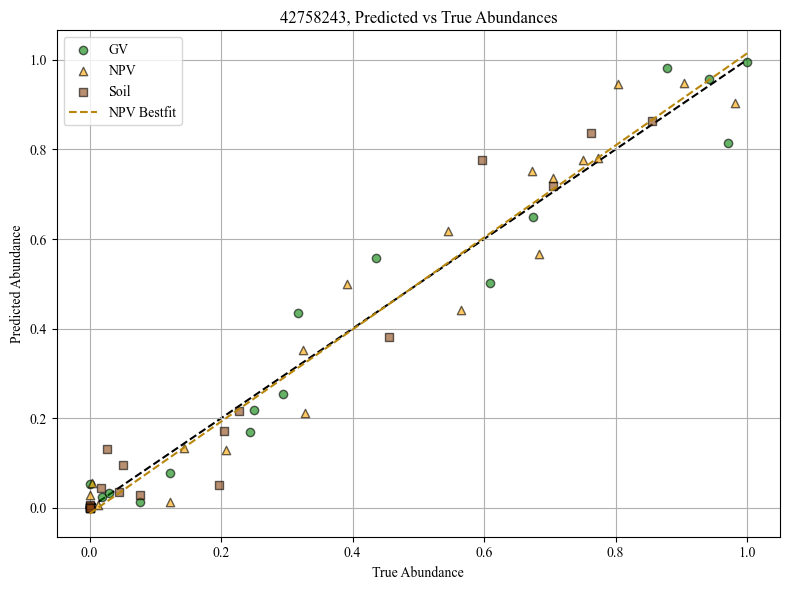

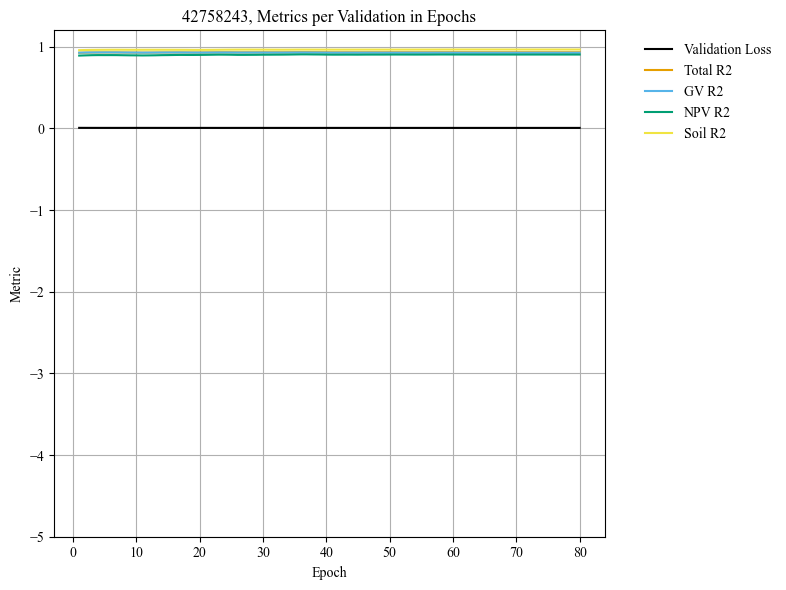

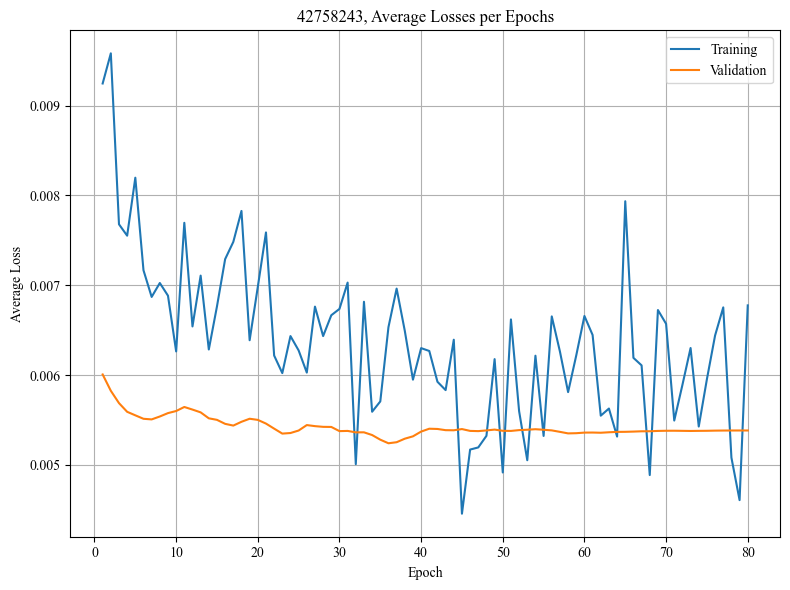

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010267
Epoch 1/80, Step 2/5, Train Loss: 0.004915
Epoch 1/80, Step 3/5, Train Loss: 0.016596
Epoch 1/80, Step 4/5, Train Loss: 0.008062
Epoch 1/80, Step 5/5, Train Loss: 0.006918
Epoch 1/80 complete. Train Loss: 0.009352, Val Loss: 0.018623
Epoch 2/80, Step 1/5, Train Loss: 0.007785
Epoch 2/80, Step 2/5, Train Loss: 0.009485
Epoch 2/80, Step 3/5, Train Loss: 0.008474
Epoch 2/80, Step 4/5, Train Loss: 0.002163
Epoch 2/80, Step 5/5, Train Loss: 0.004854
Epoch 2/80 complete. Train Loss: 0.006552, Val Loss: 0.017503
Epoch 3/80, Step 1/5, Train Loss: 0.007342
Epoch 3/80, Step 2/5, Train Loss: 0.004981
Epoch 3/80, Step 3/5, Train Loss: 0.003191
Epoch 3/80, Step 4/5, Train Loss: 0.008163
Epoch 3/80, Step 5/5, Train Loss: 0.013005
Epoch 3/80 complete. Train Loss: 0.007337, Val Loss: 0.016654
Epoch 4/80, Step 1/5, Train Loss: 0.010585
Epoch 4/80, Step 2/5, Train Loss: 0.005077
Epoch 4/80, Step 3/5, Train Loss: 0.008099
Epoch 4/80, Step 4/5, Train Loss: 0.0076

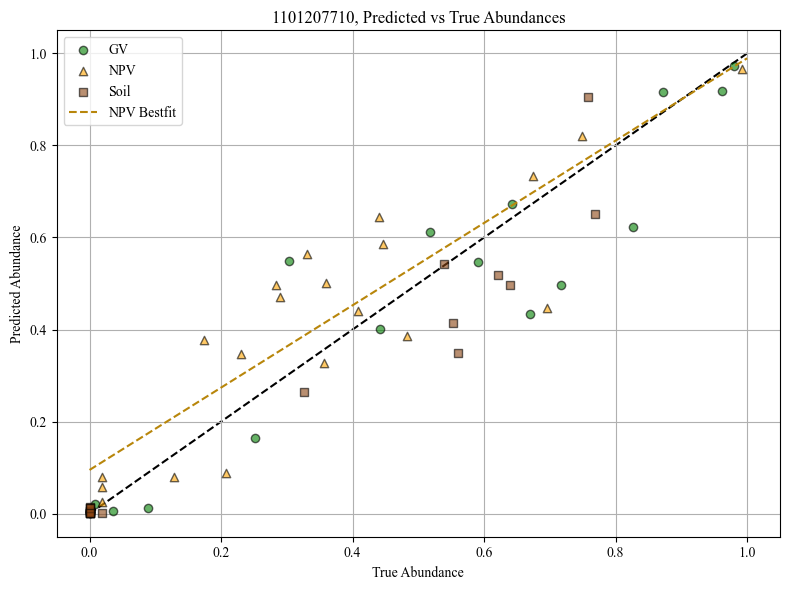

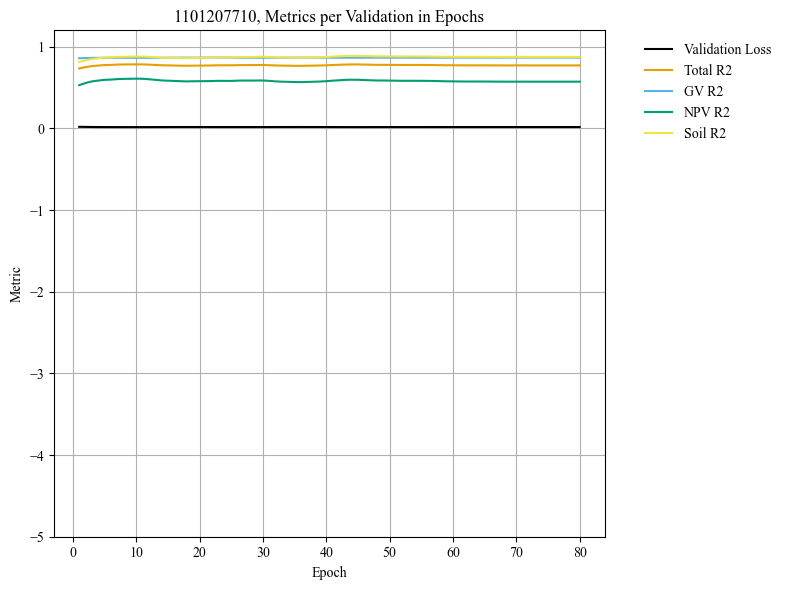

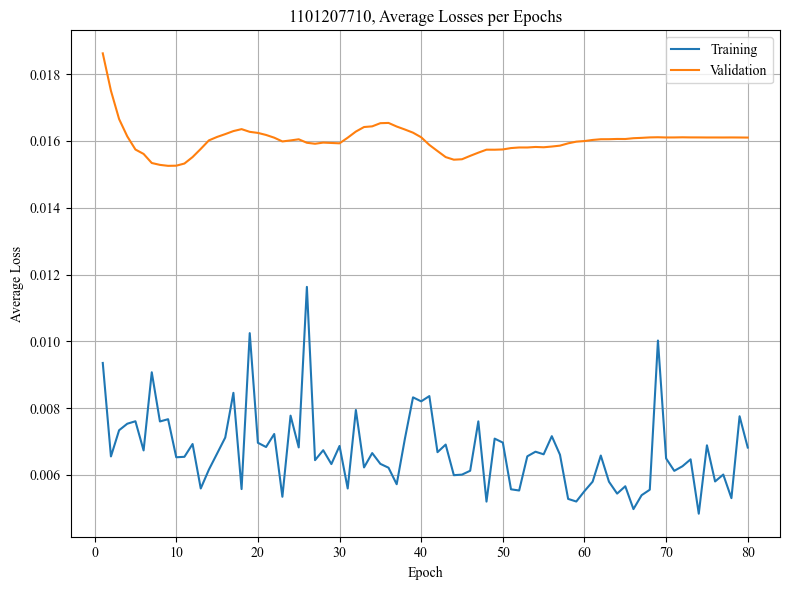

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005301
Epoch 1/80, Step 2/5, Train Loss: 0.013077
Epoch 1/80, Step 3/5, Train Loss: 0.007848
Epoch 1/80, Step 4/5, Train Loss: 0.010140
Epoch 1/80, Step 5/5, Train Loss: 0.009676
Epoch 1/80 complete. Train Loss: 0.009208, Val Loss: 0.005116
Epoch 2/80, Step 1/5, Train Loss: 0.010229
Epoch 2/80, Step 2/5, Train Loss: 0.009038
Epoch 2/80, Step 3/5, Train Loss: 0.007396
Epoch 2/80, Step 4/5, Train Loss: 0.004117
Epoch 2/80, Step 5/5, Train Loss: 0.008223
Epoch 2/80 complete. Train Loss: 0.007801, Val Loss: 0.005030
Epoch 3/80, Step 1/5, Train Loss: 0.009471
Epoch 3/80, Step 2/5, Train Loss: 0.020812
Epoch 3/80, Step 3/5, Train Loss: 0.008056
Epoch 3/80, Step 4/5, Train Loss: 0.005808
Epoch 3/80, Step 5/5, Train Loss: 0.006293
Epoch 3/80 complete. Train Loss: 0.010088, Val Loss: 0.005046
Epoch 4/80, Step 1/5, Train Loss: 0.004582
Epoch 4/80, Step 2/5, Train Loss: 0.006962
Epoch 4/80, Step 3/5, Train Loss: 0.009708
Epoch 4/80, Step 4/5, Train Loss: 0.0077

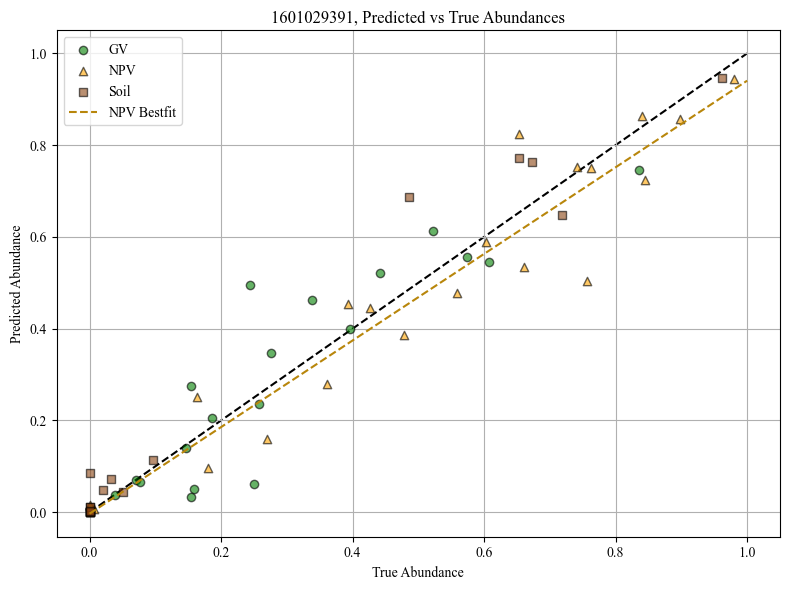

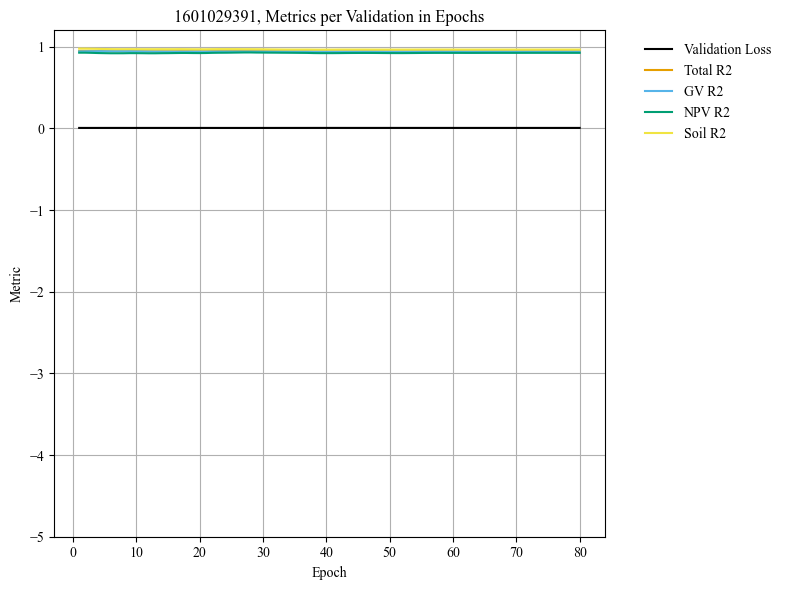

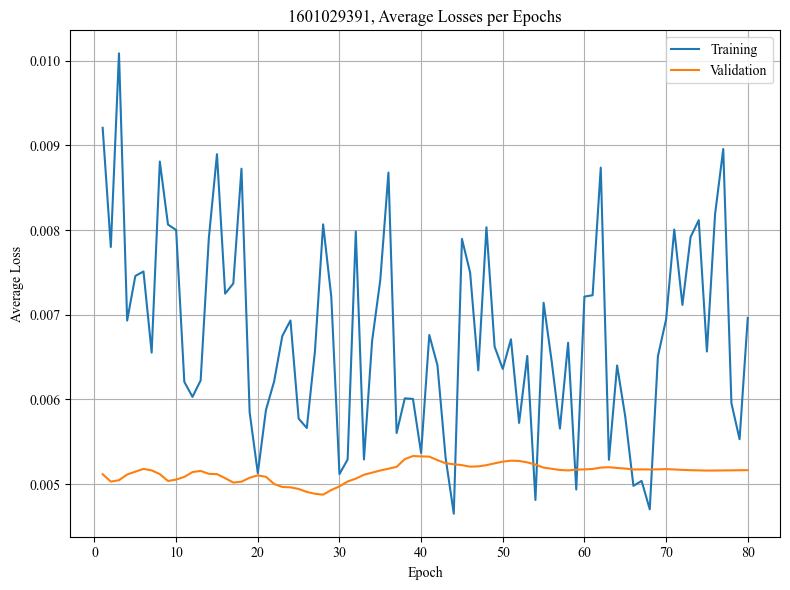

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011422
Epoch 1/80, Step 2/5, Train Loss: 0.005770
Epoch 1/80, Step 3/5, Train Loss: 0.008411
Epoch 1/80, Step 4/5, Train Loss: 0.003938
Epoch 1/80, Step 5/5, Train Loss: 0.011227
Epoch 1/80 complete. Train Loss: 0.008154, Val Loss: 0.011014
Epoch 2/80, Step 1/5, Train Loss: 0.009455
Epoch 2/80, Step 2/5, Train Loss: 0.006041
Epoch 2/80, Step 3/5, Train Loss: 0.006413
Epoch 2/80, Step 4/5, Train Loss: 0.005773
Epoch 2/80, Step 5/5, Train Loss: 0.010990
Epoch 2/80 complete. Train Loss: 0.007734, Val Loss: 0.011208
Epoch 3/80, Step 1/5, Train Loss: 0.006223
Epoch 3/80, Step 2/5, Train Loss: 0.004737
Epoch 3/80, Step 3/5, Train Loss: 0.007873
Epoch 3/80, Step 4/5, Train Loss: 0.010689
Epoch 3/80, Step 5/5, Train Loss: 0.006275
Epoch 3/80 complete. Train Loss: 0.007160, Val Loss: 0.011669
Epoch 4/80, Step 1/5, Train Loss: 0.004525
Epoch 4/80, Step 2/5, Train Loss: 0.013013
Epoch 4/80, Step 3/5, Train Loss: 0.004918
Epoch 4/80, Step 4/5, Train Loss: 0.0079

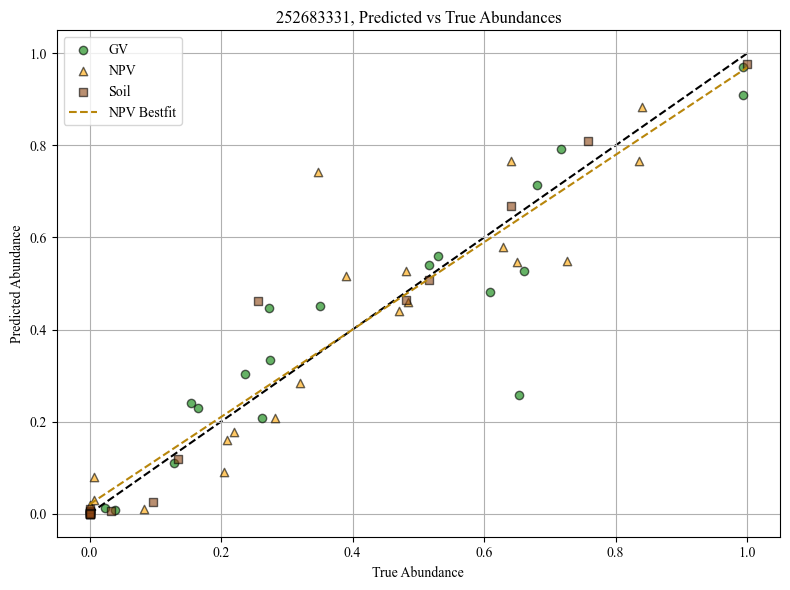

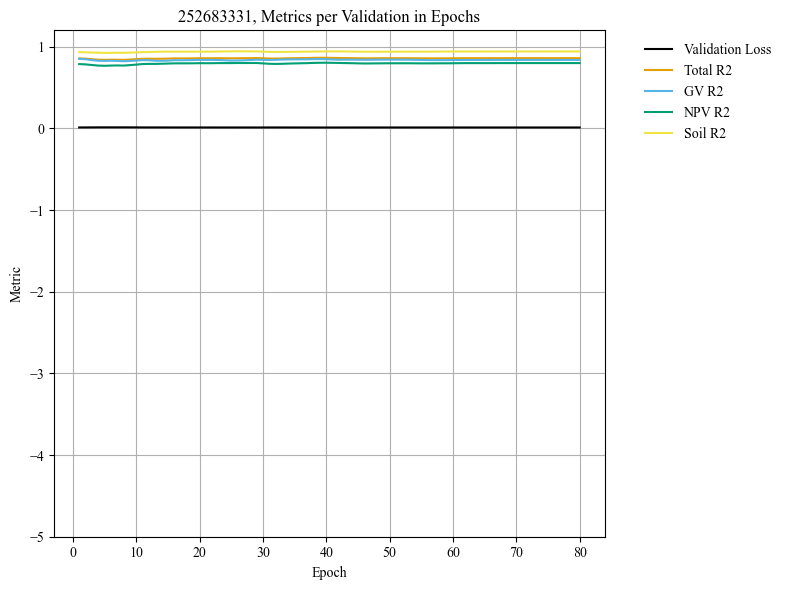

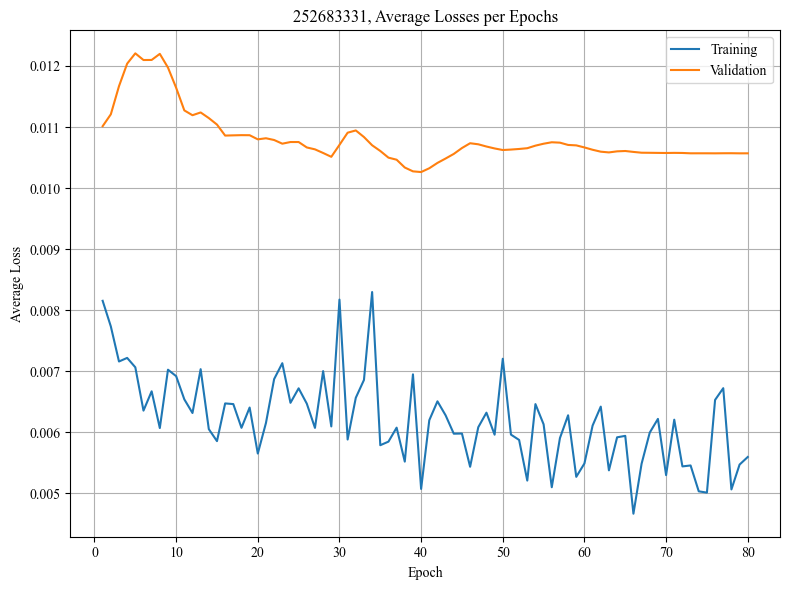

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010485
Epoch 1/80, Step 2/5, Train Loss: 0.006450
Epoch 1/80, Step 3/5, Train Loss: 0.012409
Epoch 1/80, Step 4/5, Train Loss: 0.011549
Epoch 1/80, Step 5/5, Train Loss: 0.009698
Epoch 1/80 complete. Train Loss: 0.010118, Val Loss: 0.004636
Epoch 2/80, Step 1/5, Train Loss: 0.018095
Epoch 2/80, Step 2/5, Train Loss: 0.008624
Epoch 2/80, Step 3/5, Train Loss: 0.003848
Epoch 2/80, Step 4/5, Train Loss: 0.013594
Epoch 2/80, Step 5/5, Train Loss: 0.005370
Epoch 2/80 complete. Train Loss: 0.009906, Val Loss: 0.004484
Epoch 3/80, Step 1/5, Train Loss: 0.005632
Epoch 3/80, Step 2/5, Train Loss: 0.010282
Epoch 3/80, Step 3/5, Train Loss: 0.005090
Epoch 3/80, Step 4/5, Train Loss: 0.011869
Epoch 3/80, Step 5/5, Train Loss: 0.008845
Epoch 3/80 complete. Train Loss: 0.008344, Val Loss: 0.004508
Epoch 4/80, Step 1/5, Train Loss: 0.006784
Epoch 4/80, Step 2/5, Train Loss: 0.015262
Epoch 4/80, Step 3/5, Train Loss: 0.006790
Epoch 4/80, Step 4/5, Train Loss: 0.0043

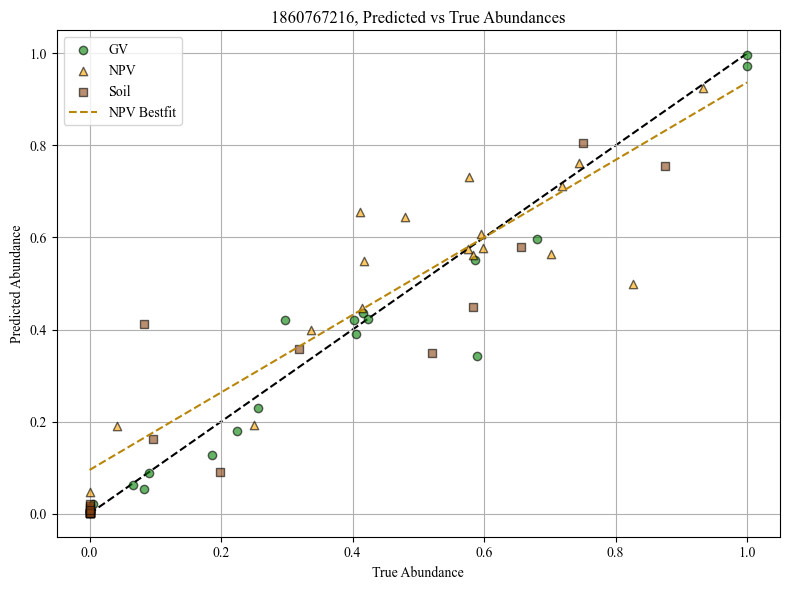

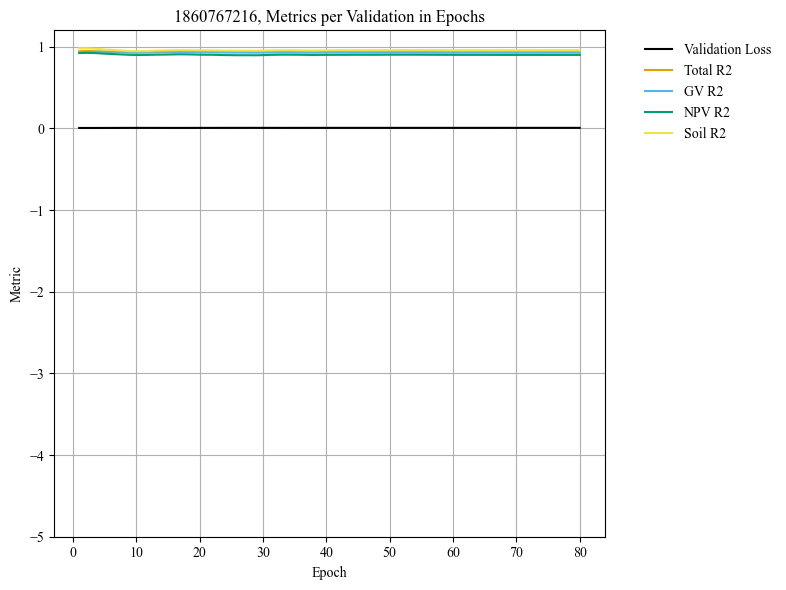

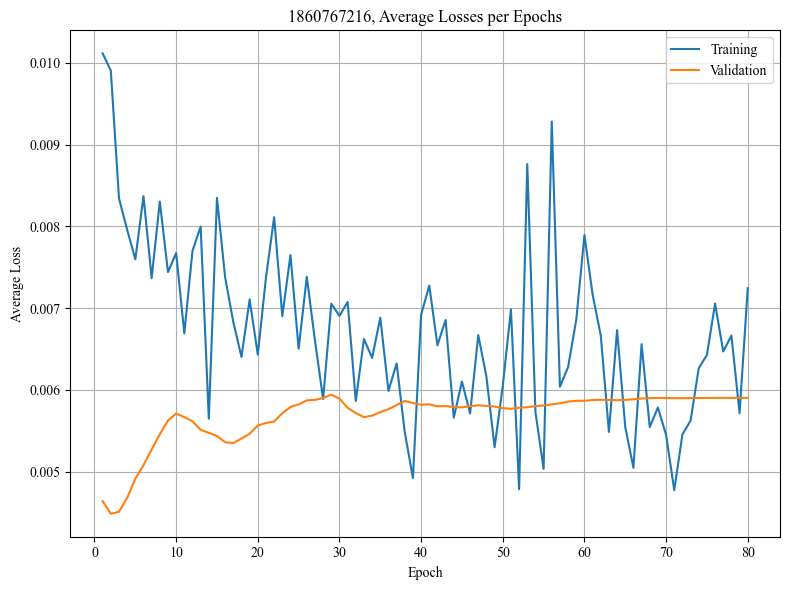

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004159
Epoch 1/80, Step 2/5, Train Loss: 0.004986
Epoch 1/80, Step 3/5, Train Loss: 0.006479
Epoch 1/80, Step 4/5, Train Loss: 0.005747
Epoch 1/80, Step 5/5, Train Loss: 0.004798
Epoch 1/80 complete. Train Loss: 0.005234, Val Loss: 0.005550
Epoch 2/80, Step 1/5, Train Loss: 0.007410
Epoch 2/80, Step 2/5, Train Loss: 0.007638
Epoch 2/80, Step 3/5, Train Loss: 0.007867
Epoch 2/80, Step 4/5, Train Loss: 0.002395
Epoch 2/80, Step 5/5, Train Loss: 0.005097
Epoch 2/80 complete. Train Loss: 0.006081, Val Loss: 0.005528
Epoch 3/80, Step 1/5, Train Loss: 0.006885
Epoch 3/80, Step 2/5, Train Loss: 0.006116
Epoch 3/80, Step 3/5, Train Loss: 0.004389
Epoch 3/80, Step 4/5, Train Loss: 0.003157
Epoch 3/80, Step 5/5, Train Loss: 0.003772
Epoch 3/80 complete. Train Loss: 0.004864, Val Loss: 0.005473
Epoch 4/80, Step 1/5, Train Loss: 0.005560
Epoch 4/80, Step 2/5, Train Loss: 0.004249
Epoch 4/80, Step 3/5, Train Loss: 0.006787
Epoch 4/80, Step 4/5, Train Loss: 0.0059

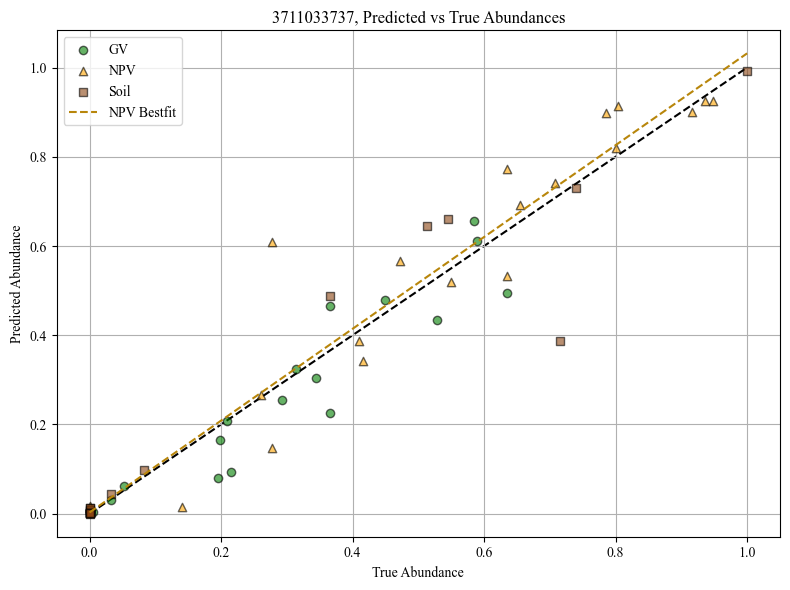

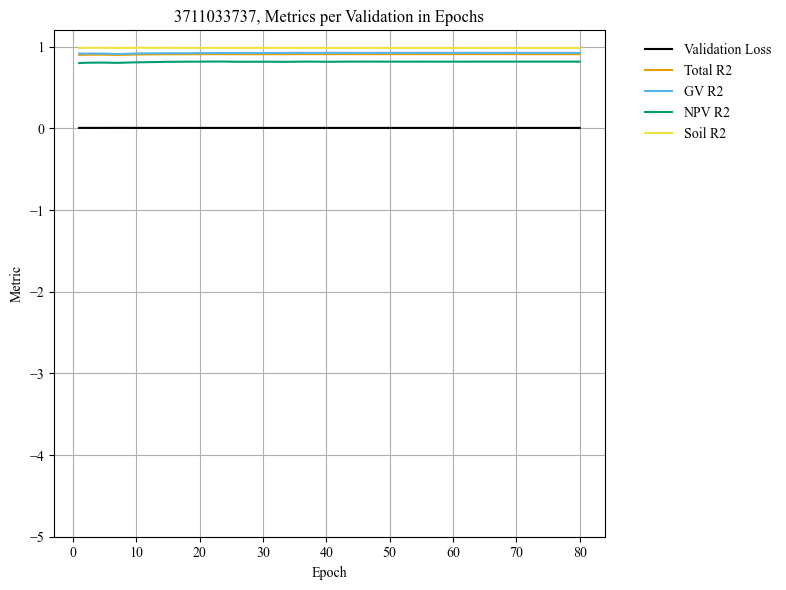

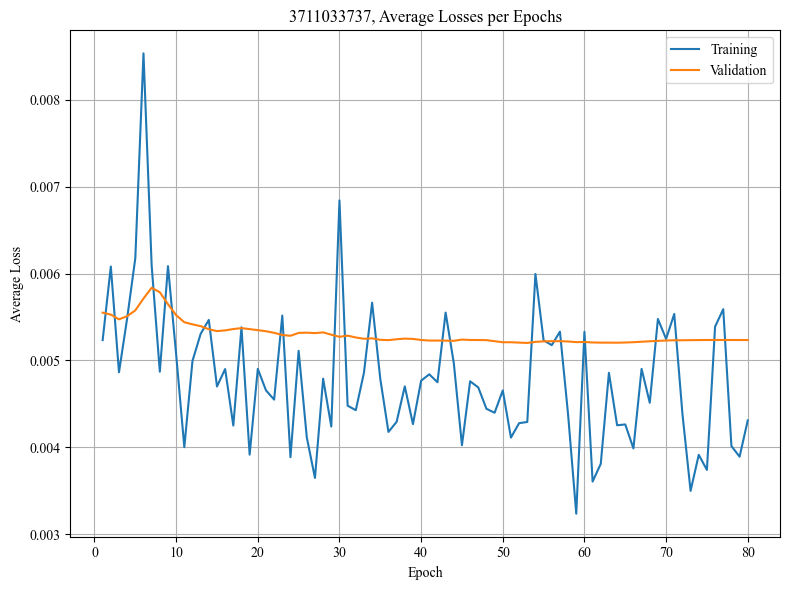

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007547
Epoch 1/80, Step 2/5, Train Loss: 0.008026
Epoch 1/80, Step 3/5, Train Loss: 0.005856
Epoch 1/80, Step 4/5, Train Loss: 0.007799
Epoch 1/80, Step 5/5, Train Loss: 0.009165
Epoch 1/80 complete. Train Loss: 0.007679, Val Loss: 0.003846
Epoch 2/80, Step 1/5, Train Loss: 0.008212
Epoch 2/80, Step 2/5, Train Loss: 0.018708
Epoch 2/80, Step 3/5, Train Loss: 0.004704
Epoch 2/80, Step 4/5, Train Loss: 0.004588
Epoch 2/80, Step 5/5, Train Loss: 0.011975
Epoch 2/80 complete. Train Loss: 0.009637, Val Loss: 0.003789
Epoch 3/80, Step 1/5, Train Loss: 0.005886
Epoch 3/80, Step 2/5, Train Loss: 0.008401
Epoch 3/80, Step 3/5, Train Loss: 0.004669
Epoch 3/80, Step 4/5, Train Loss: 0.007784
Epoch 3/80, Step 5/5, Train Loss: 0.013624
Epoch 3/80 complete. Train Loss: 0.008073, Val Loss: 0.003883
Epoch 4/80, Step 1/5, Train Loss: 0.008074
Epoch 4/80, Step 2/5, Train Loss: 0.003868
Epoch 4/80, Step 3/5, Train Loss: 0.007765
Epoch 4/80, Step 4/5, Train Loss: 0.0079

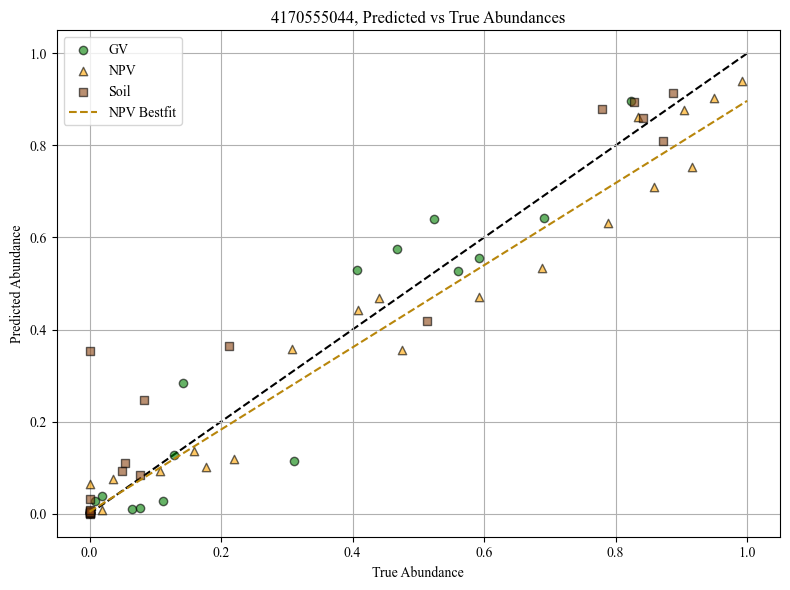

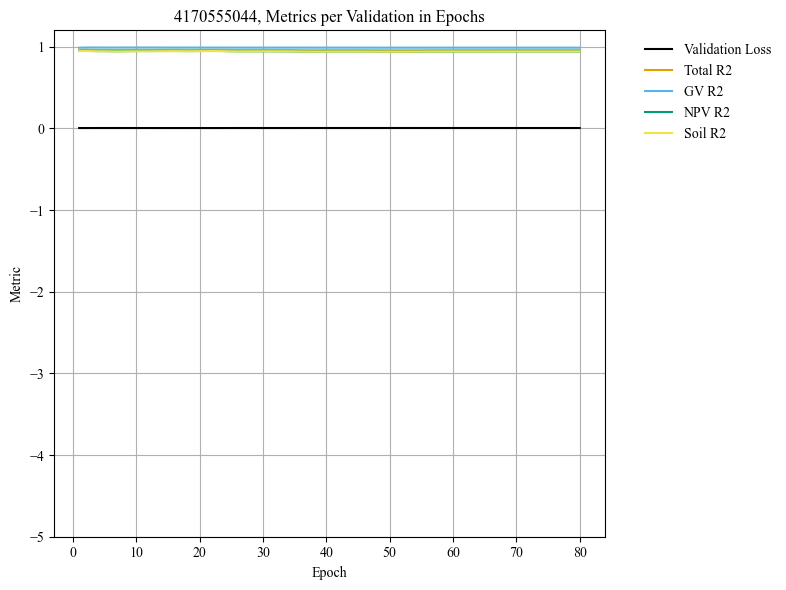

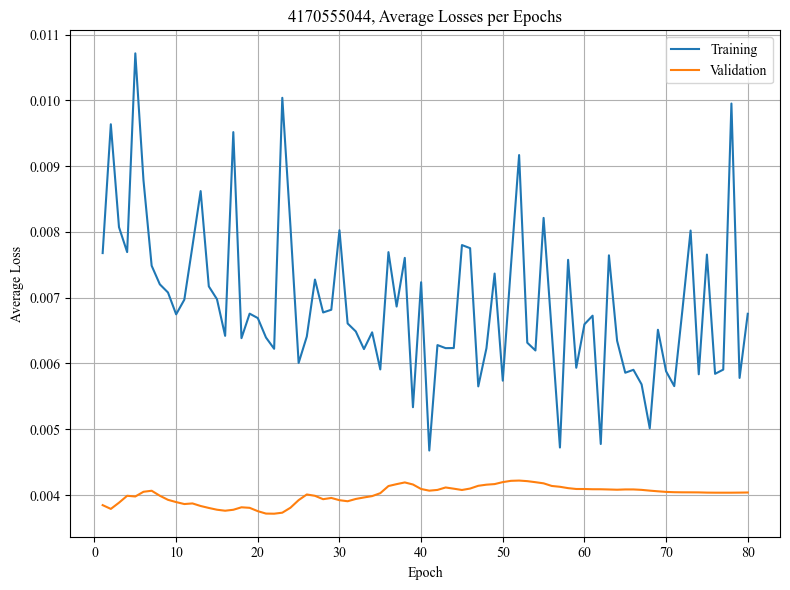

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016699
Epoch 1/80, Step 2/5, Train Loss: 0.007365
Epoch 1/80, Step 3/5, Train Loss: 0.012017
Epoch 1/80, Step 4/5, Train Loss: 0.006077
Epoch 1/80, Step 5/5, Train Loss: 0.004401
Epoch 1/80 complete. Train Loss: 0.009312, Val Loss: 0.007378
Epoch 2/80, Step 1/5, Train Loss: 0.012637
Epoch 2/80, Step 2/5, Train Loss: 0.003201
Epoch 2/80, Step 3/5, Train Loss: 0.007099
Epoch 2/80, Step 4/5, Train Loss: 0.002800
Epoch 2/80, Step 5/5, Train Loss: 0.013066
Epoch 2/80 complete. Train Loss: 0.007760, Val Loss: 0.007782
Epoch 3/80, Step 1/5, Train Loss: 0.010475
Epoch 3/80, Step 2/5, Train Loss: 0.010283
Epoch 3/80, Step 3/5, Train Loss: 0.004456
Epoch 3/80, Step 4/5, Train Loss: 0.010111
Epoch 3/80, Step 5/5, Train Loss: 0.008381
Epoch 3/80 complete. Train Loss: 0.008741, Val Loss: 0.008370
Epoch 4/80, Step 1/5, Train Loss: 0.006564
Epoch 4/80, Step 2/5, Train Loss: 0.006024
Epoch 4/80, Step 3/5, Train Loss: 0.011086
Epoch 4/80, Step 4/5, Train Loss: 0.0072

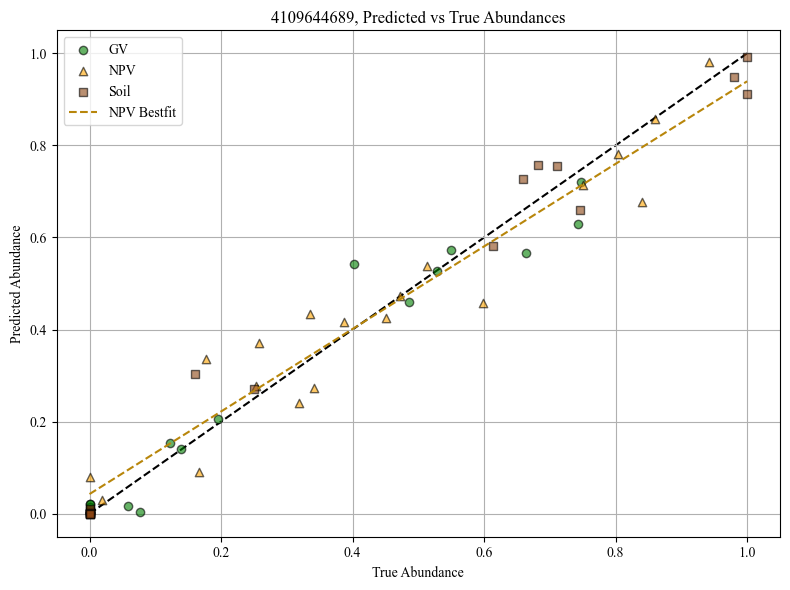

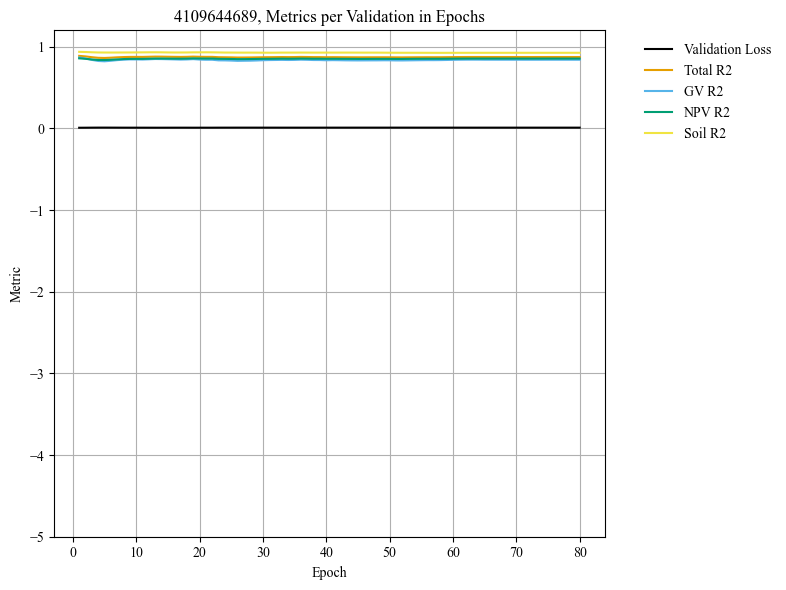

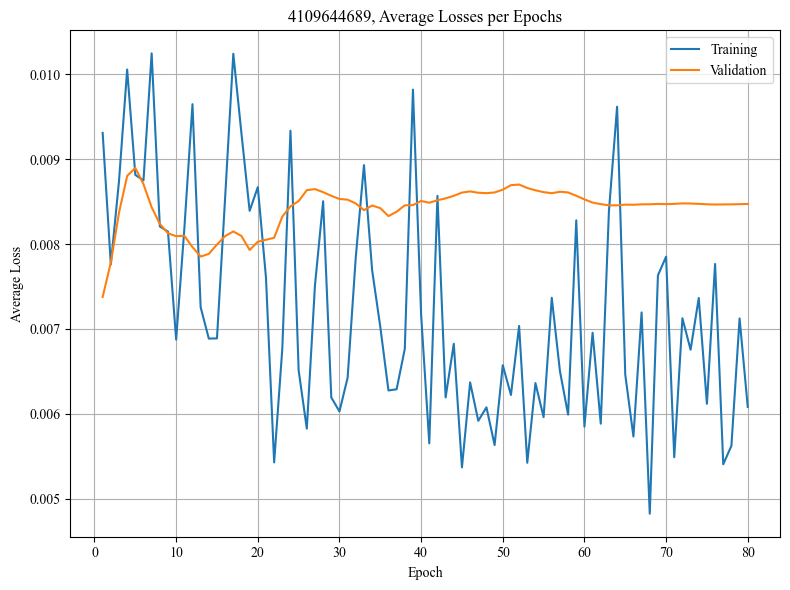

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006189
Epoch 1/80, Step 2/5, Train Loss: 0.006312
Epoch 1/80, Step 3/5, Train Loss: 0.011215
Epoch 1/80, Step 4/5, Train Loss: 0.007417
Epoch 1/80, Step 5/5, Train Loss: 0.009241
Epoch 1/80 complete. Train Loss: 0.008075, Val Loss: 0.007160
Epoch 2/80, Step 1/5, Train Loss: 0.005555
Epoch 2/80, Step 2/5, Train Loss: 0.005994
Epoch 2/80, Step 3/5, Train Loss: 0.006822
Epoch 2/80, Step 4/5, Train Loss: 0.007092
Epoch 2/80, Step 5/5, Train Loss: 0.011853
Epoch 2/80 complete. Train Loss: 0.007463, Val Loss: 0.006818
Epoch 3/80, Step 1/5, Train Loss: 0.009991
Epoch 3/80, Step 2/5, Train Loss: 0.005969
Epoch 3/80, Step 3/5, Train Loss: 0.005733
Epoch 3/80, Step 4/5, Train Loss: 0.008036
Epoch 3/80, Step 5/5, Train Loss: 0.006419
Epoch 3/80 complete. Train Loss: 0.007229, Val Loss: 0.006661
Epoch 4/80, Step 1/5, Train Loss: 0.007344
Epoch 4/80, Step 2/5, Train Loss: 0.010329
Epoch 4/80, Step 3/5, Train Loss: 0.004744
Epoch 4/80, Step 4/5, Train Loss: 0.0063

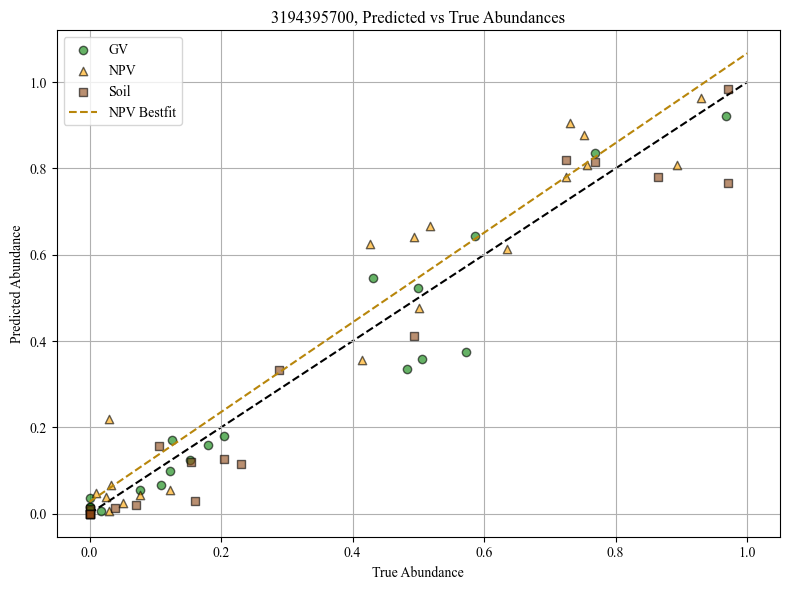

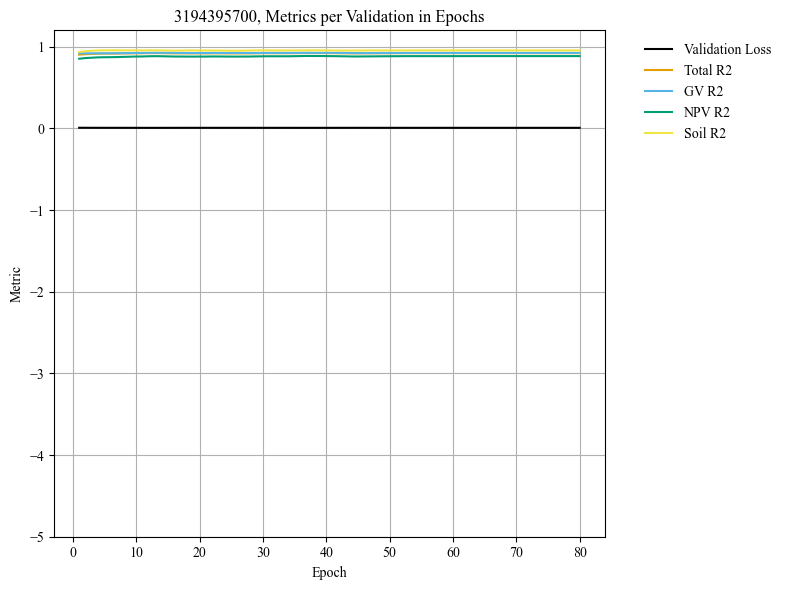

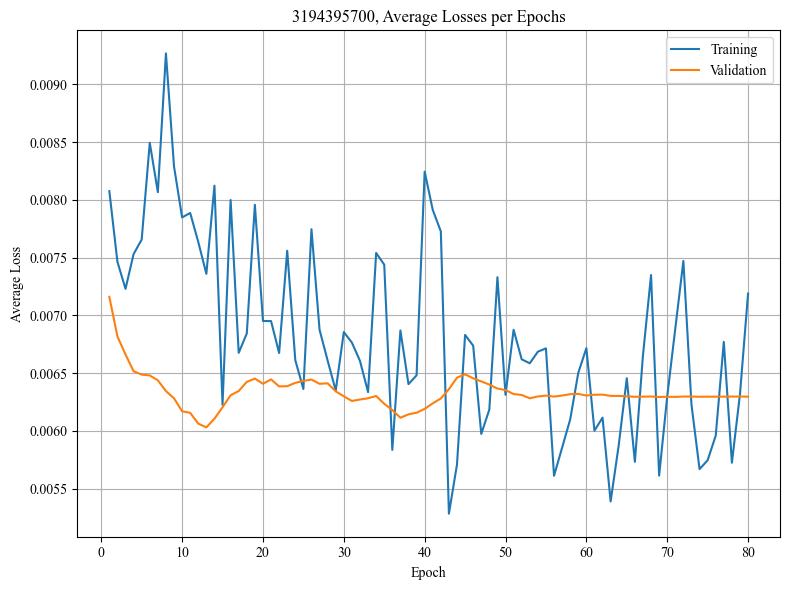

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008258
Epoch 1/80, Step 2/5, Train Loss: 0.005808
Epoch 1/80, Step 3/5, Train Loss: 0.006490
Epoch 1/80, Step 4/5, Train Loss: 0.008889
Epoch 1/80, Step 5/5, Train Loss: 0.004890
Epoch 1/80 complete. Train Loss: 0.006867, Val Loss: 0.006104
Epoch 2/80, Step 1/5, Train Loss: 0.006158
Epoch 2/80, Step 2/5, Train Loss: 0.005202
Epoch 2/80, Step 3/5, Train Loss: 0.005078
Epoch 2/80, Step 4/5, Train Loss: 0.007156
Epoch 2/80, Step 5/5, Train Loss: 0.008400
Epoch 2/80 complete. Train Loss: 0.006399, Val Loss: 0.005895
Epoch 3/80, Step 1/5, Train Loss: 0.005031
Epoch 3/80, Step 2/5, Train Loss: 0.005181
Epoch 3/80, Step 3/5, Train Loss: 0.008442
Epoch 3/80, Step 4/5, Train Loss: 0.007578
Epoch 3/80, Step 5/5, Train Loss: 0.006781
Epoch 3/80 complete. Train Loss: 0.006603, Val Loss: 0.005747
Epoch 4/80, Step 1/5, Train Loss: 0.003589
Epoch 4/80, Step 2/5, Train Loss: 0.003427
Epoch 4/80, Step 3/5, Train Loss: 0.008147
Epoch 4/80, Step 4/5, Train Loss: 0.0118

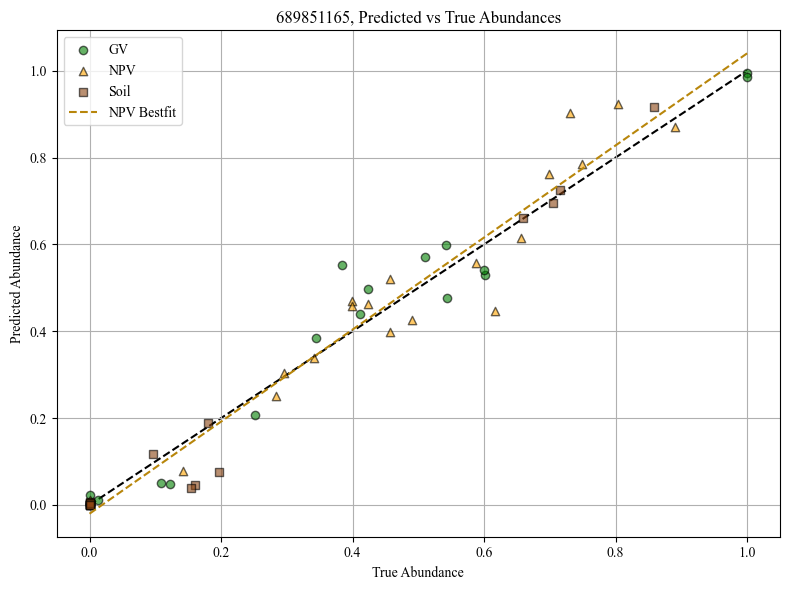

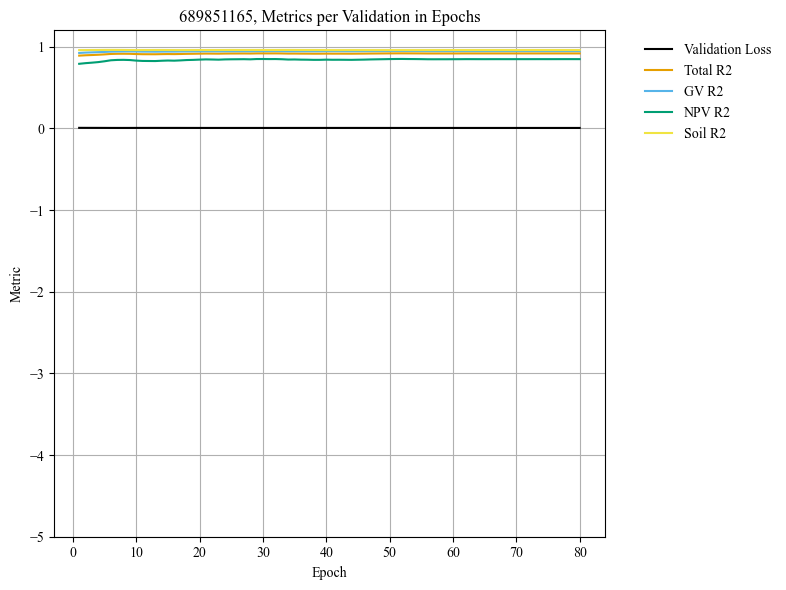

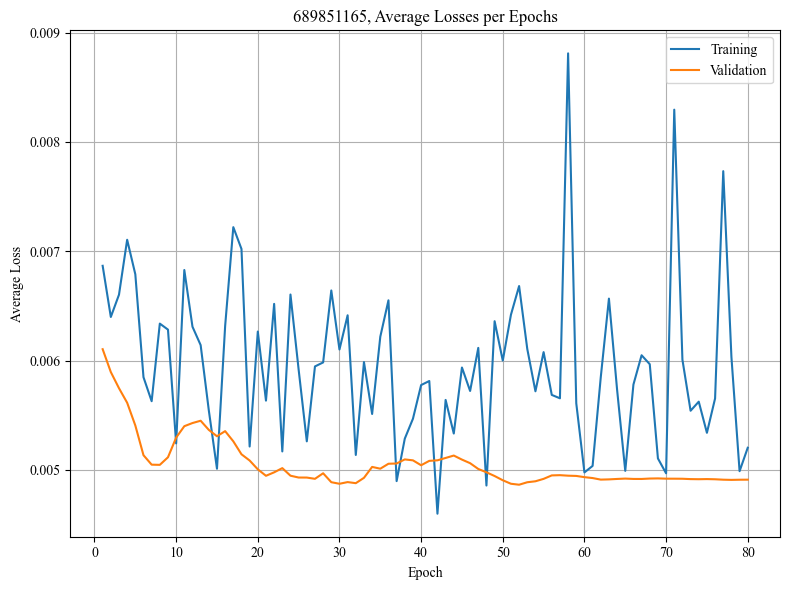

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.003613
Epoch 1/80, Step 2/5, Train Loss: 0.007064
Epoch 1/80, Step 3/5, Train Loss: 0.004082
Epoch 1/80, Step 4/5, Train Loss: 0.005712
Epoch 1/80, Step 5/5, Train Loss: 0.004015
Epoch 1/80 complete. Train Loss: 0.004897, Val Loss: 0.007551
Epoch 2/80, Step 1/5, Train Loss: 0.005705
Epoch 2/80, Step 2/5, Train Loss: 0.006467
Epoch 2/80, Step 3/5, Train Loss: 0.006736
Epoch 2/80, Step 4/5, Train Loss: 0.003018
Epoch 2/80, Step 5/5, Train Loss: 0.003034
Epoch 2/80 complete. Train Loss: 0.004992, Val Loss: 0.007291
Epoch 3/80, Step 1/5, Train Loss: 0.005297
Epoch 3/80, Step 2/5, Train Loss: 0.003958
Epoch 3/80, Step 3/5, Train Loss: 0.005299
Epoch 3/80, Step 4/5, Train Loss: 0.007566
Epoch 3/80, Step 5/5, Train Loss: 0.005312
Epoch 3/80 complete. Train Loss: 0.005486, Val Loss: 0.007168
Epoch 4/80, Step 1/5, Train Loss: 0.003955
Epoch 4/80, Step 2/5, Train Loss: 0.003338
Epoch 4/80, Step 3/5, Train Loss: 0.004592
Epoch 4/80, Step 4/5, Train Loss: 0.0053

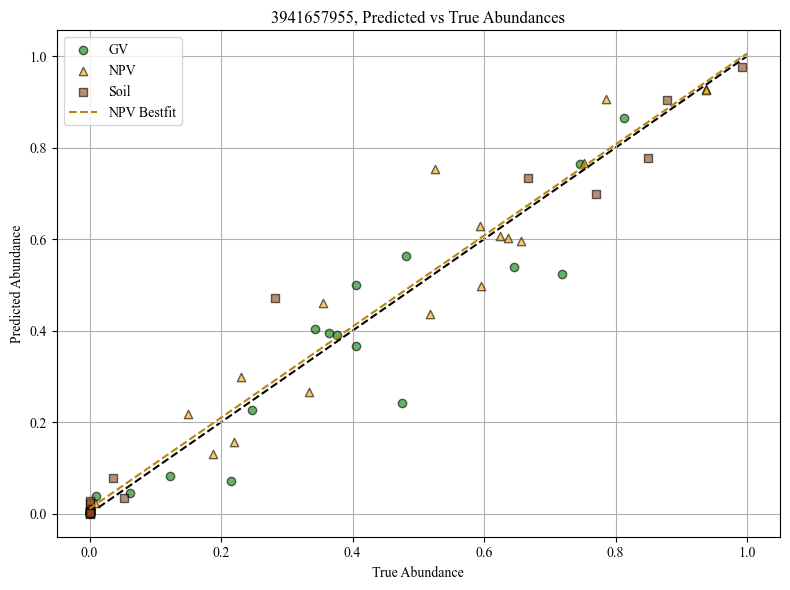

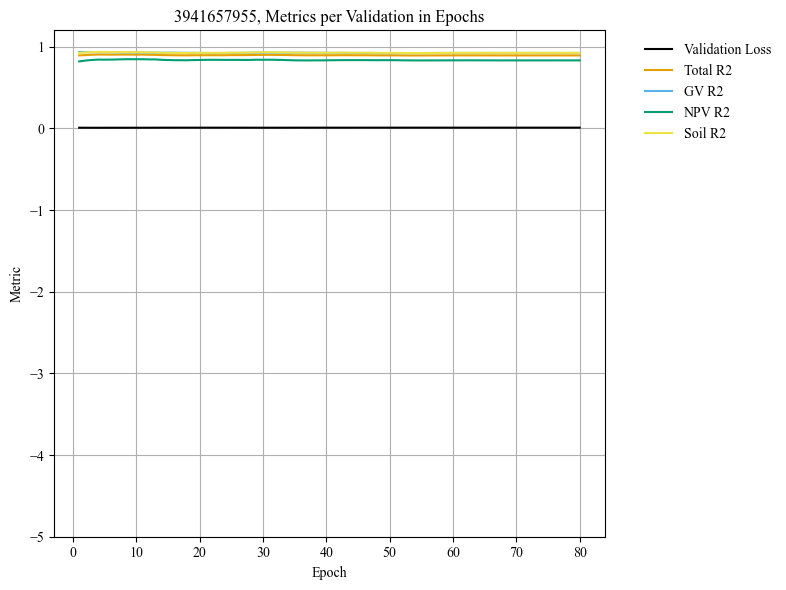

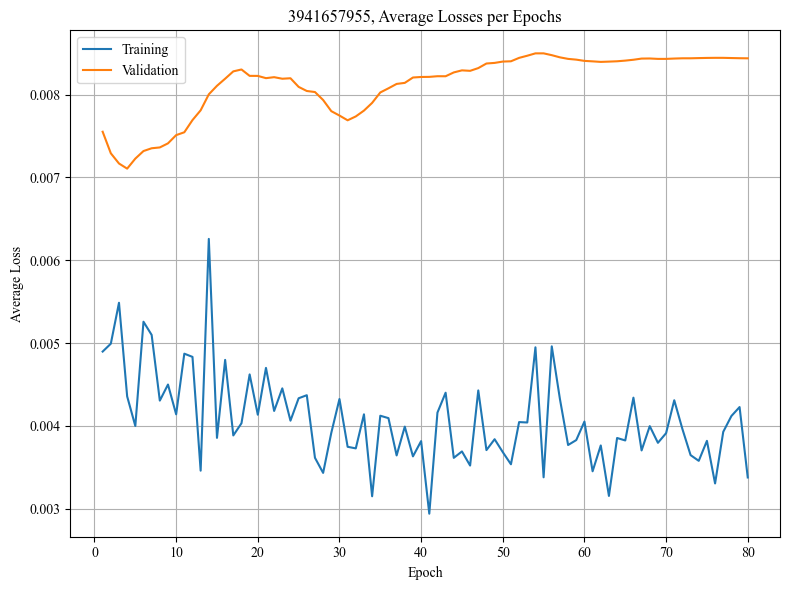

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015564
Epoch 1/80, Step 2/5, Train Loss: 0.005291
Epoch 1/80, Step 3/5, Train Loss: 0.008995
Epoch 1/80, Step 4/5, Train Loss: 0.009400
Epoch 1/80, Step 5/5, Train Loss: 0.005025
Epoch 1/80 complete. Train Loss: 0.008855, Val Loss: 0.005116
Epoch 2/80, Step 1/5, Train Loss: 0.008269
Epoch 2/80, Step 2/5, Train Loss: 0.007557
Epoch 2/80, Step 3/5, Train Loss: 0.007245
Epoch 2/80, Step 4/5, Train Loss: 0.006627
Epoch 2/80, Step 5/5, Train Loss: 0.004245
Epoch 2/80 complete. Train Loss: 0.006788, Val Loss: 0.005144
Epoch 3/80, Step 1/5, Train Loss: 0.012971
Epoch 3/80, Step 2/5, Train Loss: 0.006675
Epoch 3/80, Step 3/5, Train Loss: 0.005987
Epoch 3/80, Step 4/5, Train Loss: 0.005221
Epoch 3/80, Step 5/5, Train Loss: 0.007064
Epoch 3/80 complete. Train Loss: 0.007584, Val Loss: 0.005181
Epoch 4/80, Step 1/5, Train Loss: 0.009265
Epoch 4/80, Step 2/5, Train Loss: 0.008184
Epoch 4/80, Step 3/5, Train Loss: 0.004676
Epoch 4/80, Step 4/5, Train Loss: 0.0098

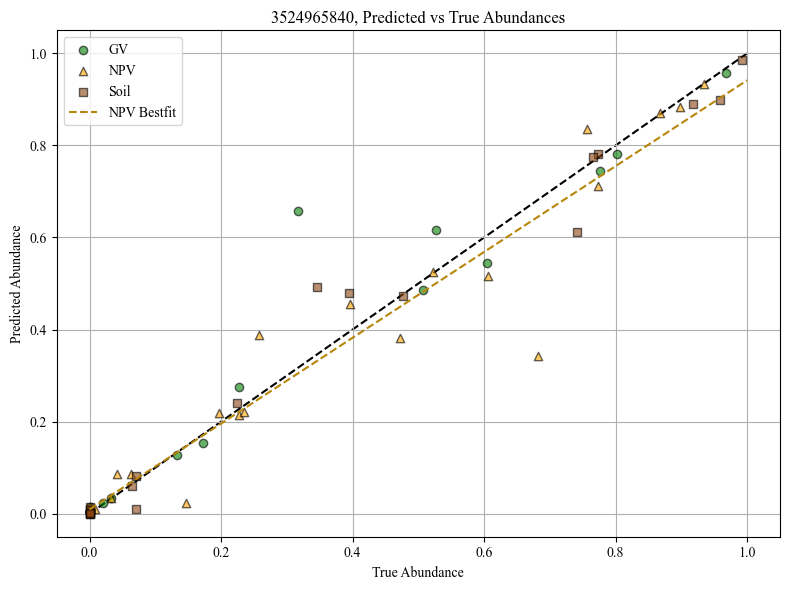

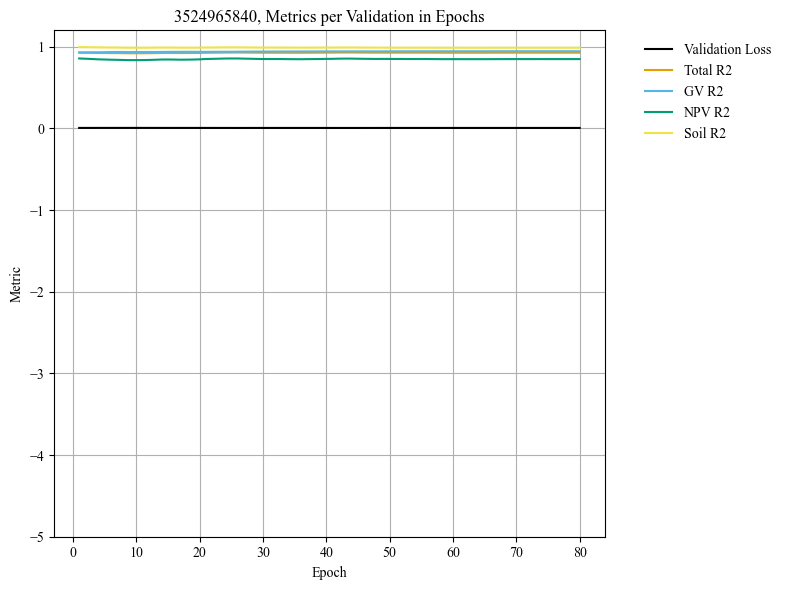

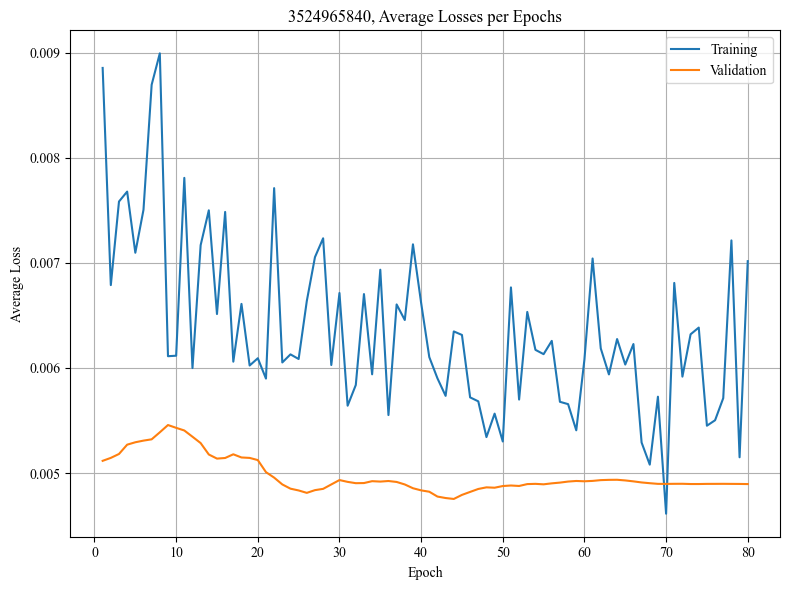

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011575
Epoch 1/80, Step 2/5, Train Loss: 0.007719
Epoch 1/80, Step 3/5, Train Loss: 0.012519
Epoch 1/80, Step 4/5, Train Loss: 0.004950
Epoch 1/80, Step 5/5, Train Loss: 0.005398
Epoch 1/80 complete. Train Loss: 0.008432, Val Loss: 0.011731
Epoch 2/80, Step 1/5, Train Loss: 0.006263
Epoch 2/80, Step 2/5, Train Loss: 0.007337
Epoch 2/80, Step 3/5, Train Loss: 0.014367
Epoch 2/80, Step 4/5, Train Loss: 0.005160
Epoch 2/80, Step 5/5, Train Loss: 0.008893
Epoch 2/80 complete. Train Loss: 0.008404, Val Loss: 0.010591
Epoch 3/80, Step 1/5, Train Loss: 0.009442
Epoch 3/80, Step 2/5, Train Loss: 0.005042
Epoch 3/80, Step 3/5, Train Loss: 0.006317
Epoch 3/80, Step 4/5, Train Loss: 0.007798
Epoch 3/80, Step 5/5, Train Loss: 0.008543
Epoch 3/80 complete. Train Loss: 0.007428, Val Loss: 0.009693
Epoch 4/80, Step 1/5, Train Loss: 0.008393
Epoch 4/80, Step 2/5, Train Loss: 0.007476
Epoch 4/80, Step 3/5, Train Loss: 0.004724
Epoch 4/80, Step 4/5, Train Loss: 0.0144

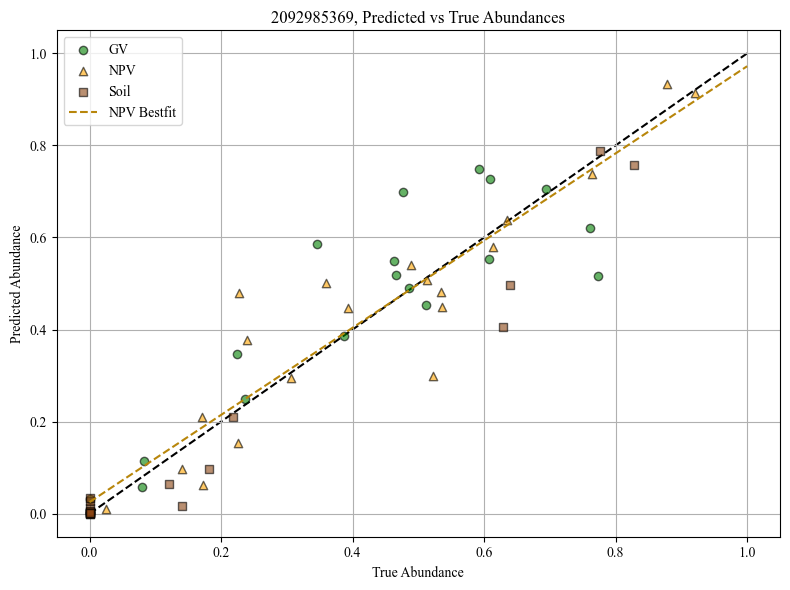

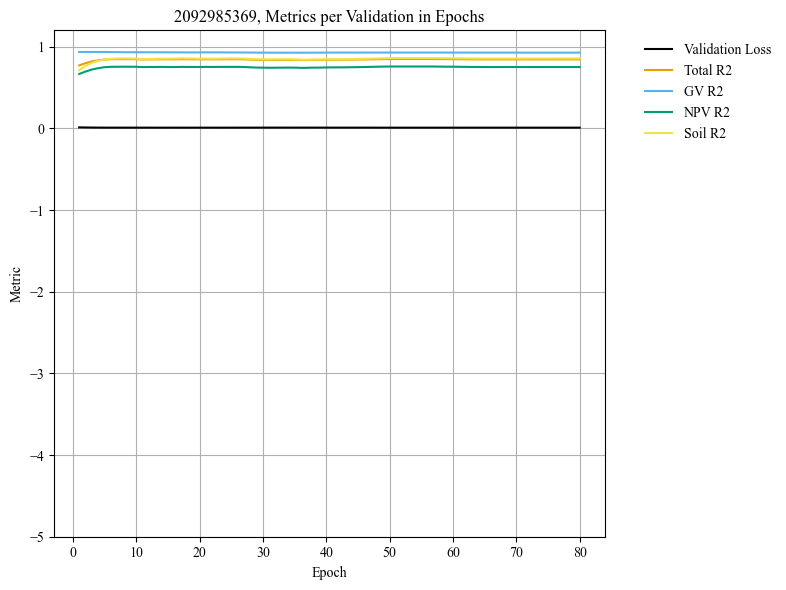

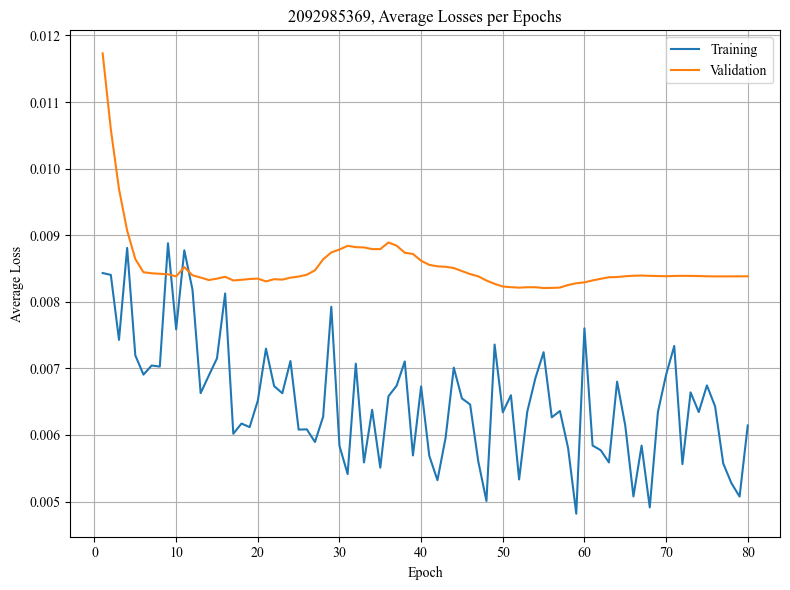

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016015
Epoch 1/80, Step 2/5, Train Loss: 0.025258
Epoch 1/80, Step 3/5, Train Loss: 0.012383
Epoch 1/80, Step 4/5, Train Loss: 0.014638
Epoch 1/80, Step 5/5, Train Loss: 0.009424
Epoch 1/80 complete. Train Loss: 0.015544, Val Loss: 0.009648
Epoch 2/80, Step 1/5, Train Loss: 0.006107
Epoch 2/80, Step 2/5, Train Loss: 0.022954
Epoch 2/80, Step 3/5, Train Loss: 0.012752
Epoch 2/80, Step 4/5, Train Loss: 0.010656
Epoch 2/80, Step 5/5, Train Loss: 0.010561
Epoch 2/80 complete. Train Loss: 0.012606, Val Loss: 0.009240
Epoch 3/80, Step 1/5, Train Loss: 0.006872
Epoch 3/80, Step 2/5, Train Loss: 0.012617
Epoch 3/80, Step 3/5, Train Loss: 0.032215
Epoch 3/80, Step 4/5, Train Loss: 0.008666
Epoch 3/80, Step 5/5, Train Loss: 0.007968
Epoch 3/80 complete. Train Loss: 0.013668, Val Loss: 0.009027
Epoch 4/80, Step 1/5, Train Loss: 0.029463
Epoch 4/80, Step 2/5, Train Loss: 0.008039
Epoch 4/80, Step 3/5, Train Loss: 0.010139
Epoch 4/80, Step 4/5, Train Loss: 0.0088

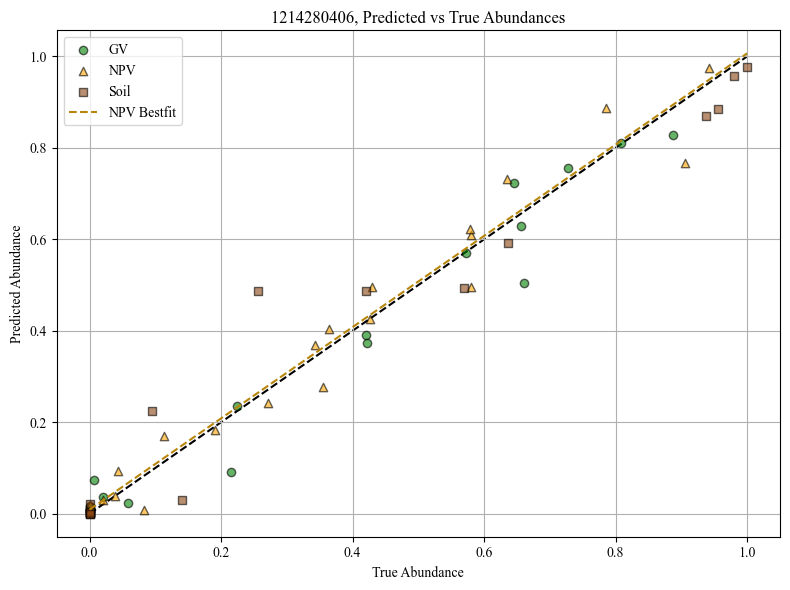

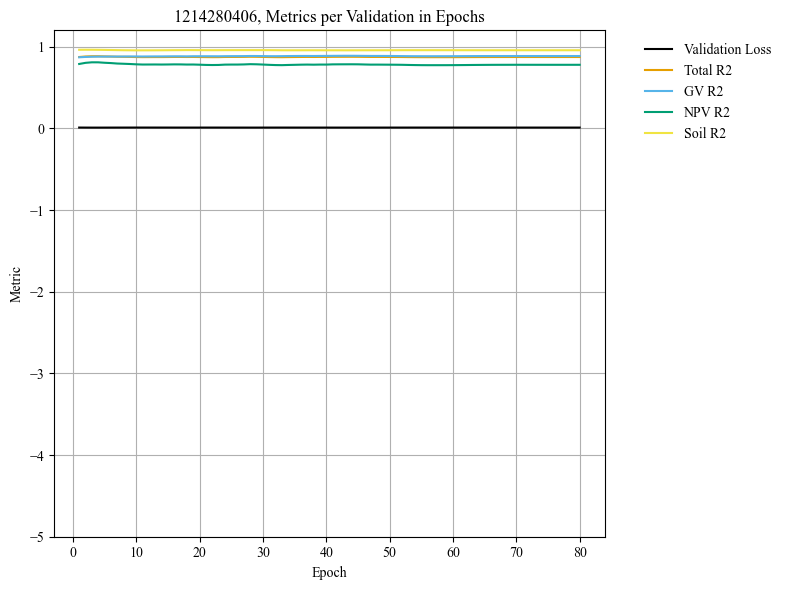

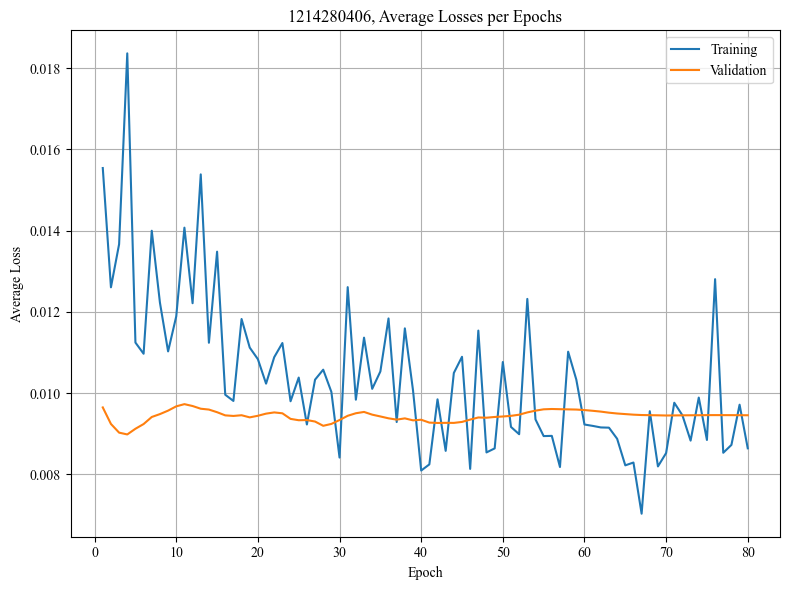

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005437
Epoch 1/80, Step 2/5, Train Loss: 0.005816
Epoch 1/80, Step 3/5, Train Loss: 0.004217
Epoch 1/80, Step 4/5, Train Loss: 0.007732
Epoch 1/80, Step 5/5, Train Loss: 0.006285
Epoch 1/80 complete. Train Loss: 0.005897, Val Loss: 0.004207
Epoch 2/80, Step 1/5, Train Loss: 0.006605
Epoch 2/80, Step 2/5, Train Loss: 0.006212
Epoch 2/80, Step 3/5, Train Loss: 0.005115
Epoch 2/80, Step 4/5, Train Loss: 0.007963
Epoch 2/80, Step 5/5, Train Loss: 0.002698
Epoch 2/80 complete. Train Loss: 0.005718, Val Loss: 0.003936
Epoch 3/80, Step 1/5, Train Loss: 0.003710
Epoch 3/80, Step 2/5, Train Loss: 0.005774
Epoch 3/80, Step 3/5, Train Loss: 0.004869
Epoch 3/80, Step 4/5, Train Loss: 0.004625
Epoch 3/80, Step 5/5, Train Loss: 0.007019
Epoch 3/80 complete. Train Loss: 0.005199, Val Loss: 0.003752
Epoch 4/80, Step 1/5, Train Loss: 0.006054
Epoch 4/80, Step 2/5, Train Loss: 0.005384
Epoch 4/80, Step 3/5, Train Loss: 0.003970
Epoch 4/80, Step 4/5, Train Loss: 0.0054

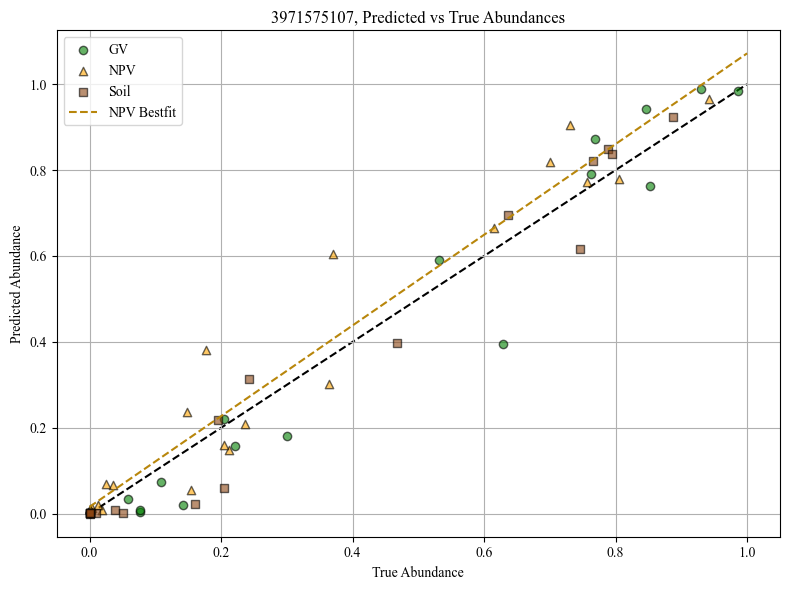

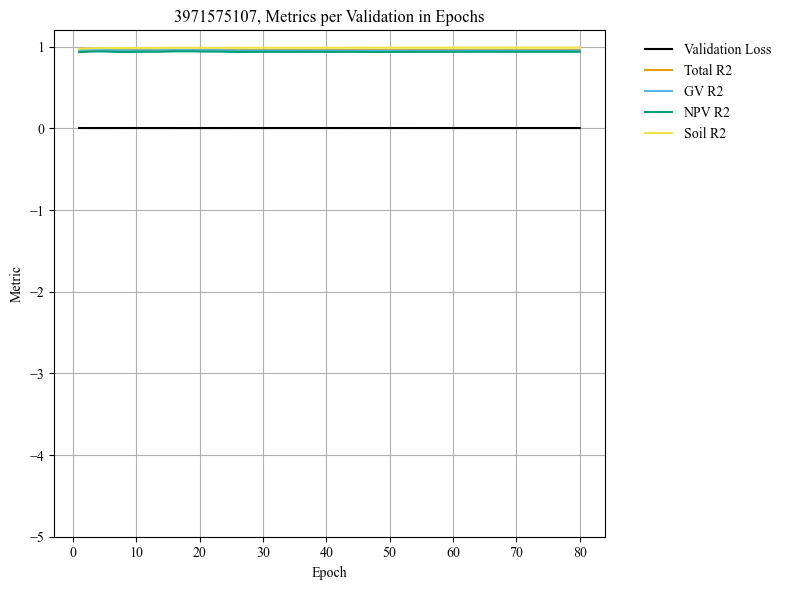

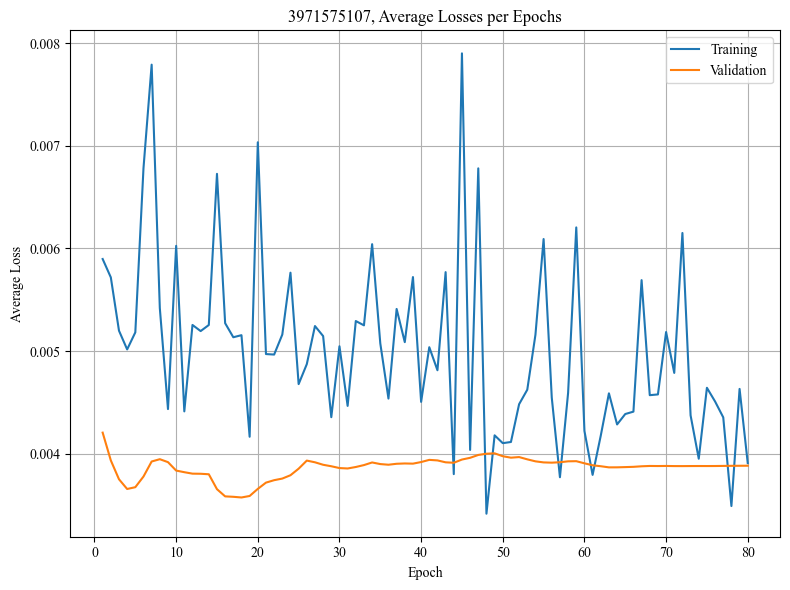

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016178
Epoch 1/80, Step 2/5, Train Loss: 0.018083
Epoch 1/80, Step 3/5, Train Loss: 0.015838
Epoch 1/80, Step 4/5, Train Loss: 0.007256
Epoch 1/80, Step 5/5, Train Loss: 0.010580
Epoch 1/80 complete. Train Loss: 0.013587, Val Loss: 0.007990
Epoch 2/80, Step 1/5, Train Loss: 0.010615
Epoch 2/80, Step 2/5, Train Loss: 0.015174
Epoch 2/80, Step 3/5, Train Loss: 0.012439
Epoch 2/80, Step 4/5, Train Loss: 0.023500
Epoch 2/80, Step 5/5, Train Loss: 0.011433
Epoch 2/80 complete. Train Loss: 0.014632, Val Loss: 0.007448
Epoch 3/80, Step 1/5, Train Loss: 0.018376
Epoch 3/80, Step 2/5, Train Loss: 0.012952
Epoch 3/80, Step 3/5, Train Loss: 0.012966
Epoch 3/80, Step 4/5, Train Loss: 0.010939
Epoch 3/80, Step 5/5, Train Loss: 0.010197
Epoch 3/80 complete. Train Loss: 0.013086, Val Loss: 0.007028
Epoch 4/80, Step 1/5, Train Loss: 0.019912
Epoch 4/80, Step 2/5, Train Loss: 0.007228
Epoch 4/80, Step 3/5, Train Loss: 0.010300
Epoch 4/80, Step 4/5, Train Loss: 0.0086

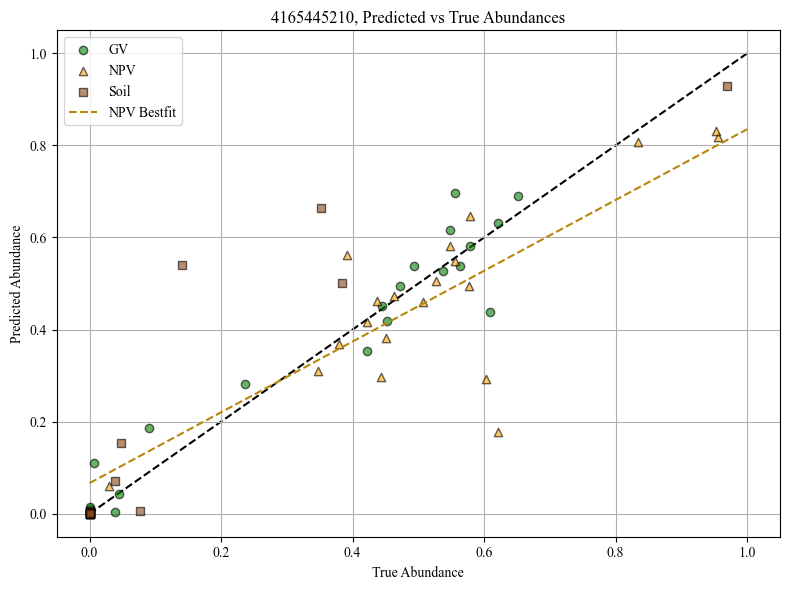

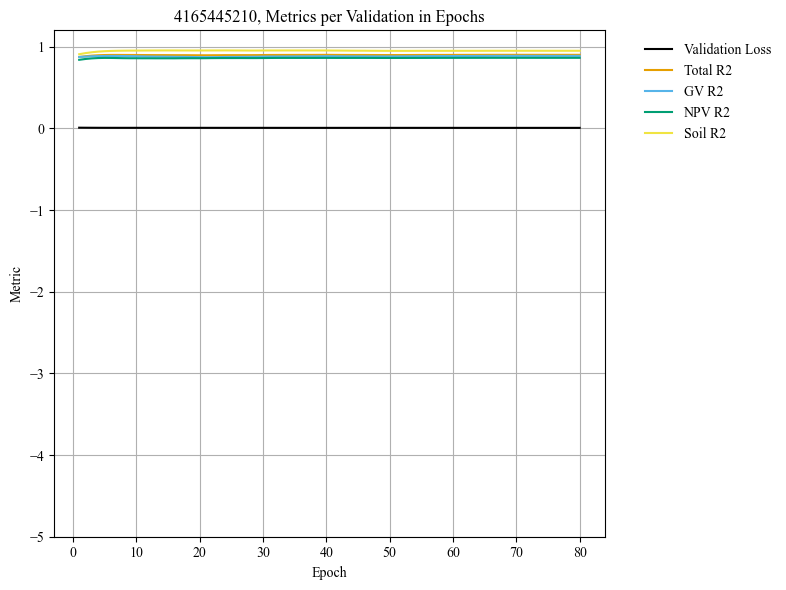

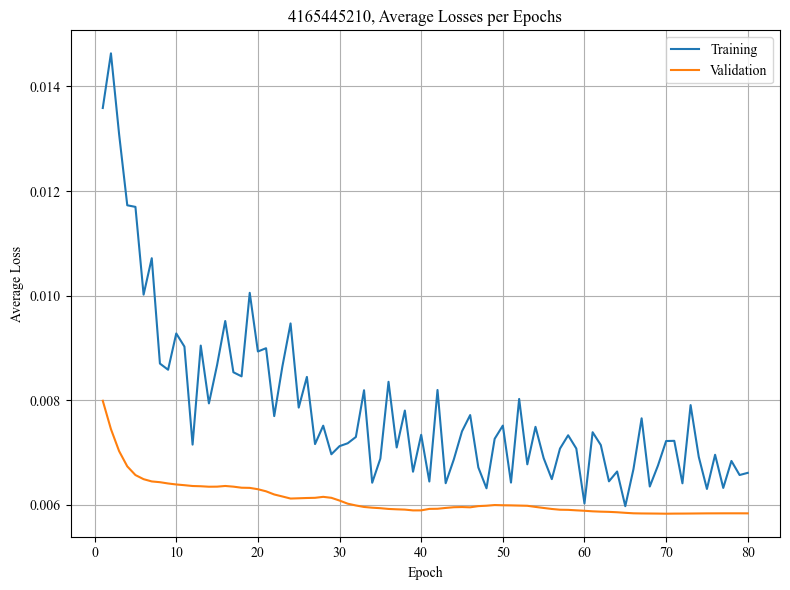

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006704
Epoch 1/80, Step 2/5, Train Loss: 0.012523
Epoch 1/80, Step 3/5, Train Loss: 0.017552
Epoch 1/80, Step 4/5, Train Loss: 0.015487
Epoch 1/80, Step 5/5, Train Loss: 0.008786
Epoch 1/80 complete. Train Loss: 0.012210, Val Loss: 0.007045
Epoch 2/80, Step 1/5, Train Loss: 0.006509
Epoch 2/80, Step 2/5, Train Loss: 0.015740
Epoch 2/80, Step 3/5, Train Loss: 0.012531
Epoch 2/80, Step 4/5, Train Loss: 0.009835
Epoch 2/80, Step 5/5, Train Loss: 0.009195
Epoch 2/80 complete. Train Loss: 0.010762, Val Loss: 0.006757
Epoch 3/80, Step 1/5, Train Loss: 0.016256
Epoch 3/80, Step 2/5, Train Loss: 0.007247
Epoch 3/80, Step 3/5, Train Loss: 0.010027
Epoch 3/80, Step 4/5, Train Loss: 0.007123
Epoch 3/80, Step 5/5, Train Loss: 0.003814
Epoch 3/80 complete. Train Loss: 0.008894, Val Loss: 0.006546
Epoch 4/80, Step 1/5, Train Loss: 0.007286
Epoch 4/80, Step 2/5, Train Loss: 0.009585
Epoch 4/80, Step 3/5, Train Loss: 0.007317
Epoch 4/80, Step 4/5, Train Loss: 0.0051

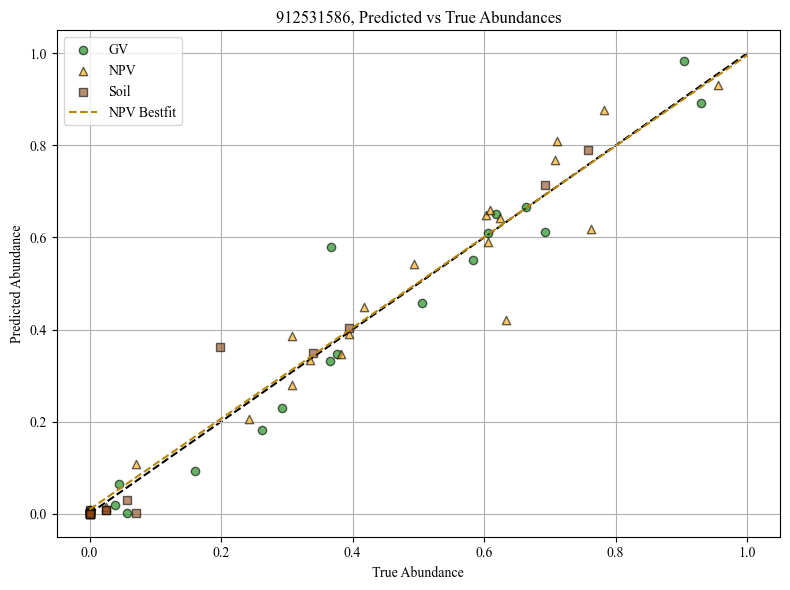

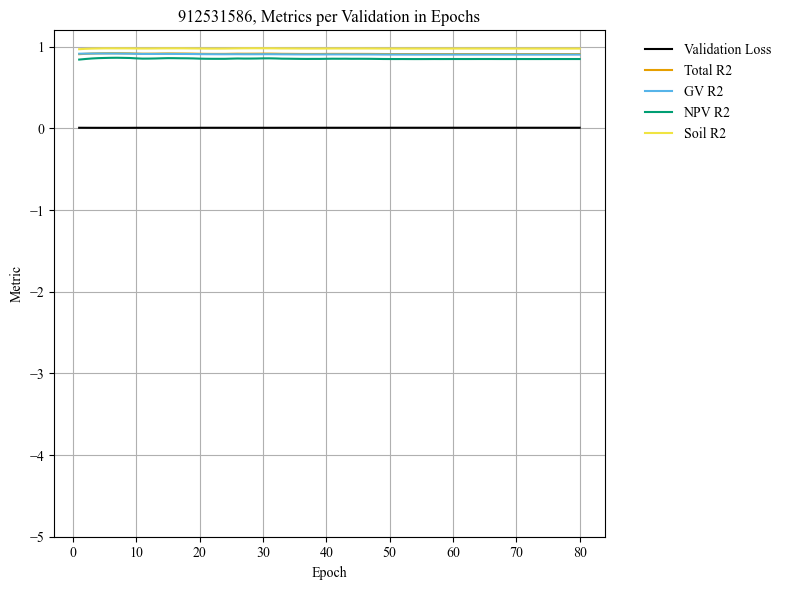

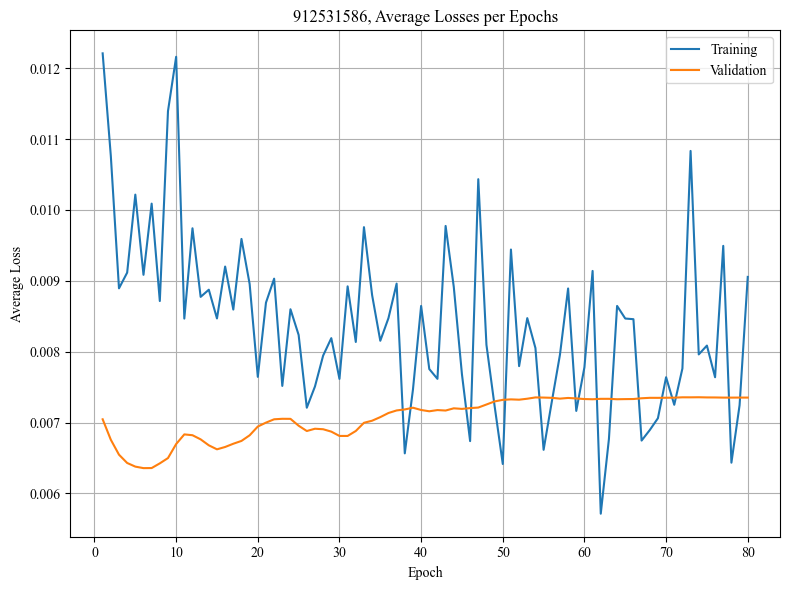

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021563
Epoch 1/80, Step 2/5, Train Loss: 0.002614
Epoch 1/80, Step 3/5, Train Loss: 0.007601
Epoch 1/80, Step 4/5, Train Loss: 0.006138
Epoch 1/80, Step 5/5, Train Loss: 0.013036
Epoch 1/80 complete. Train Loss: 0.010191, Val Loss: 0.008718
Epoch 2/80, Step 1/5, Train Loss: 0.008748
Epoch 2/80, Step 2/5, Train Loss: 0.010021
Epoch 2/80, Step 3/5, Train Loss: 0.007154
Epoch 2/80, Step 4/5, Train Loss: 0.012135
Epoch 2/80, Step 5/5, Train Loss: 0.007473
Epoch 2/80 complete. Train Loss: 0.009106, Val Loss: 0.008531
Epoch 3/80, Step 1/5, Train Loss: 0.012352
Epoch 3/80, Step 2/5, Train Loss: 0.008891
Epoch 3/80, Step 3/5, Train Loss: 0.007835
Epoch 3/80, Step 4/5, Train Loss: 0.017870
Epoch 3/80, Step 5/5, Train Loss: 0.006086
Epoch 3/80 complete. Train Loss: 0.010607, Val Loss: 0.008424
Epoch 4/80, Step 1/5, Train Loss: 0.008716
Epoch 4/80, Step 2/5, Train Loss: 0.005876
Epoch 4/80, Step 3/5, Train Loss: 0.010065
Epoch 4/80, Step 4/5, Train Loss: 0.0080

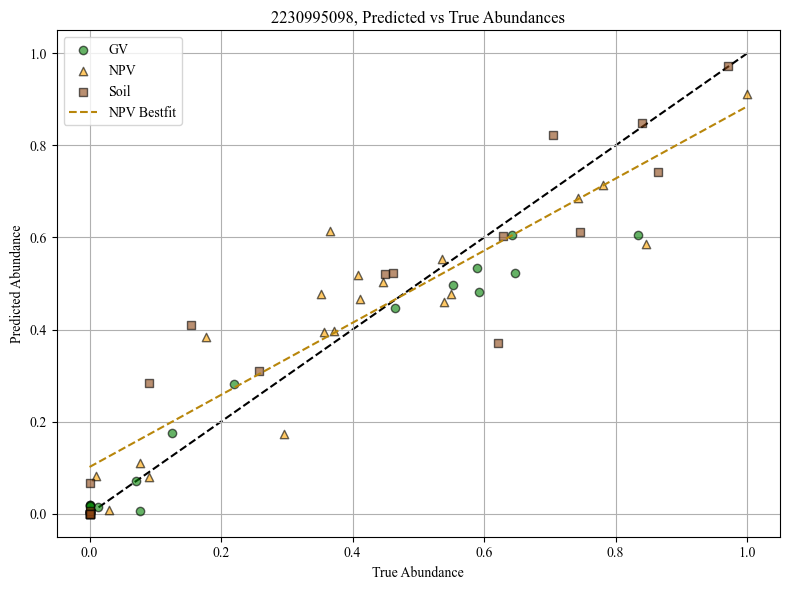

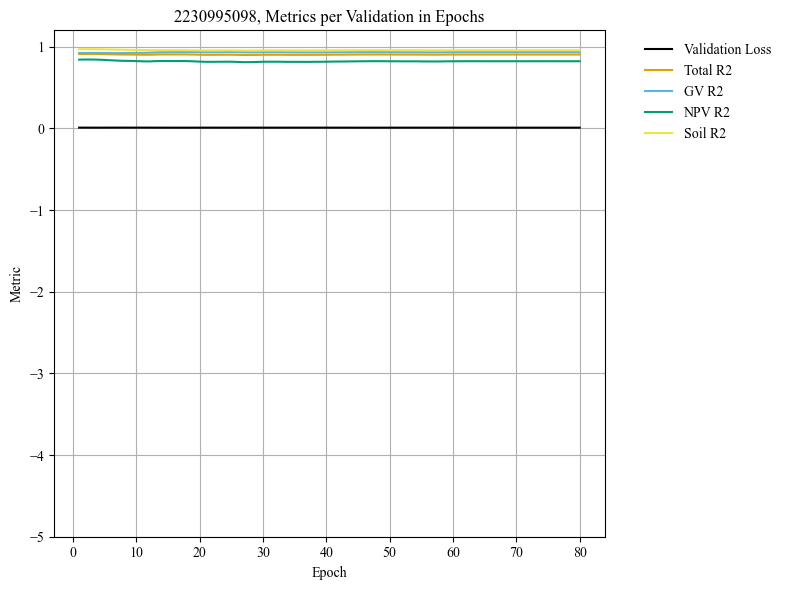

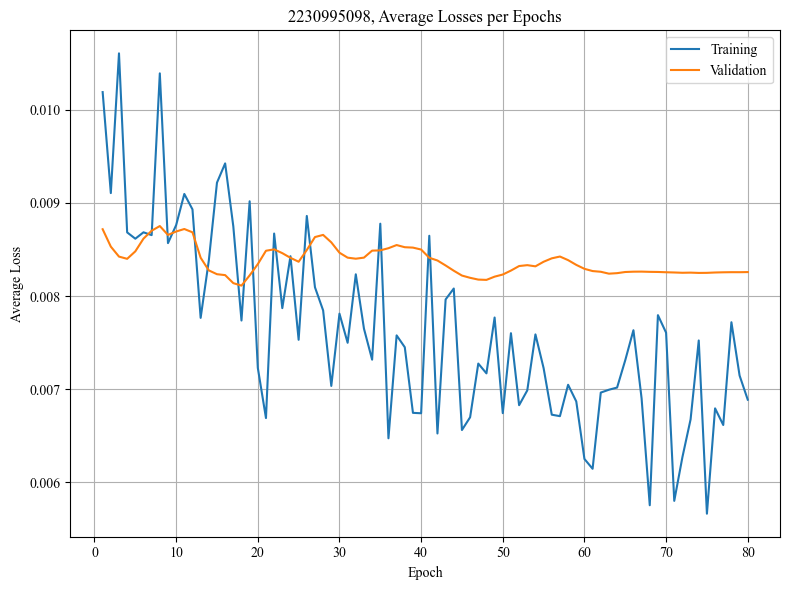

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010027
Epoch 1/80, Step 2/5, Train Loss: 0.017738
Epoch 1/80, Step 3/5, Train Loss: 0.011744
Epoch 1/80, Step 4/5, Train Loss: 0.007537
Epoch 1/80, Step 5/5, Train Loss: 0.010800
Epoch 1/80 complete. Train Loss: 0.011569, Val Loss: 0.018132
Epoch 2/80, Step 1/5, Train Loss: 0.016454
Epoch 2/80, Step 2/5, Train Loss: 0.008872
Epoch 2/80, Step 3/5, Train Loss: 0.009089
Epoch 2/80, Step 4/5, Train Loss: 0.010482
Epoch 2/80, Step 5/5, Train Loss: 0.011224
Epoch 2/80 complete. Train Loss: 0.011224, Val Loss: 0.017554
Epoch 3/80, Step 1/5, Train Loss: 0.009754
Epoch 3/80, Step 2/5, Train Loss: 0.006720
Epoch 3/80, Step 3/5, Train Loss: 0.012949
Epoch 3/80, Step 4/5, Train Loss: 0.007183
Epoch 3/80, Step 5/5, Train Loss: 0.015438
Epoch 3/80 complete. Train Loss: 0.010409, Val Loss: 0.017332
Epoch 4/80, Step 1/5, Train Loss: 0.011332
Epoch 4/80, Step 2/5, Train Loss: 0.006552
Epoch 4/80, Step 3/5, Train Loss: 0.014857
Epoch 4/80, Step 4/5, Train Loss: 0.0118

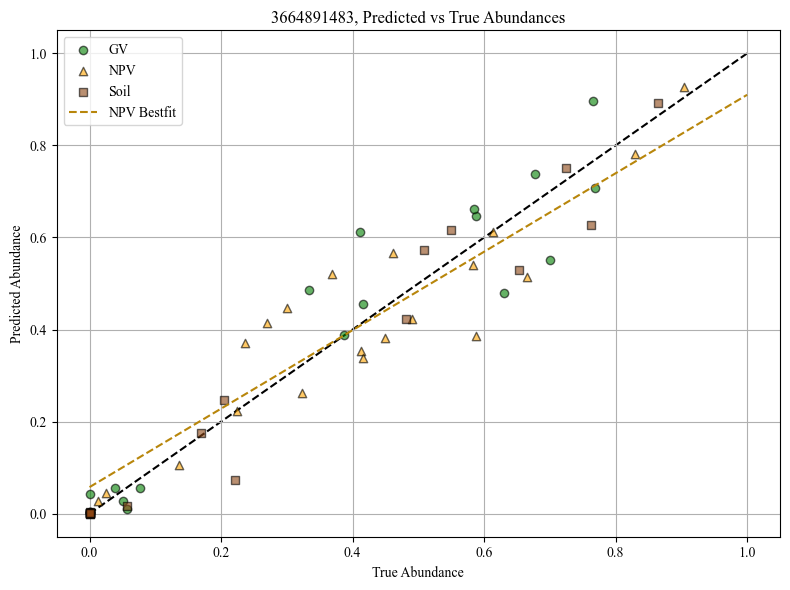

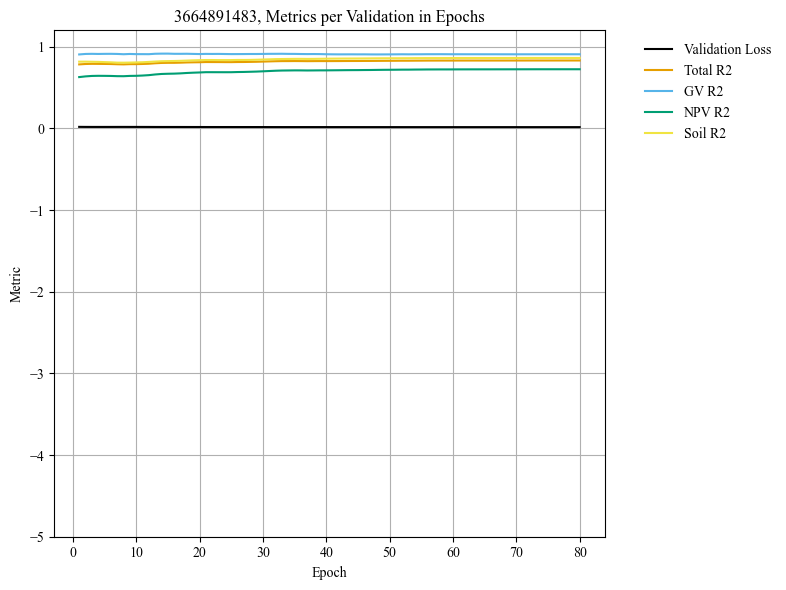

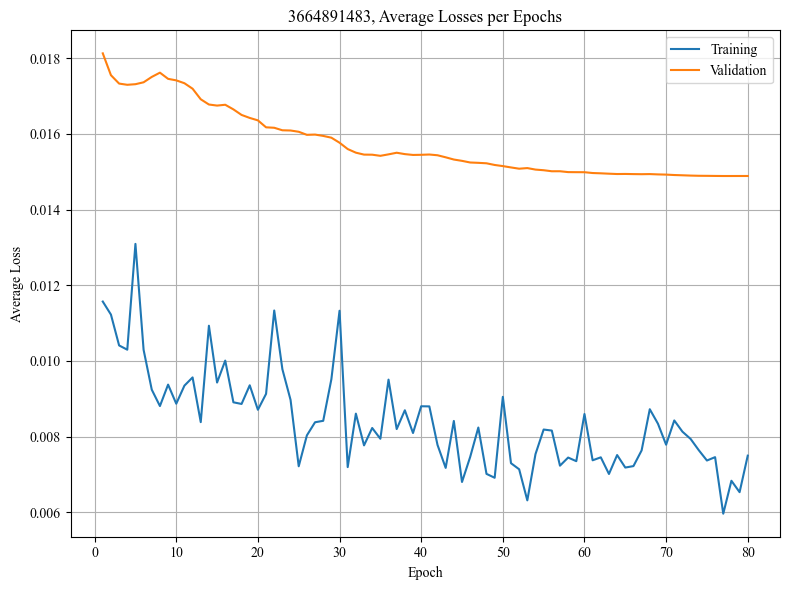

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006526
Epoch 1/80, Step 2/5, Train Loss: 0.005656
Epoch 1/80, Step 3/5, Train Loss: 0.007395
Epoch 1/80, Step 4/5, Train Loss: 0.007470
Epoch 1/80, Step 5/5, Train Loss: 0.006238
Epoch 1/80 complete. Train Loss: 0.006657, Val Loss: 0.003951
Epoch 2/80, Step 1/5, Train Loss: 0.010939
Epoch 2/80, Step 2/5, Train Loss: 0.006151
Epoch 2/80, Step 3/5, Train Loss: 0.012207
Epoch 2/80, Step 4/5, Train Loss: 0.005150
Epoch 2/80, Step 5/5, Train Loss: 0.007715
Epoch 2/80 complete. Train Loss: 0.008432, Val Loss: 0.004282
Epoch 3/80, Step 1/5, Train Loss: 0.009299
Epoch 3/80, Step 2/5, Train Loss: 0.009659
Epoch 3/80, Step 3/5, Train Loss: 0.008698
Epoch 3/80, Step 4/5, Train Loss: 0.003664
Epoch 3/80, Step 5/5, Train Loss: 0.002928
Epoch 3/80 complete. Train Loss: 0.006850, Val Loss: 0.004646
Epoch 4/80, Step 1/5, Train Loss: 0.008683
Epoch 4/80, Step 2/5, Train Loss: 0.012911
Epoch 4/80, Step 3/5, Train Loss: 0.005863
Epoch 4/80, Step 4/5, Train Loss: 0.0092

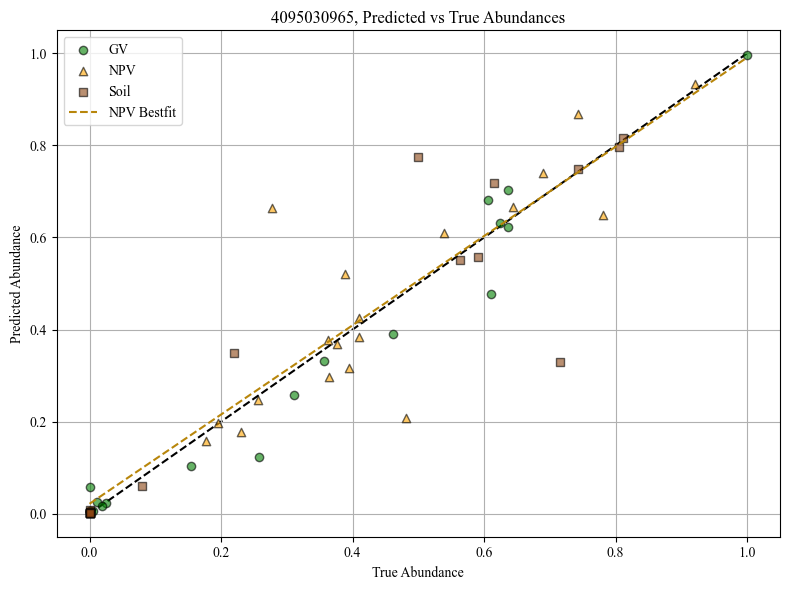

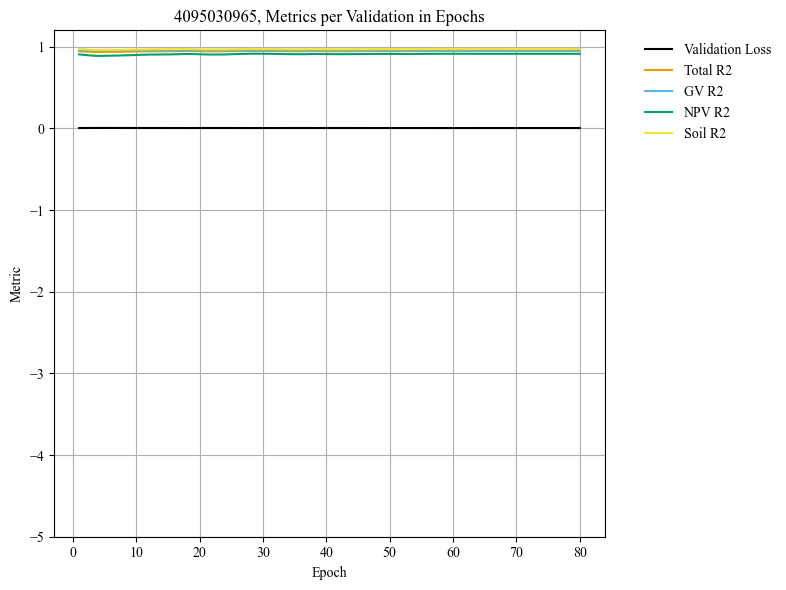

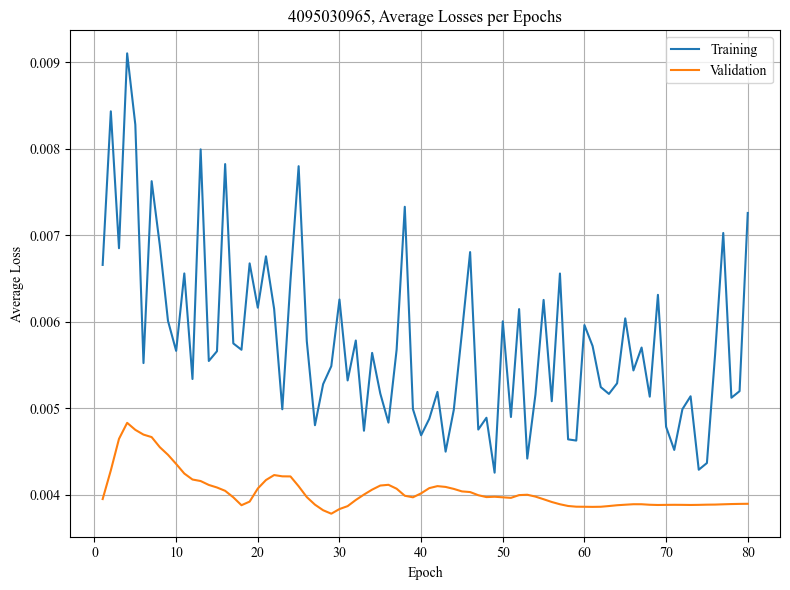

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005275
Epoch 1/80, Step 2/5, Train Loss: 0.012473
Epoch 1/80, Step 3/5, Train Loss: 0.017172
Epoch 1/80, Step 4/5, Train Loss: 0.009454
Epoch 1/80, Step 5/5, Train Loss: 0.014639
Epoch 1/80 complete. Train Loss: 0.011803, Val Loss: 0.010796
Epoch 2/80, Step 1/5, Train Loss: 0.010148
Epoch 2/80, Step 2/5, Train Loss: 0.013716
Epoch 2/80, Step 3/5, Train Loss: 0.014412
Epoch 2/80, Step 4/5, Train Loss: 0.009596
Epoch 2/80, Step 5/5, Train Loss: 0.008394
Epoch 2/80 complete. Train Loss: 0.011253, Val Loss: 0.009869
Epoch 3/80, Step 1/5, Train Loss: 0.005091
Epoch 3/80, Step 2/5, Train Loss: 0.009494
Epoch 3/80, Step 3/5, Train Loss: 0.014937
Epoch 3/80, Step 4/5, Train Loss: 0.009402
Epoch 3/80, Step 5/5, Train Loss: 0.006261
Epoch 3/80 complete. Train Loss: 0.009037, Val Loss: 0.009330
Epoch 4/80, Step 1/5, Train Loss: 0.003952
Epoch 4/80, Step 2/5, Train Loss: 0.019242
Epoch 4/80, Step 3/5, Train Loss: 0.006047
Epoch 4/80, Step 4/5, Train Loss: 0.0072

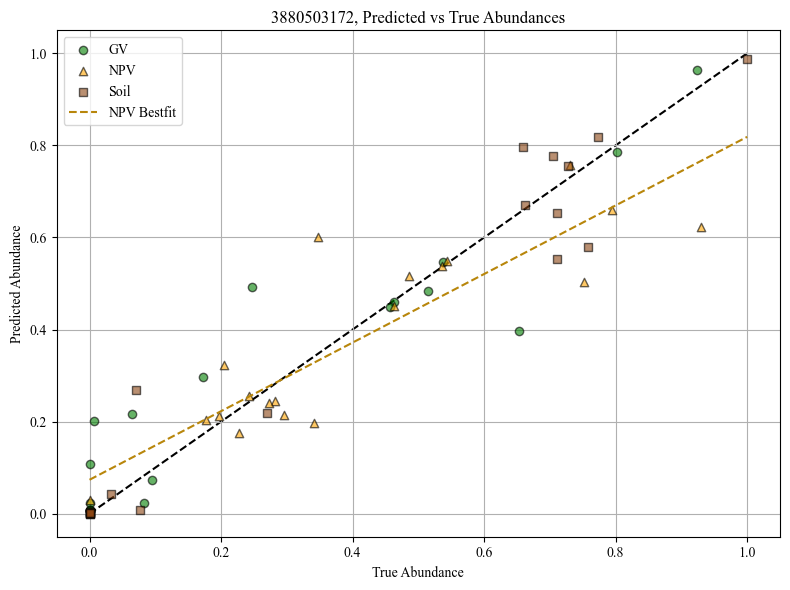

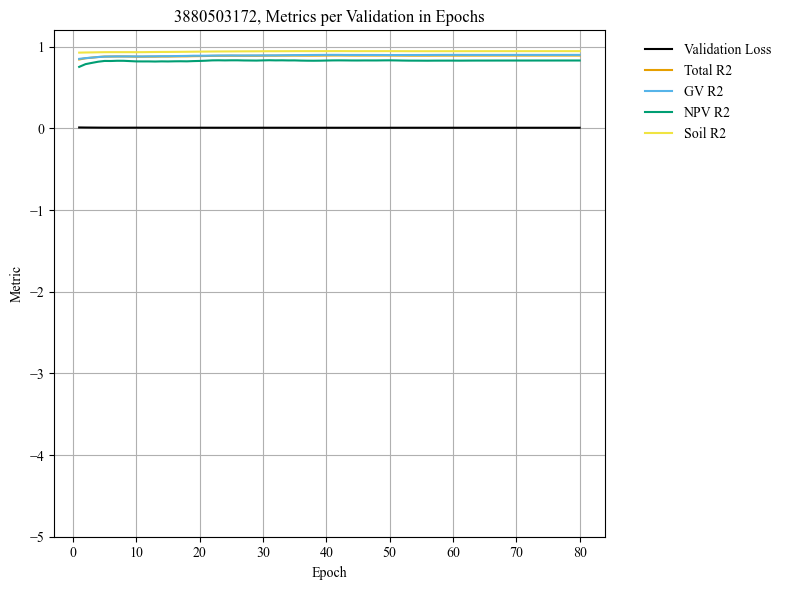

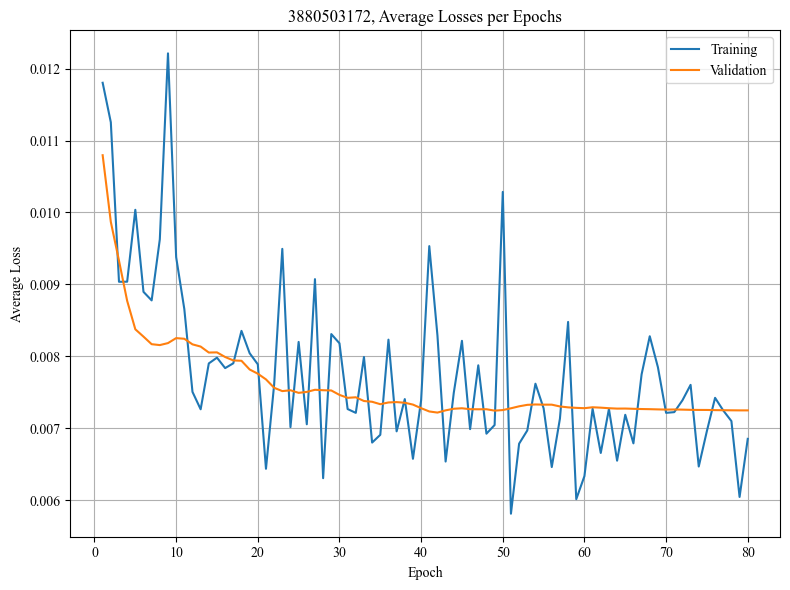

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.002088
Epoch 1/80, Step 2/5, Train Loss: 0.011269
Epoch 1/80, Step 3/5, Train Loss: 0.009125
Epoch 1/80, Step 4/5, Train Loss: 0.007930
Epoch 1/80, Step 5/5, Train Loss: 0.004838
Epoch 1/80 complete. Train Loss: 0.007050, Val Loss: 0.004400
Epoch 2/80, Step 1/5, Train Loss: 0.002391
Epoch 2/80, Step 2/5, Train Loss: 0.010536
Epoch 2/80, Step 3/5, Train Loss: 0.005425
Epoch 2/80, Step 4/5, Train Loss: 0.003911
Epoch 2/80, Step 5/5, Train Loss: 0.006734
Epoch 2/80 complete. Train Loss: 0.005799, Val Loss: 0.004405
Epoch 3/80, Step 1/5, Train Loss: 0.004900
Epoch 3/80, Step 2/5, Train Loss: 0.006288
Epoch 3/80, Step 3/5, Train Loss: 0.009097
Epoch 3/80, Step 4/5, Train Loss: 0.004061
Epoch 3/80, Step 5/5, Train Loss: 0.004015
Epoch 3/80 complete. Train Loss: 0.005672, Val Loss: 0.004465
Epoch 4/80, Step 1/5, Train Loss: 0.004594
Epoch 4/80, Step 2/5, Train Loss: 0.005345
Epoch 4/80, Step 3/5, Train Loss: 0.006815
Epoch 4/80, Step 4/5, Train Loss: 0.0090

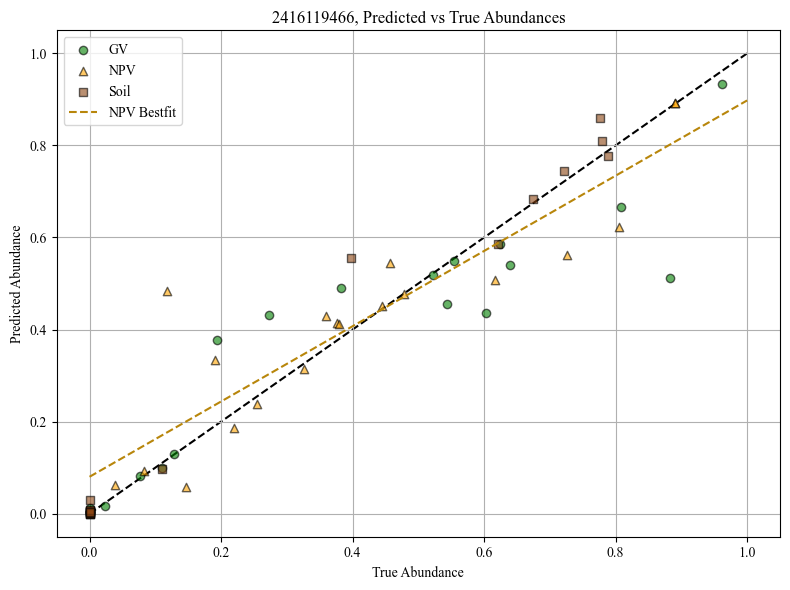

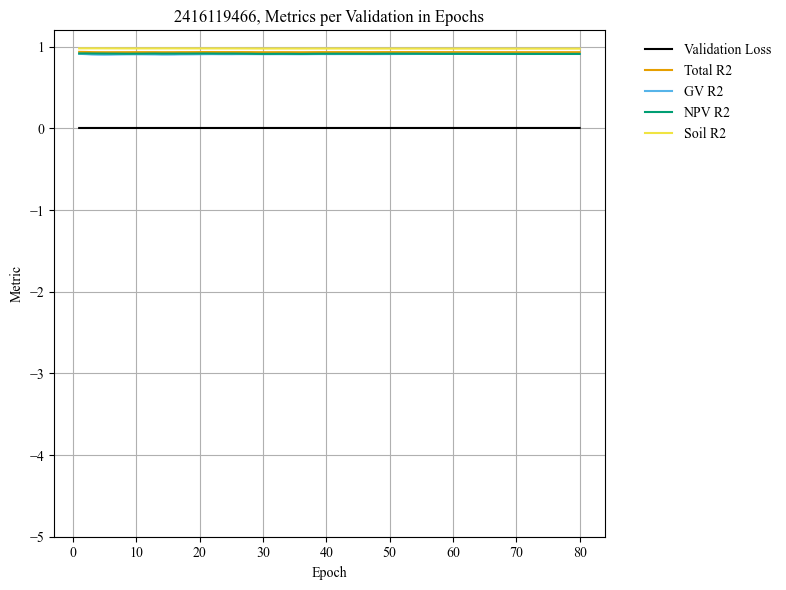

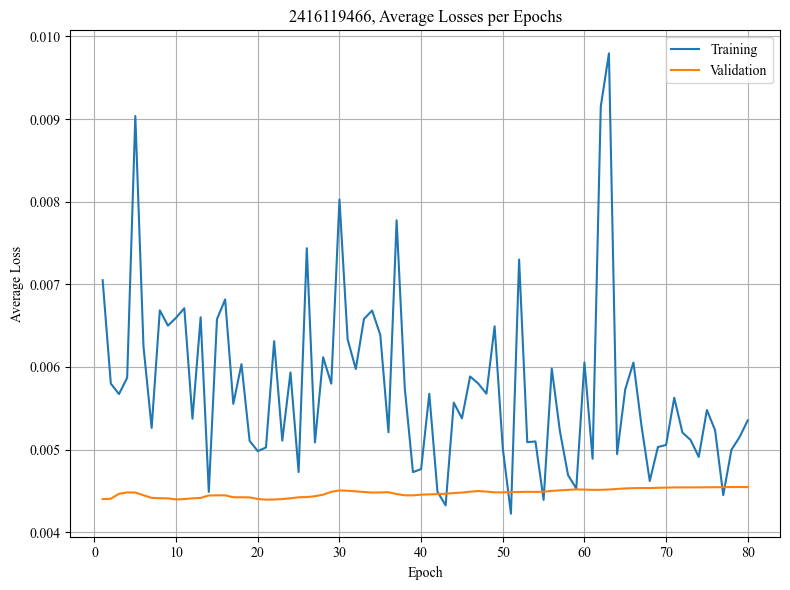

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015501
Epoch 1/80, Step 2/5, Train Loss: 0.010400
Epoch 1/80, Step 3/5, Train Loss: 0.006706
Epoch 1/80, Step 4/5, Train Loss: 0.008405
Epoch 1/80, Step 5/5, Train Loss: 0.025300
Epoch 1/80 complete. Train Loss: 0.013262, Val Loss: 0.013060
Epoch 2/80, Step 1/5, Train Loss: 0.014721
Epoch 2/80, Step 2/5, Train Loss: 0.006656
Epoch 2/80, Step 3/5, Train Loss: 0.013418
Epoch 2/80, Step 4/5, Train Loss: 0.018238
Epoch 2/80, Step 5/5, Train Loss: 0.014991
Epoch 2/80 complete. Train Loss: 0.013605, Val Loss: 0.012365
Epoch 3/80, Step 1/5, Train Loss: 0.010782
Epoch 3/80, Step 2/5, Train Loss: 0.011539
Epoch 3/80, Step 3/5, Train Loss: 0.008634
Epoch 3/80, Step 4/5, Train Loss: 0.013135
Epoch 3/80, Step 5/5, Train Loss: 0.014253
Epoch 3/80 complete. Train Loss: 0.011669, Val Loss: 0.011915
Epoch 4/80, Step 1/5, Train Loss: 0.014268
Epoch 4/80, Step 2/5, Train Loss: 0.015693
Epoch 4/80, Step 3/5, Train Loss: 0.015248
Epoch 4/80, Step 4/5, Train Loss: 0.0090

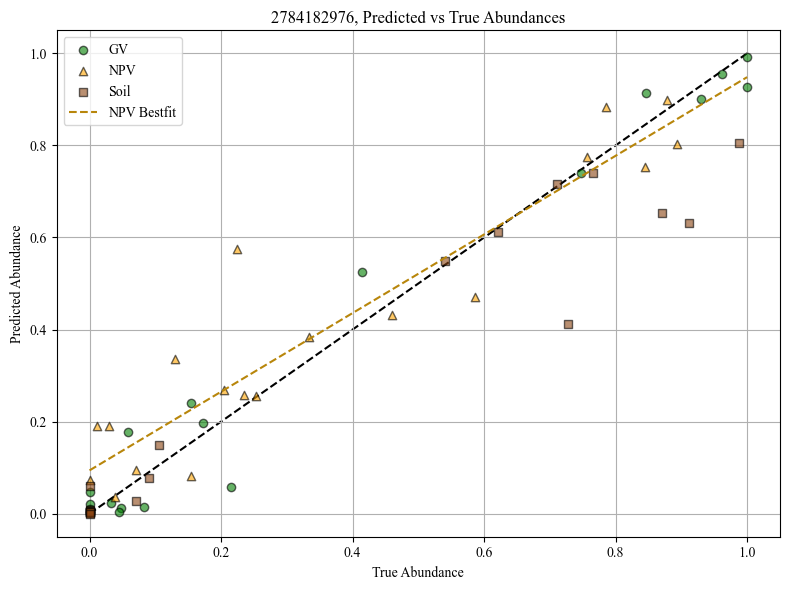

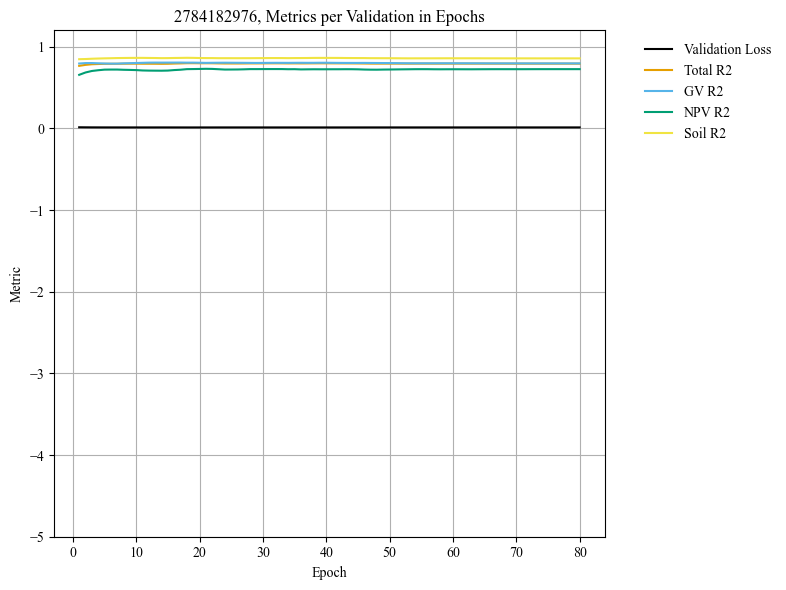

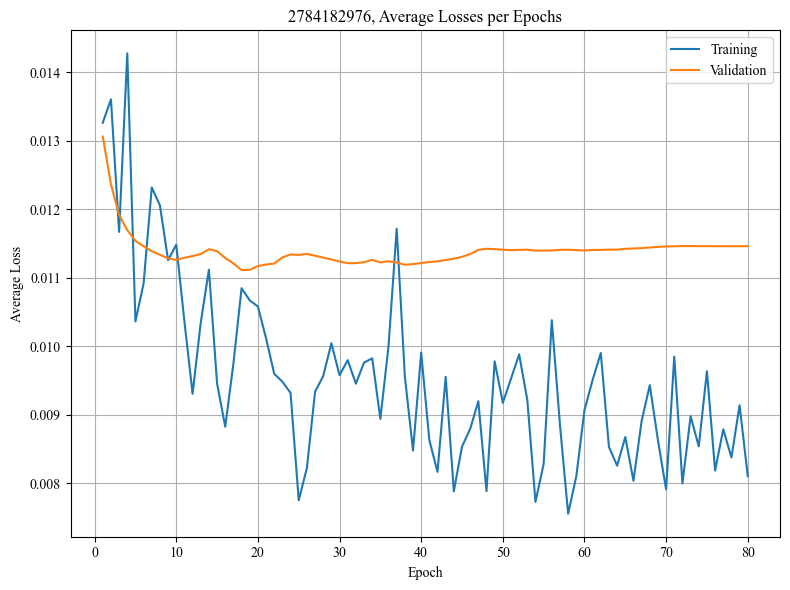

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.019910
Epoch 1/80, Step 2/5, Train Loss: 0.009861
Epoch 1/80, Step 3/5, Train Loss: 0.007056
Epoch 1/80, Step 4/5, Train Loss: 0.008706
Epoch 1/80, Step 5/5, Train Loss: 0.008482
Epoch 1/80 complete. Train Loss: 0.010803, Val Loss: 0.009547
Epoch 2/80, Step 1/5, Train Loss: 0.007329
Epoch 2/80, Step 2/5, Train Loss: 0.026244
Epoch 2/80, Step 3/5, Train Loss: 0.007243
Epoch 2/80, Step 4/5, Train Loss: 0.008754
Epoch 2/80, Step 5/5, Train Loss: 0.006453
Epoch 2/80 complete. Train Loss: 0.011205, Val Loss: 0.009882
Epoch 3/80, Step 1/5, Train Loss: 0.004475
Epoch 3/80, Step 2/5, Train Loss: 0.005523
Epoch 3/80, Step 3/5, Train Loss: 0.012778
Epoch 3/80, Step 4/5, Train Loss: 0.022263
Epoch 3/80, Step 5/5, Train Loss: 0.006161
Epoch 3/80 complete. Train Loss: 0.010240, Val Loss: 0.010396
Epoch 4/80, Step 1/5, Train Loss: 0.006062
Epoch 4/80, Step 2/5, Train Loss: 0.014492
Epoch 4/80, Step 3/5, Train Loss: 0.009648
Epoch 4/80, Step 4/5, Train Loss: 0.0047

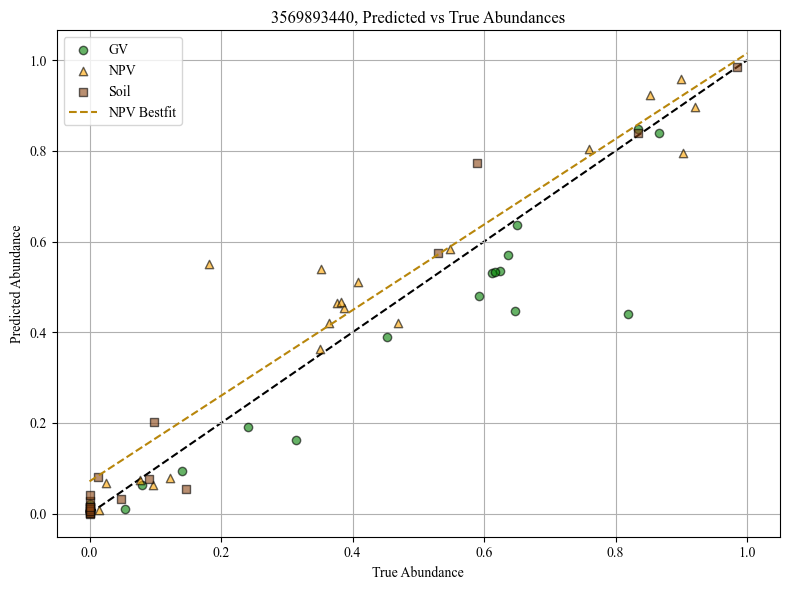

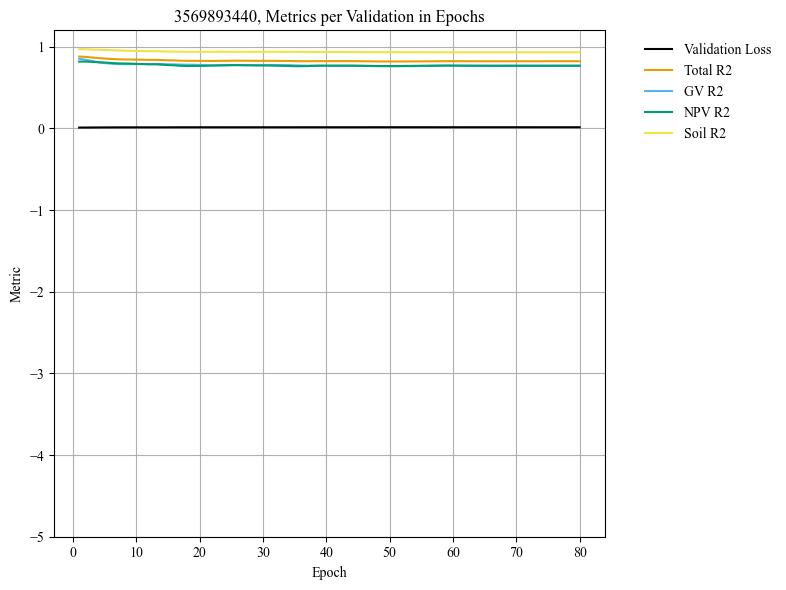

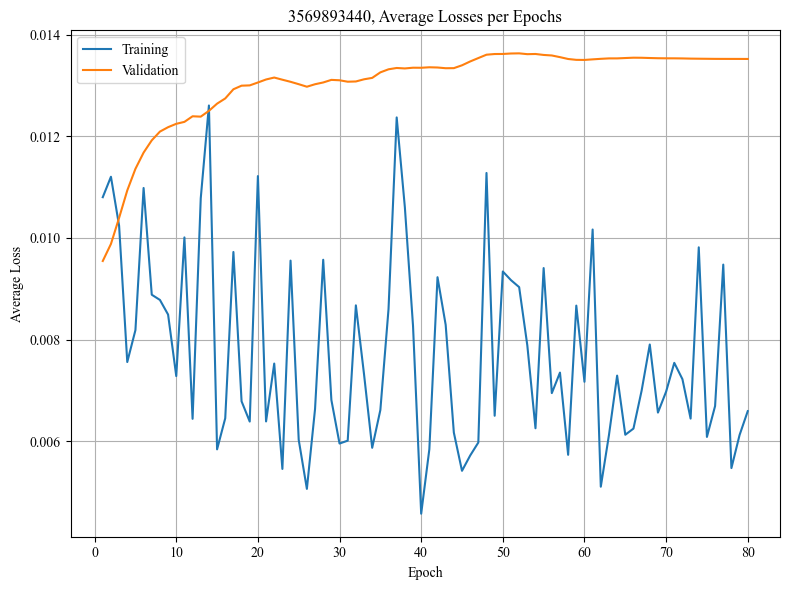

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008740
Epoch 1/80, Step 2/5, Train Loss: 0.015392
Epoch 1/80, Step 3/5, Train Loss: 0.009266
Epoch 1/80, Step 4/5, Train Loss: 0.002944
Epoch 1/80, Step 5/5, Train Loss: 0.008610
Epoch 1/80 complete. Train Loss: 0.008990, Val Loss: 0.003462
Epoch 2/80, Step 1/5, Train Loss: 0.005936
Epoch 2/80, Step 2/5, Train Loss: 0.005728
Epoch 2/80, Step 3/5, Train Loss: 0.006041
Epoch 2/80, Step 4/5, Train Loss: 0.004433
Epoch 2/80, Step 5/5, Train Loss: 0.012694
Epoch 2/80 complete. Train Loss: 0.006966, Val Loss: 0.003241
Epoch 3/80, Step 1/5, Train Loss: 0.012798
Epoch 3/80, Step 2/5, Train Loss: 0.005905
Epoch 3/80, Step 3/5, Train Loss: 0.006083
Epoch 3/80, Step 4/5, Train Loss: 0.007097
Epoch 3/80, Step 5/5, Train Loss: 0.005310
Epoch 3/80 complete. Train Loss: 0.007439, Val Loss: 0.003064
Epoch 4/80, Step 1/5, Train Loss: 0.006983
Epoch 4/80, Step 2/5, Train Loss: 0.002866
Epoch 4/80, Step 3/5, Train Loss: 0.015291
Epoch 4/80, Step 4/5, Train Loss: 0.0051

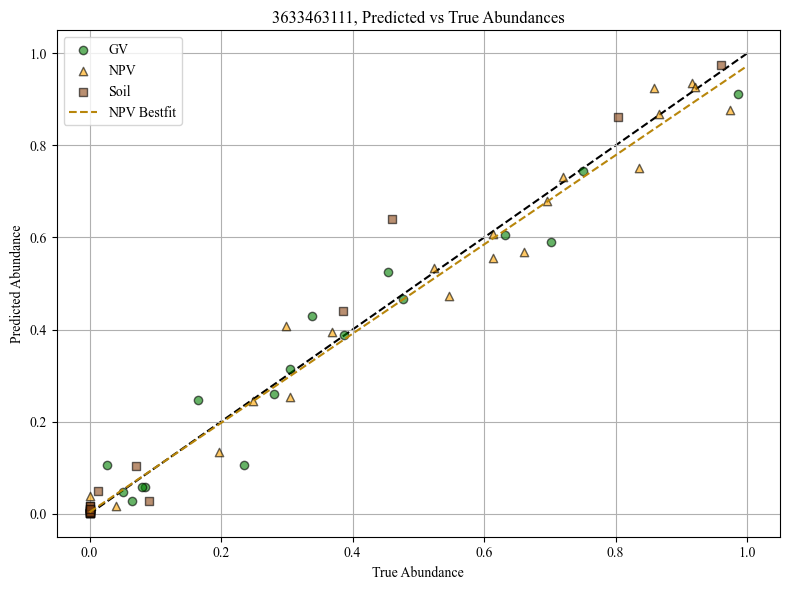

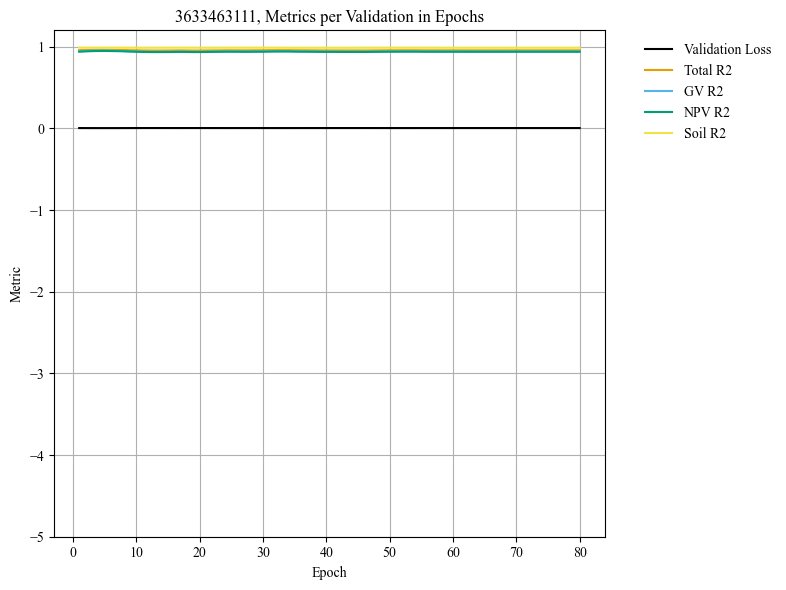

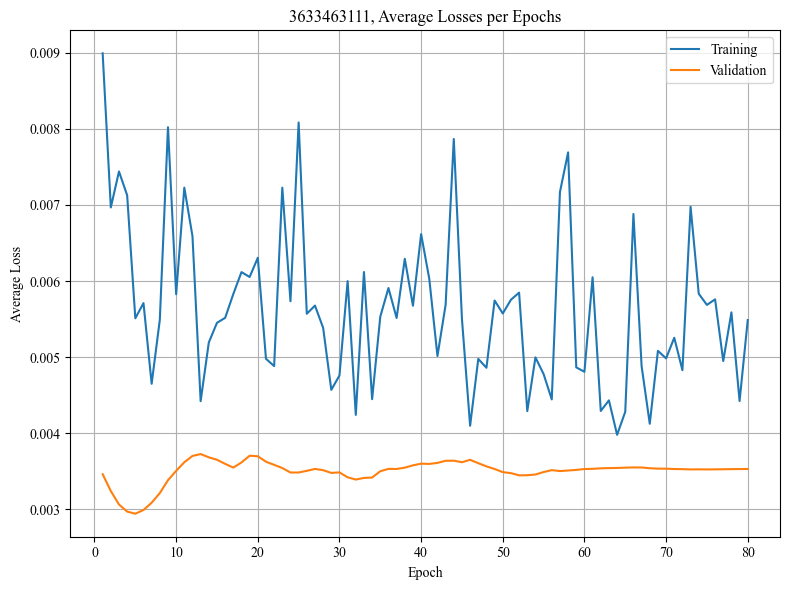

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018794
Epoch 1/80, Step 2/5, Train Loss: 0.010202
Epoch 1/80, Step 3/5, Train Loss: 0.006274
Epoch 1/80, Step 4/5, Train Loss: 0.028649
Epoch 1/80, Step 5/5, Train Loss: 0.007355
Epoch 1/80 complete. Train Loss: 0.014255, Val Loss: 0.007038
Epoch 2/80, Step 1/5, Train Loss: 0.024073
Epoch 2/80, Step 2/5, Train Loss: 0.008286
Epoch 2/80, Step 3/5, Train Loss: 0.007994
Epoch 2/80, Step 4/5, Train Loss: 0.013448
Epoch 2/80, Step 5/5, Train Loss: 0.007333
Epoch 2/80 complete. Train Loss: 0.012227, Val Loss: 0.006804
Epoch 3/80, Step 1/5, Train Loss: 0.012526
Epoch 3/80, Step 2/5, Train Loss: 0.010562
Epoch 3/80, Step 3/5, Train Loss: 0.005453
Epoch 3/80, Step 4/5, Train Loss: 0.010674
Epoch 3/80, Step 5/5, Train Loss: 0.008858
Epoch 3/80 complete. Train Loss: 0.009615, Val Loss: 0.006799
Epoch 4/80, Step 1/5, Train Loss: 0.012308
Epoch 4/80, Step 2/5, Train Loss: 0.005638
Epoch 4/80, Step 3/5, Train Loss: 0.030209
Epoch 4/80, Step 4/5, Train Loss: 0.0058

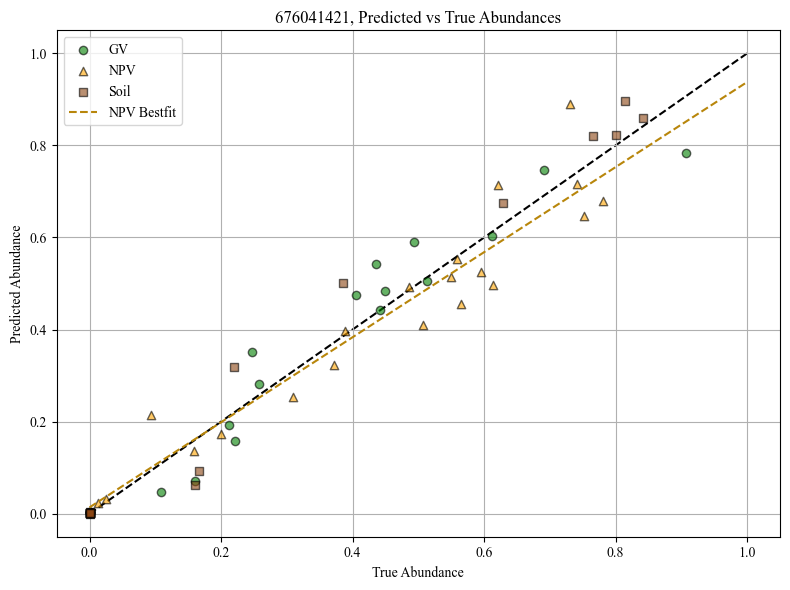

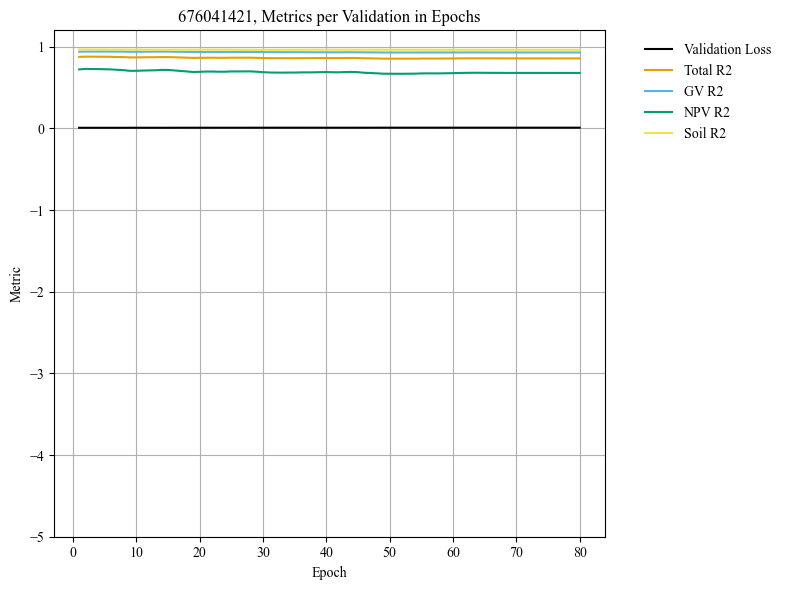

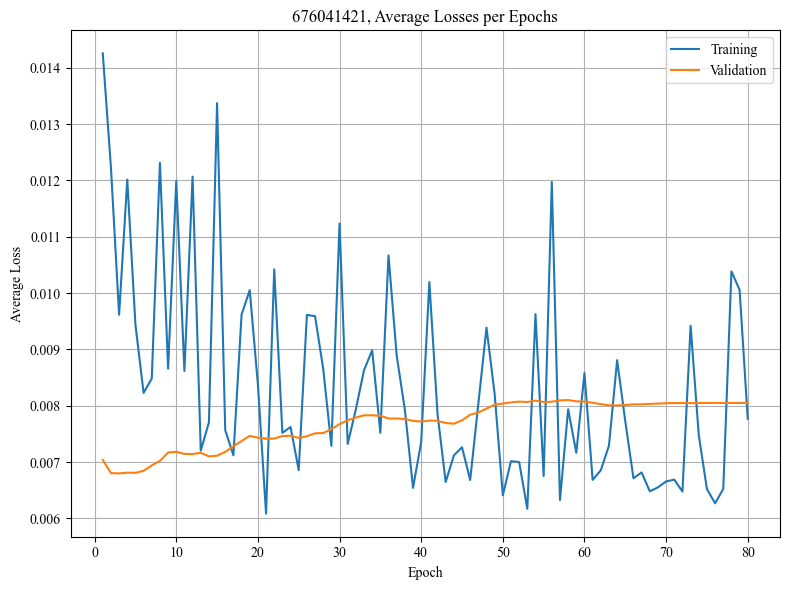

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.022417
Epoch 1/80, Step 2/5, Train Loss: 0.008071
Epoch 1/80, Step 3/5, Train Loss: 0.009623
Epoch 1/80, Step 4/5, Train Loss: 0.009117
Epoch 1/80, Step 5/5, Train Loss: 0.006996
Epoch 1/80 complete. Train Loss: 0.011245, Val Loss: 0.012074
Epoch 2/80, Step 1/5, Train Loss: 0.010162
Epoch 2/80, Step 2/5, Train Loss: 0.015777
Epoch 2/80, Step 3/5, Train Loss: 0.010947
Epoch 2/80, Step 4/5, Train Loss: 0.006544
Epoch 2/80, Step 5/5, Train Loss: 0.012561
Epoch 2/80 complete. Train Loss: 0.011198, Val Loss: 0.012336
Epoch 3/80, Step 1/5, Train Loss: 0.012630
Epoch 3/80, Step 2/5, Train Loss: 0.009560
Epoch 3/80, Step 3/5, Train Loss: 0.006564
Epoch 3/80, Step 4/5, Train Loss: 0.010400
Epoch 3/80, Step 5/5, Train Loss: 0.024363
Epoch 3/80 complete. Train Loss: 0.012704, Val Loss: 0.012623
Epoch 4/80, Step 1/5, Train Loss: 0.011041
Epoch 4/80, Step 2/5, Train Loss: 0.007570
Epoch 4/80, Step 3/5, Train Loss: 0.008580
Epoch 4/80, Step 4/5, Train Loss: 0.0118

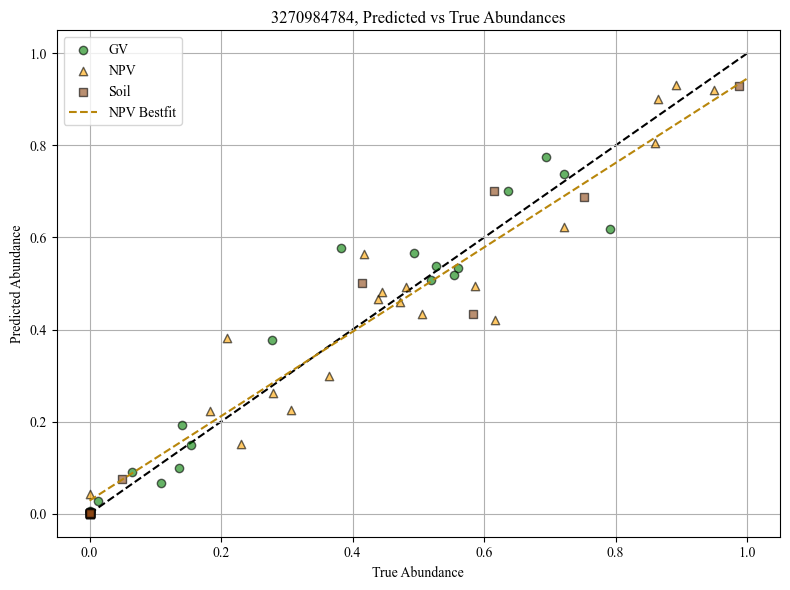

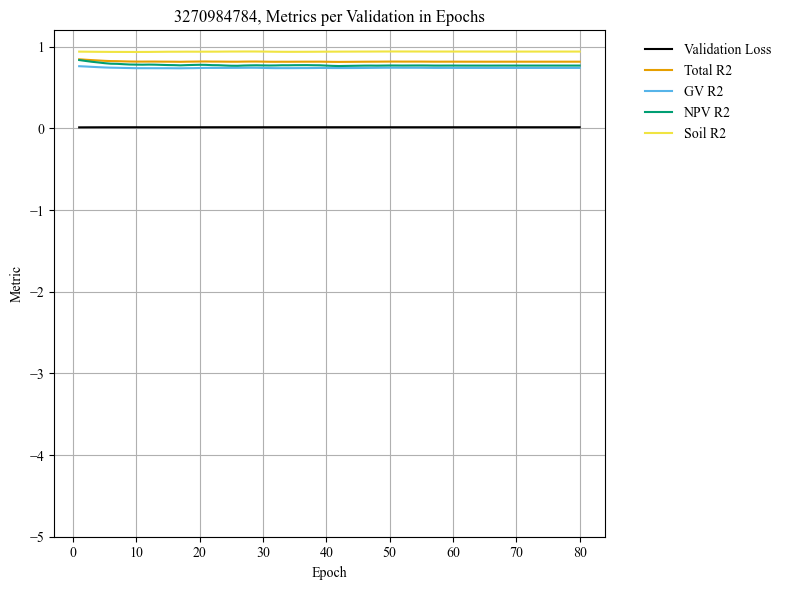

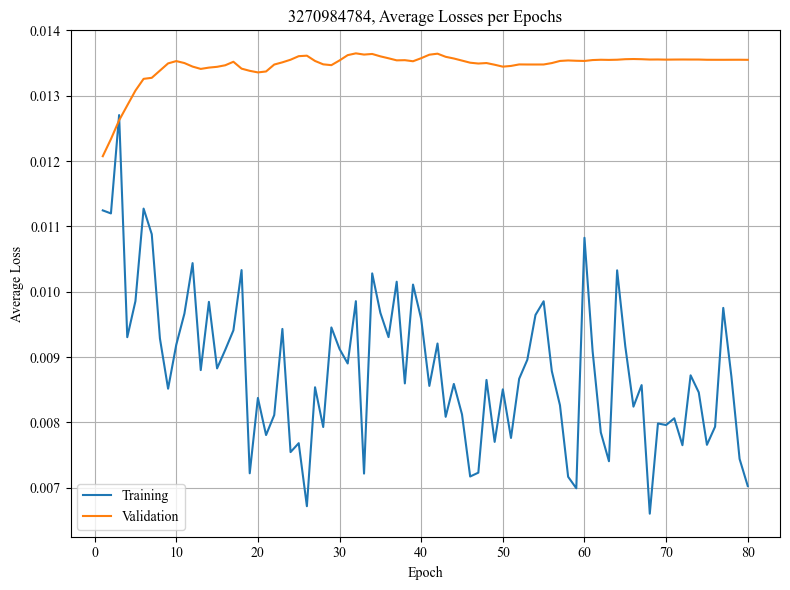

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008900
Epoch 1/80, Step 2/5, Train Loss: 0.009607
Epoch 1/80, Step 3/5, Train Loss: 0.020947
Epoch 1/80, Step 4/5, Train Loss: 0.008664
Epoch 1/80, Step 5/5, Train Loss: 0.009249
Epoch 1/80 complete. Train Loss: 0.011473, Val Loss: 0.009282
Epoch 2/80, Step 1/5, Train Loss: 0.016459
Epoch 2/80, Step 2/5, Train Loss: 0.007663
Epoch 2/80, Step 3/5, Train Loss: 0.008291
Epoch 2/80, Step 4/5, Train Loss: 0.009491
Epoch 2/80, Step 5/5, Train Loss: 0.008555
Epoch 2/80 complete. Train Loss: 0.010092, Val Loss: 0.008745
Epoch 3/80, Step 1/5, Train Loss: 0.014660
Epoch 3/80, Step 2/5, Train Loss: 0.016536
Epoch 3/80, Step 3/5, Train Loss: 0.008164
Epoch 3/80, Step 4/5, Train Loss: 0.013105
Epoch 3/80, Step 5/5, Train Loss: 0.007595
Epoch 3/80 complete. Train Loss: 0.012012, Val Loss: 0.008441
Epoch 4/80, Step 1/5, Train Loss: 0.010318
Epoch 4/80, Step 2/5, Train Loss: 0.006312
Epoch 4/80, Step 3/5, Train Loss: 0.008224
Epoch 4/80, Step 4/5, Train Loss: 0.0042

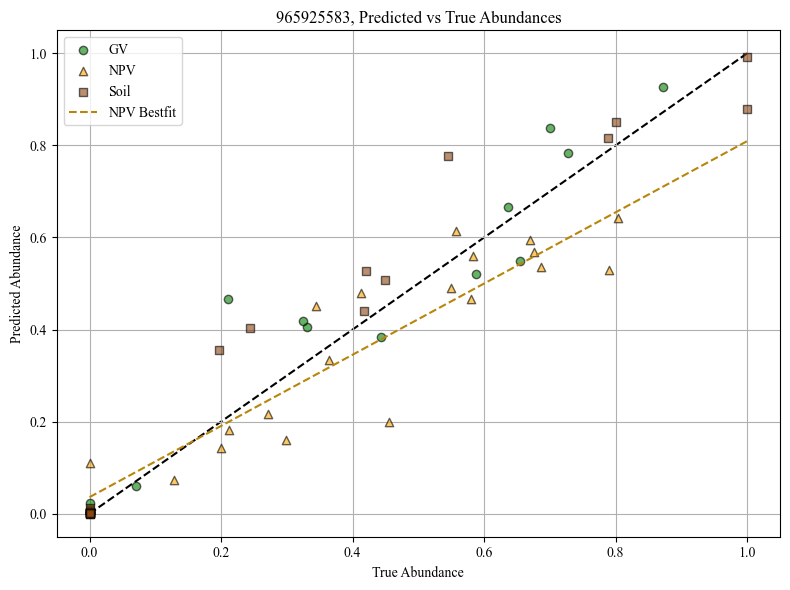

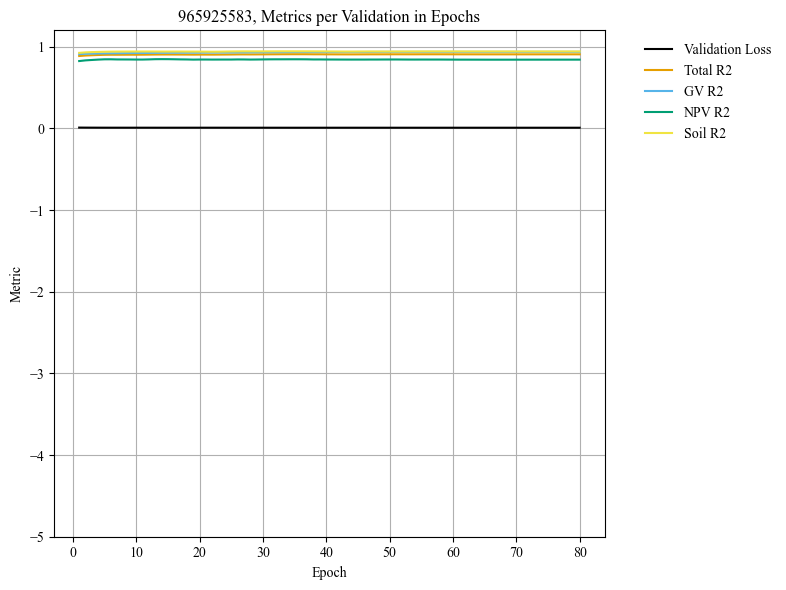

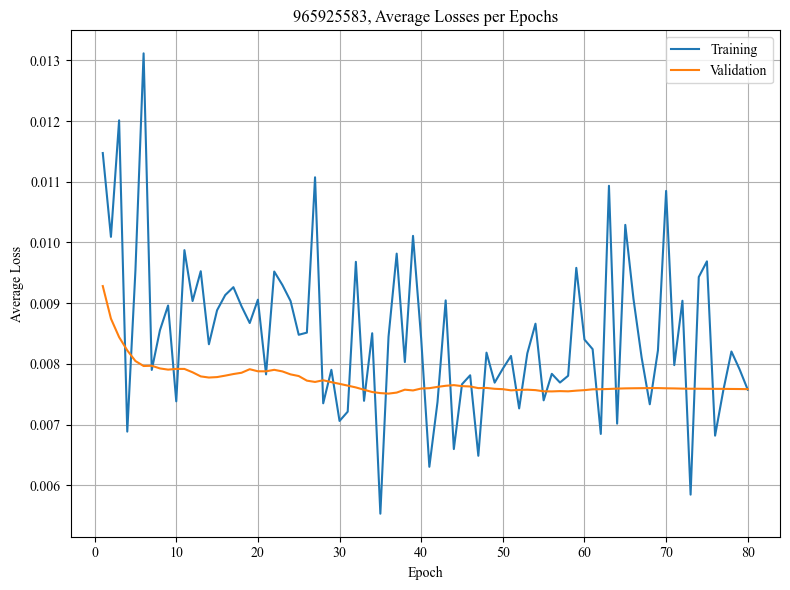

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007009
Epoch 1/80, Step 2/5, Train Loss: 0.003813
Epoch 1/80, Step 3/5, Train Loss: 0.009185
Epoch 1/80, Step 4/5, Train Loss: 0.008626
Epoch 1/80, Step 5/5, Train Loss: 0.008200
Epoch 1/80 complete. Train Loss: 0.007367, Val Loss: 0.005031
Epoch 2/80, Step 1/5, Train Loss: 0.009648
Epoch 2/80, Step 2/5, Train Loss: 0.007041
Epoch 2/80, Step 3/5, Train Loss: 0.008166
Epoch 2/80, Step 4/5, Train Loss: 0.004115
Epoch 2/80, Step 5/5, Train Loss: 0.008393
Epoch 2/80 complete. Train Loss: 0.007473, Val Loss: 0.005303
Epoch 3/80, Step 1/5, Train Loss: 0.006817
Epoch 3/80, Step 2/5, Train Loss: 0.007866
Epoch 3/80, Step 3/5, Train Loss: 0.006789
Epoch 3/80, Step 4/5, Train Loss: 0.005172
Epoch 3/80, Step 5/5, Train Loss: 0.008943
Epoch 3/80 complete. Train Loss: 0.007118, Val Loss: 0.005625
Epoch 4/80, Step 1/5, Train Loss: 0.013652
Epoch 4/80, Step 2/5, Train Loss: 0.007466
Epoch 4/80, Step 3/5, Train Loss: 0.005341
Epoch 4/80, Step 4/5, Train Loss: 0.0057

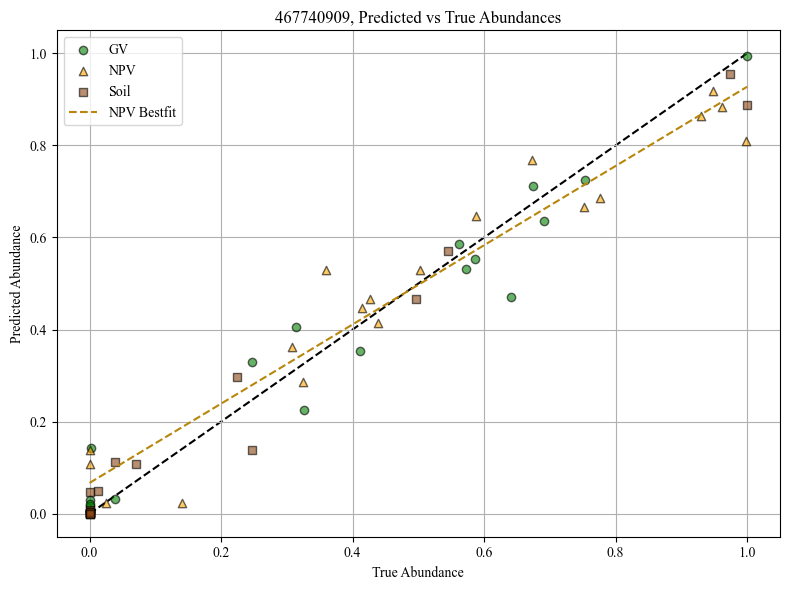

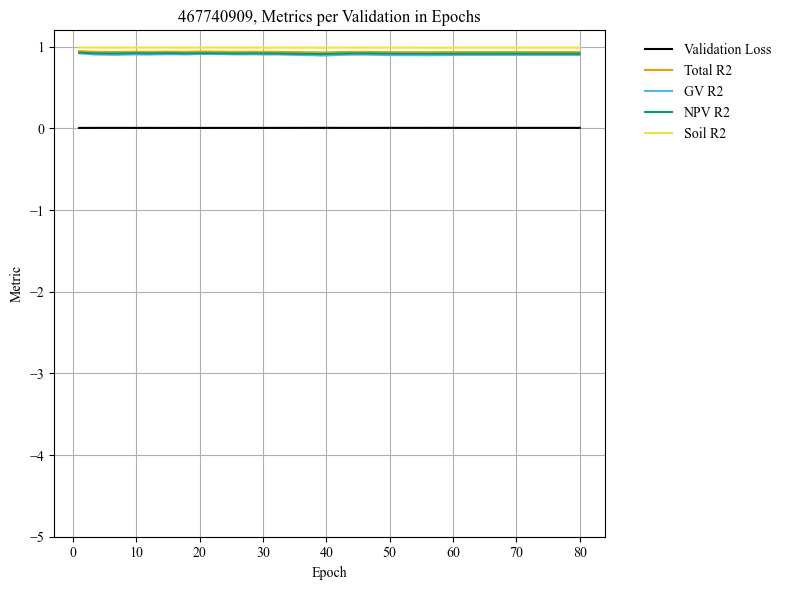

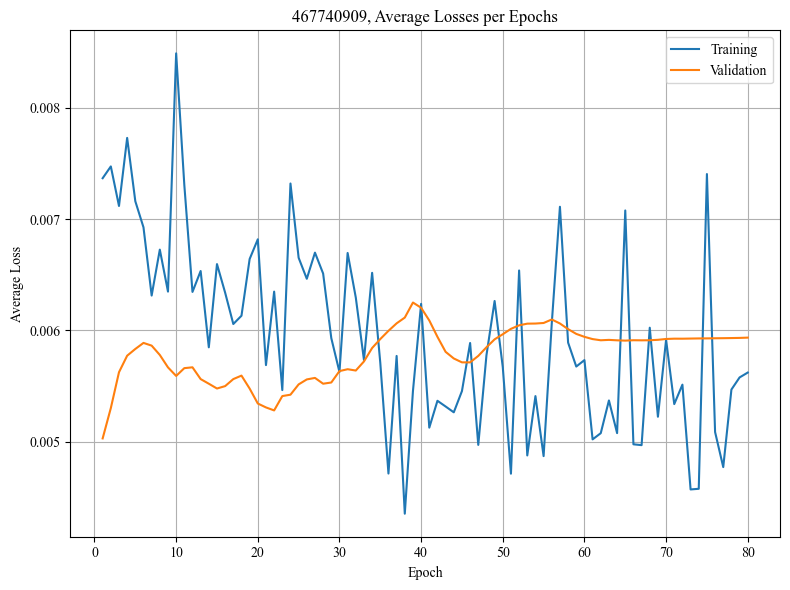

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.014048
Epoch 1/80, Step 2/5, Train Loss: 0.017315
Epoch 1/80, Step 3/5, Train Loss: 0.022910
Epoch 1/80, Step 4/5, Train Loss: 0.012981
Epoch 1/80, Step 5/5, Train Loss: 0.009917
Epoch 1/80 complete. Train Loss: 0.015434, Val Loss: 0.009025
Epoch 2/80, Step 1/5, Train Loss: 0.014066
Epoch 2/80, Step 2/5, Train Loss: 0.010802
Epoch 2/80, Step 3/5, Train Loss: 0.017797
Epoch 2/80, Step 4/5, Train Loss: 0.006955
Epoch 2/80, Step 5/5, Train Loss: 0.009018
Epoch 2/80 complete. Train Loss: 0.011728, Val Loss: 0.008705
Epoch 3/80, Step 1/5, Train Loss: 0.015033
Epoch 3/80, Step 2/5, Train Loss: 0.009362
Epoch 3/80, Step 3/5, Train Loss: 0.008100
Epoch 3/80, Step 4/5, Train Loss: 0.010274
Epoch 3/80, Step 5/5, Train Loss: 0.009762
Epoch 3/80 complete. Train Loss: 0.010506, Val Loss: 0.008484
Epoch 4/80, Step 1/5, Train Loss: 0.004428
Epoch 4/80, Step 2/5, Train Loss: 0.012667
Epoch 4/80, Step 3/5, Train Loss: 0.007470
Epoch 4/80, Step 4/5, Train Loss: 0.0113

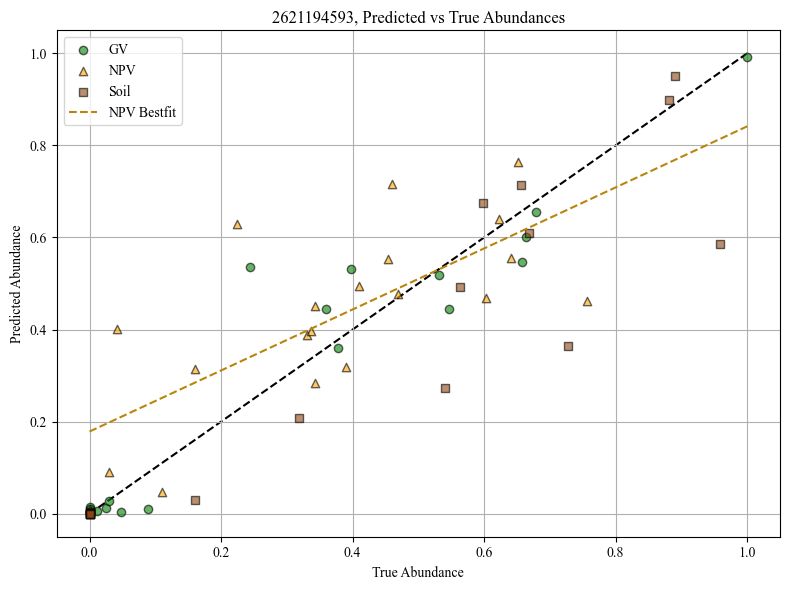

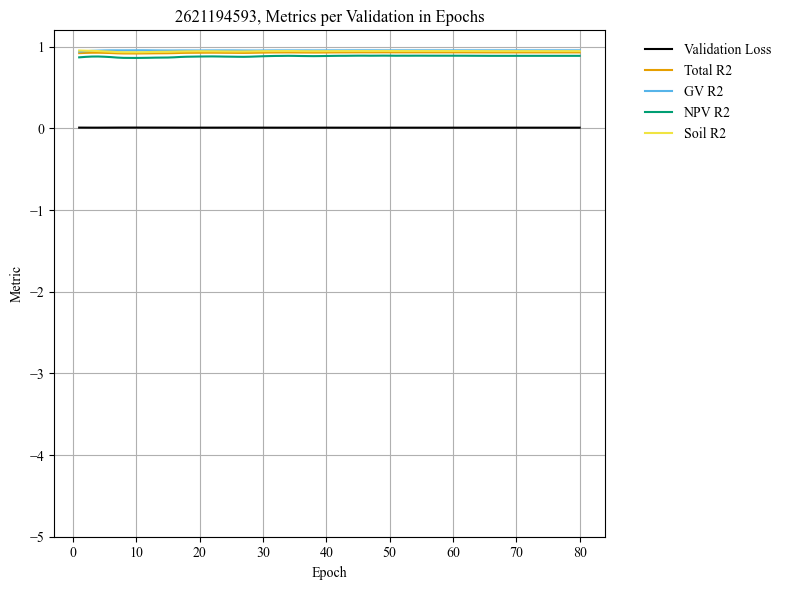

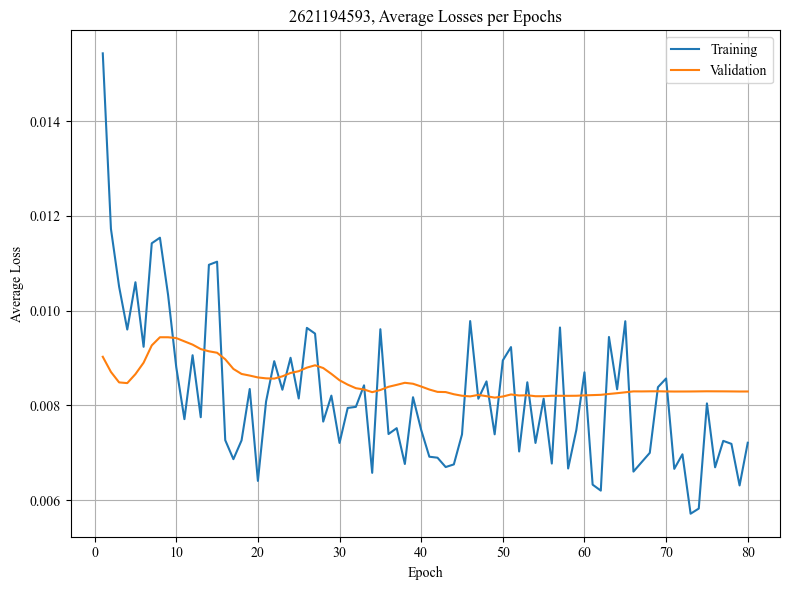

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.014423
Epoch 1/80, Step 2/5, Train Loss: 0.004268
Epoch 1/80, Step 3/5, Train Loss: 0.007594
Epoch 1/80, Step 4/5, Train Loss: 0.007632
Epoch 1/80, Step 5/5, Train Loss: 0.006958
Epoch 1/80 complete. Train Loss: 0.008175, Val Loss: 0.004782
Epoch 2/80, Step 1/5, Train Loss: 0.008329
Epoch 2/80, Step 2/5, Train Loss: 0.009654
Epoch 2/80, Step 3/5, Train Loss: 0.005509
Epoch 2/80, Step 4/5, Train Loss: 0.003800
Epoch 2/80, Step 5/5, Train Loss: 0.009067
Epoch 2/80 complete. Train Loss: 0.007272, Val Loss: 0.004649
Epoch 3/80, Step 1/5, Train Loss: 0.010395
Epoch 3/80, Step 2/5, Train Loss: 0.008772
Epoch 3/80, Step 3/5, Train Loss: 0.003475
Epoch 3/80, Step 4/5, Train Loss: 0.005841
Epoch 3/80, Step 5/5, Train Loss: 0.008289
Epoch 3/80 complete. Train Loss: 0.007354, Val Loss: 0.004576
Epoch 4/80, Step 1/5, Train Loss: 0.010553
Epoch 4/80, Step 2/5, Train Loss: 0.009855
Epoch 4/80, Step 3/5, Train Loss: 0.004537
Epoch 4/80, Step 4/5, Train Loss: 0.0096

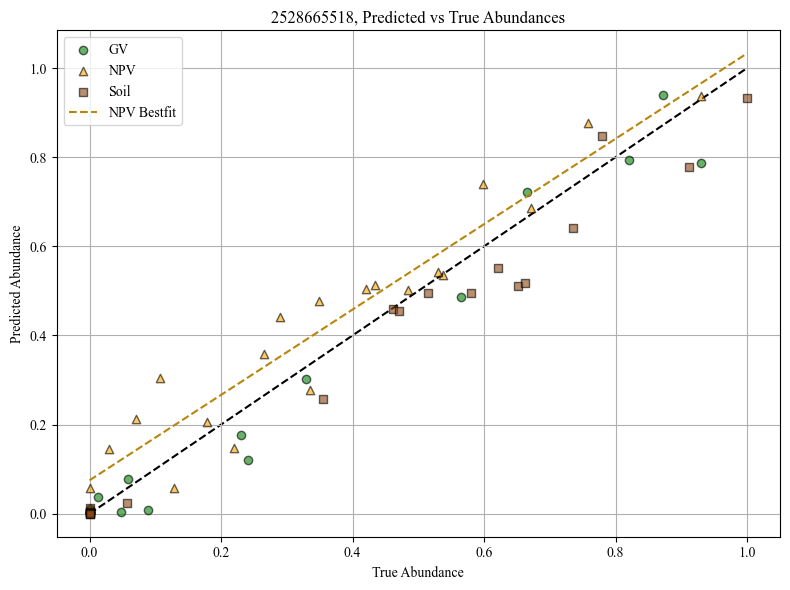

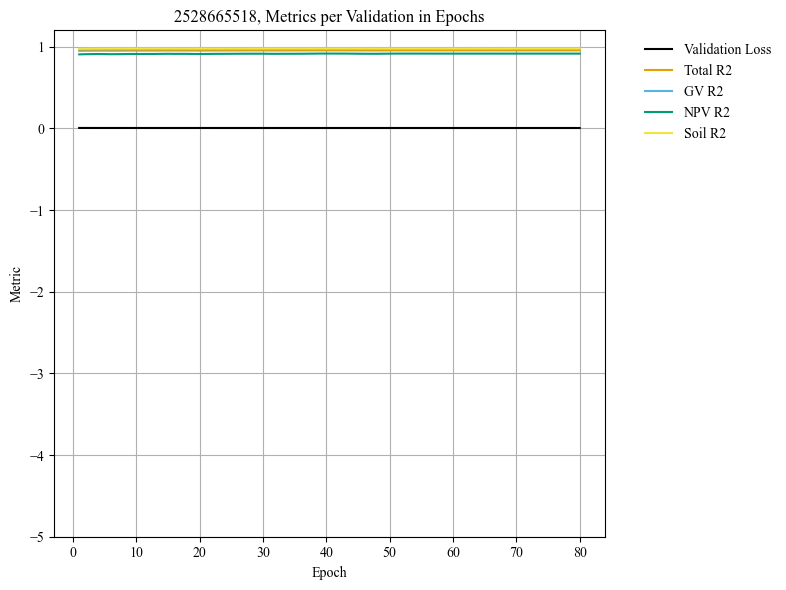

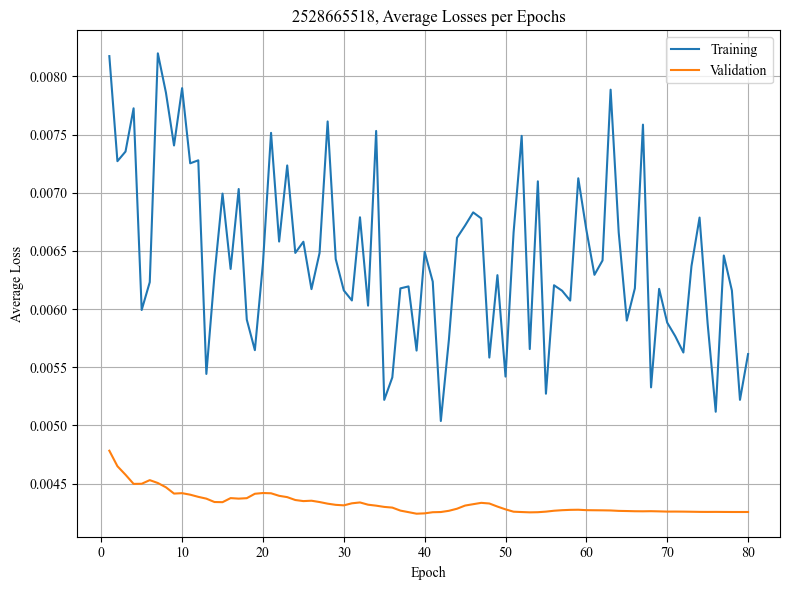

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006061
Epoch 1/80, Step 2/5, Train Loss: 0.002740
Epoch 1/80, Step 3/5, Train Loss: 0.004708
Epoch 1/80, Step 4/5, Train Loss: 0.009634
Epoch 1/80, Step 5/5, Train Loss: 0.004213
Epoch 1/80 complete. Train Loss: 0.005471, Val Loss: 0.006148
Epoch 2/80, Step 1/5, Train Loss: 0.004492
Epoch 2/80, Step 2/5, Train Loss: 0.005757
Epoch 2/80, Step 3/5, Train Loss: 0.007734
Epoch 2/80, Step 4/5, Train Loss: 0.012461
Epoch 2/80, Step 5/5, Train Loss: 0.003877
Epoch 2/80 complete. Train Loss: 0.006864, Val Loss: 0.006435
Epoch 3/80, Step 1/5, Train Loss: 0.004307
Epoch 3/80, Step 2/5, Train Loss: 0.004759
Epoch 3/80, Step 3/5, Train Loss: 0.004152
Epoch 3/80, Step 4/5, Train Loss: 0.006374
Epoch 3/80, Step 5/5, Train Loss: 0.008005
Epoch 3/80 complete. Train Loss: 0.005519, Val Loss: 0.006599
Epoch 4/80, Step 1/5, Train Loss: 0.006521
Epoch 4/80, Step 2/5, Train Loss: 0.008903
Epoch 4/80, Step 3/5, Train Loss: 0.004808
Epoch 4/80, Step 4/5, Train Loss: 0.0067

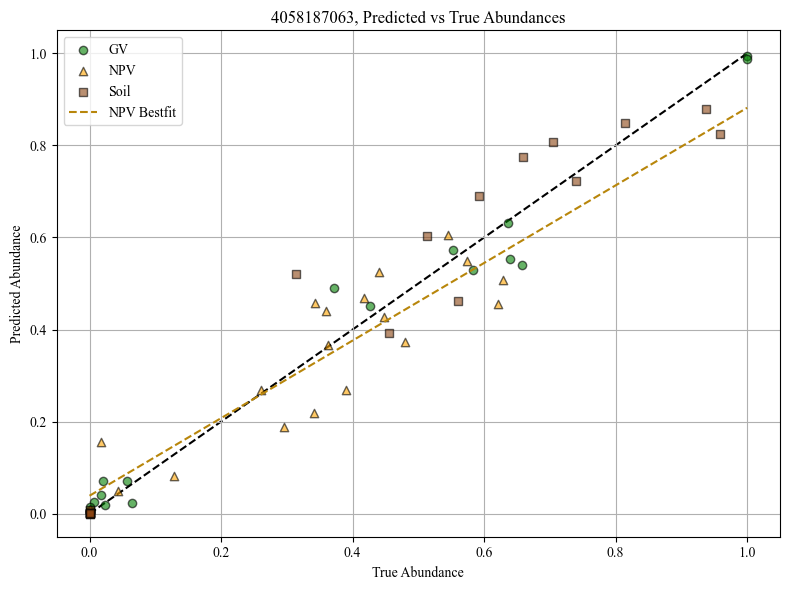

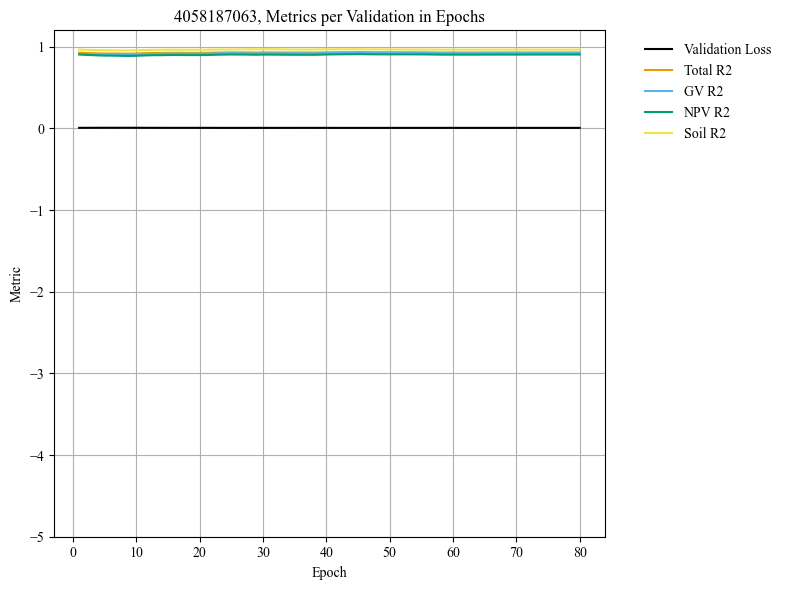

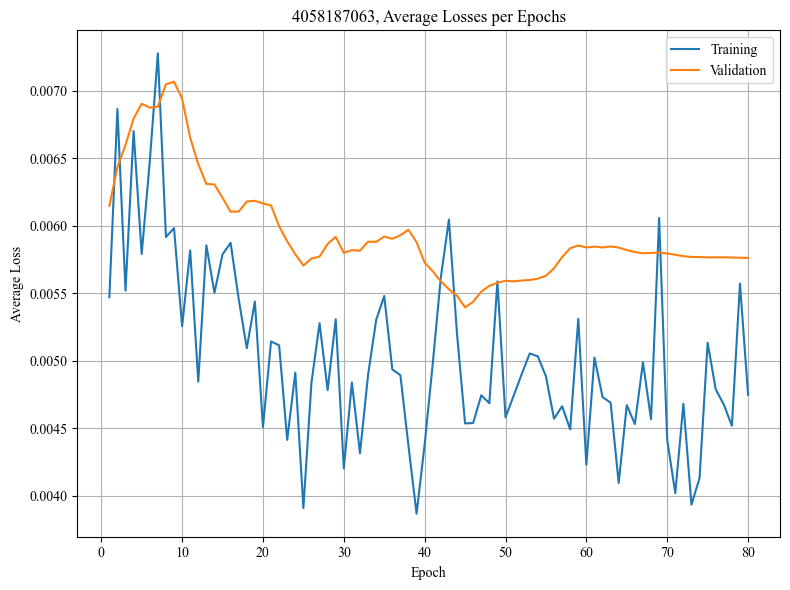

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009472
Epoch 1/80, Step 2/5, Train Loss: 0.012081
Epoch 1/80, Step 3/5, Train Loss: 0.006670
Epoch 1/80, Step 4/5, Train Loss: 0.014568
Epoch 1/80, Step 5/5, Train Loss: 0.015305
Epoch 1/80 complete. Train Loss: 0.011619, Val Loss: 0.006046
Epoch 2/80, Step 1/5, Train Loss: 0.018583
Epoch 2/80, Step 2/5, Train Loss: 0.012752
Epoch 2/80, Step 3/5, Train Loss: 0.011954
Epoch 2/80, Step 4/5, Train Loss: 0.020089
Epoch 2/80, Step 5/5, Train Loss: 0.007421
Epoch 2/80 complete. Train Loss: 0.014160, Val Loss: 0.005977
Epoch 3/80, Step 1/5, Train Loss: 0.017743
Epoch 3/80, Step 2/5, Train Loss: 0.004559
Epoch 3/80, Step 3/5, Train Loss: 0.007879
Epoch 3/80, Step 4/5, Train Loss: 0.014541
Epoch 3/80, Step 5/5, Train Loss: 0.011577
Epoch 3/80 complete. Train Loss: 0.011260, Val Loss: 0.005926
Epoch 4/80, Step 1/5, Train Loss: 0.013692
Epoch 4/80, Step 2/5, Train Loss: 0.016591
Epoch 4/80, Step 3/5, Train Loss: 0.010634
Epoch 4/80, Step 4/5, Train Loss: 0.0061

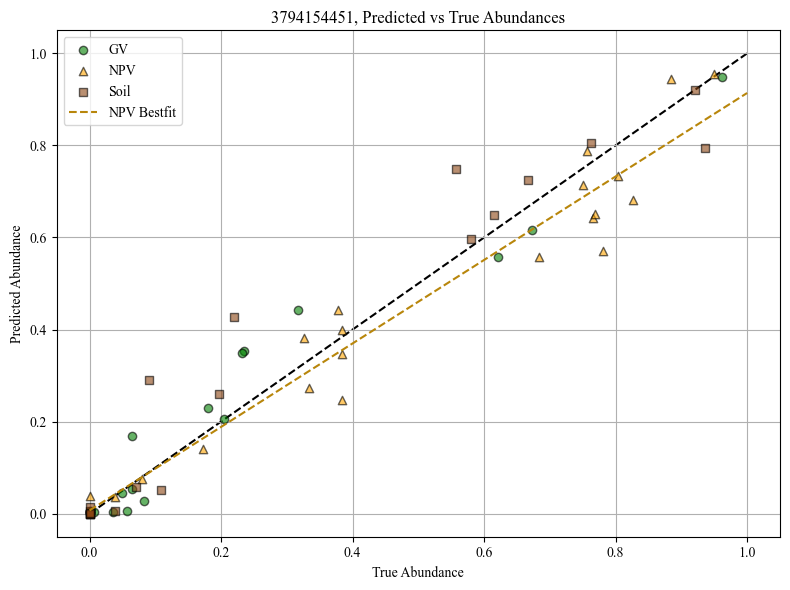

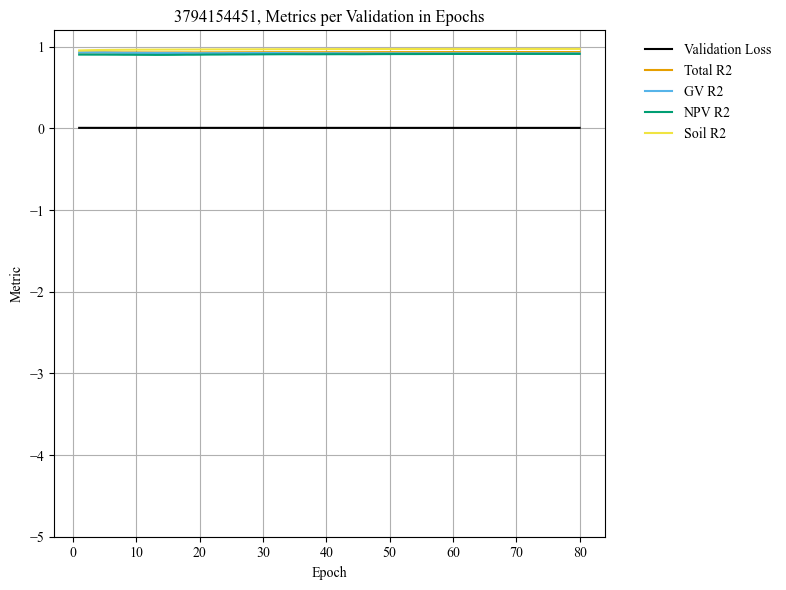

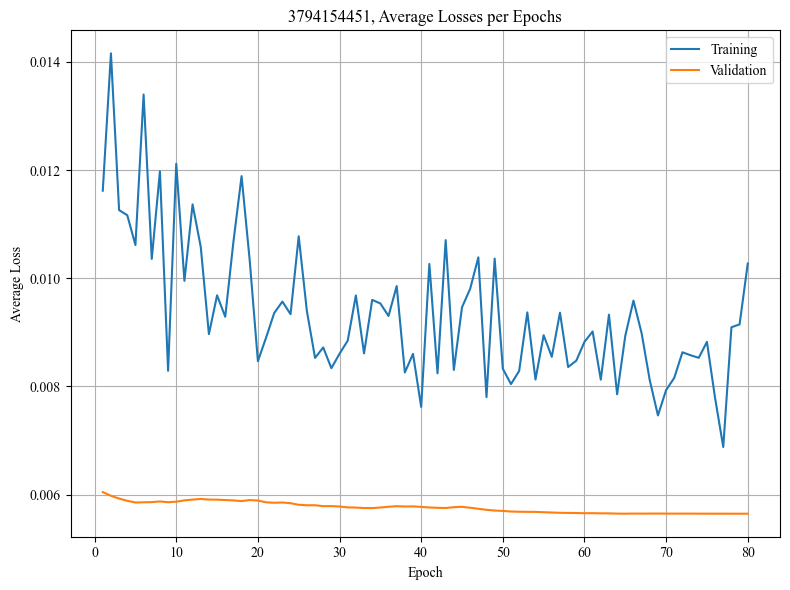

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007295
Epoch 1/80, Step 2/5, Train Loss: 0.006462
Epoch 1/80, Step 3/5, Train Loss: 0.017487
Epoch 1/80, Step 4/5, Train Loss: 0.018668
Epoch 1/80, Step 5/5, Train Loss: 0.015117
Epoch 1/80 complete. Train Loss: 0.013006, Val Loss: 0.006803
Epoch 2/80, Step 1/5, Train Loss: 0.023033
Epoch 2/80, Step 2/5, Train Loss: 0.010665
Epoch 2/80, Step 3/5, Train Loss: 0.009147
Epoch 2/80, Step 4/5, Train Loss: 0.008065
Epoch 2/80, Step 5/5, Train Loss: 0.009286
Epoch 2/80 complete. Train Loss: 0.012039, Val Loss: 0.006553
Epoch 3/80, Step 1/5, Train Loss: 0.008865
Epoch 3/80, Step 2/5, Train Loss: 0.007761
Epoch 3/80, Step 3/5, Train Loss: 0.021264
Epoch 3/80, Step 4/5, Train Loss: 0.008418
Epoch 3/80, Step 5/5, Train Loss: 0.009280
Epoch 3/80 complete. Train Loss: 0.011117, Val Loss: 0.006506
Epoch 4/80, Step 1/5, Train Loss: 0.007648
Epoch 4/80, Step 2/5, Train Loss: 0.004386
Epoch 4/80, Step 3/5, Train Loss: 0.011902
Epoch 4/80, Step 4/5, Train Loss: 0.0122

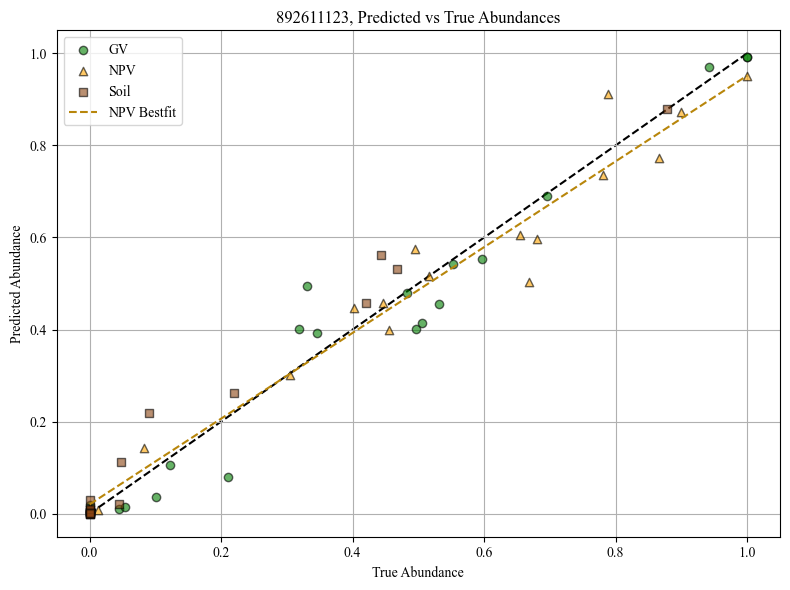

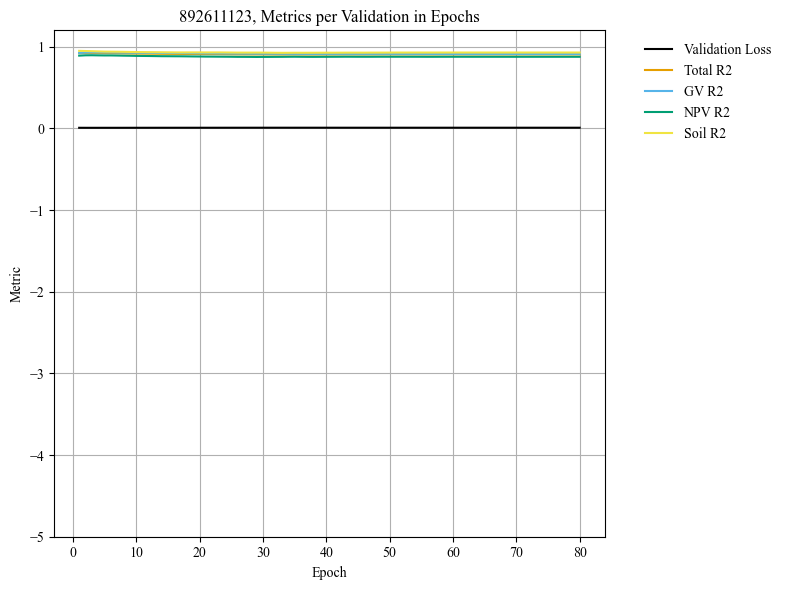

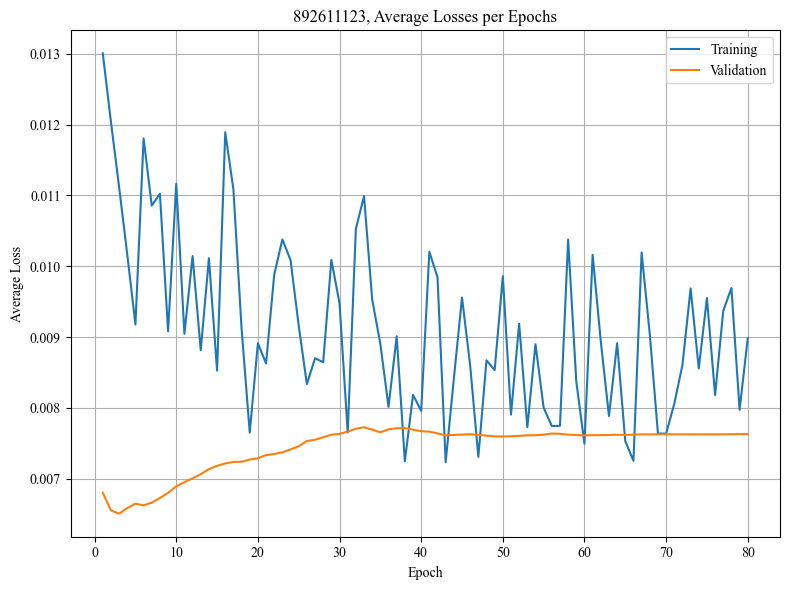

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004956
Epoch 1/80, Step 2/5, Train Loss: 0.004940
Epoch 1/80, Step 3/5, Train Loss: 0.008176
Epoch 1/80, Step 4/5, Train Loss: 0.005205
Epoch 1/80, Step 5/5, Train Loss: 0.005763
Epoch 1/80 complete. Train Loss: 0.005808, Val Loss: 0.004446
Epoch 2/80, Step 1/5, Train Loss: 0.007972
Epoch 2/80, Step 2/5, Train Loss: 0.006224
Epoch 2/80, Step 3/5, Train Loss: 0.003880
Epoch 2/80, Step 4/5, Train Loss: 0.005042
Epoch 2/80, Step 5/5, Train Loss: 0.007363
Epoch 2/80 complete. Train Loss: 0.006096, Val Loss: 0.004115
Epoch 3/80, Step 1/5, Train Loss: 0.008020
Epoch 3/80, Step 2/5, Train Loss: 0.006019
Epoch 3/80, Step 3/5, Train Loss: 0.006240
Epoch 3/80, Step 4/5, Train Loss: 0.003373
Epoch 3/80, Step 5/5, Train Loss: 0.005650
Epoch 3/80 complete. Train Loss: 0.005860, Val Loss: 0.003978
Epoch 4/80, Step 1/5, Train Loss: 0.004832
Epoch 4/80, Step 2/5, Train Loss: 0.010207
Epoch 4/80, Step 3/5, Train Loss: 0.007796
Epoch 4/80, Step 4/5, Train Loss: 0.0044

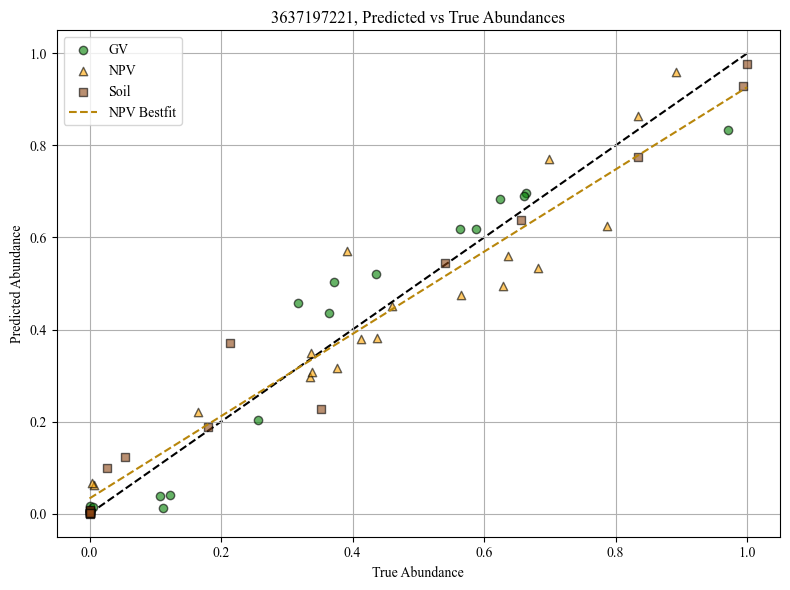

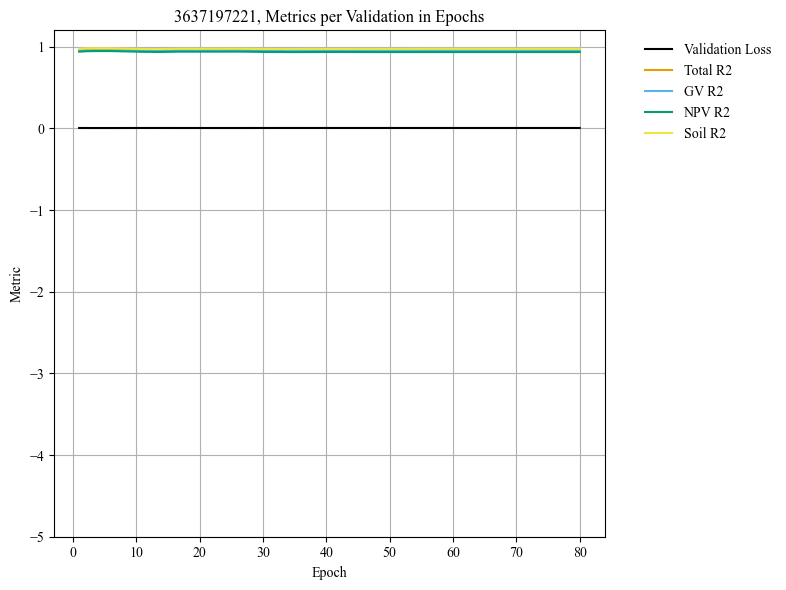

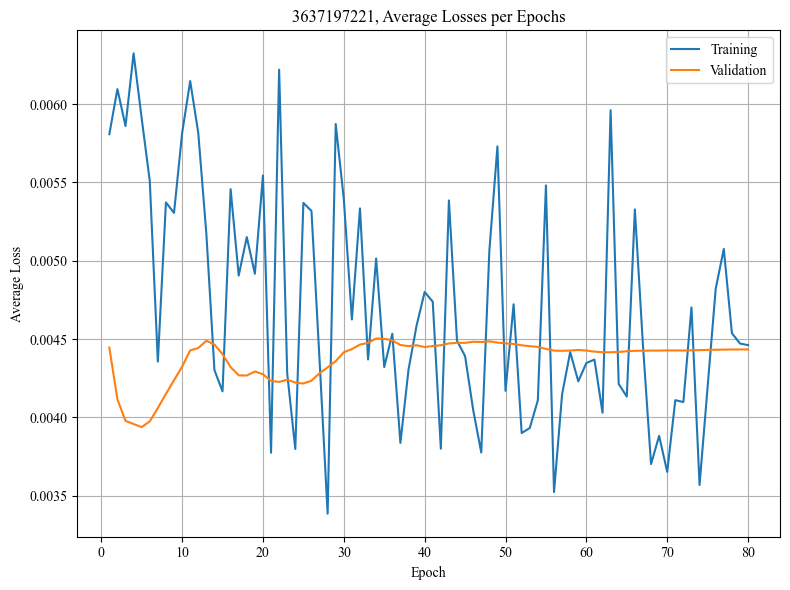

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004559
Epoch 1/80, Step 2/5, Train Loss: 0.009871
Epoch 1/80, Step 3/5, Train Loss: 0.012409
Epoch 1/80, Step 4/5, Train Loss: 0.008080
Epoch 1/80, Step 5/5, Train Loss: 0.021751
Epoch 1/80 complete. Train Loss: 0.011334, Val Loss: 0.003287
Epoch 2/80, Step 1/5, Train Loss: 0.014253
Epoch 2/80, Step 2/5, Train Loss: 0.006697
Epoch 2/80, Step 3/5, Train Loss: 0.011689
Epoch 2/80, Step 4/5, Train Loss: 0.010917
Epoch 2/80, Step 5/5, Train Loss: 0.003708
Epoch 2/80 complete. Train Loss: 0.009453, Val Loss: 0.002803
Epoch 3/80, Step 1/5, Train Loss: 0.008269
Epoch 3/80, Step 2/5, Train Loss: 0.010320
Epoch 3/80, Step 3/5, Train Loss: 0.005851
Epoch 3/80, Step 4/5, Train Loss: 0.010014
Epoch 3/80, Step 5/5, Train Loss: 0.012002
Epoch 3/80 complete. Train Loss: 0.009291, Val Loss: 0.002546
Epoch 4/80, Step 1/5, Train Loss: 0.005749
Epoch 4/80, Step 2/5, Train Loss: 0.016641
Epoch 4/80, Step 3/5, Train Loss: 0.015698
Epoch 4/80, Step 4/5, Train Loss: 0.0056

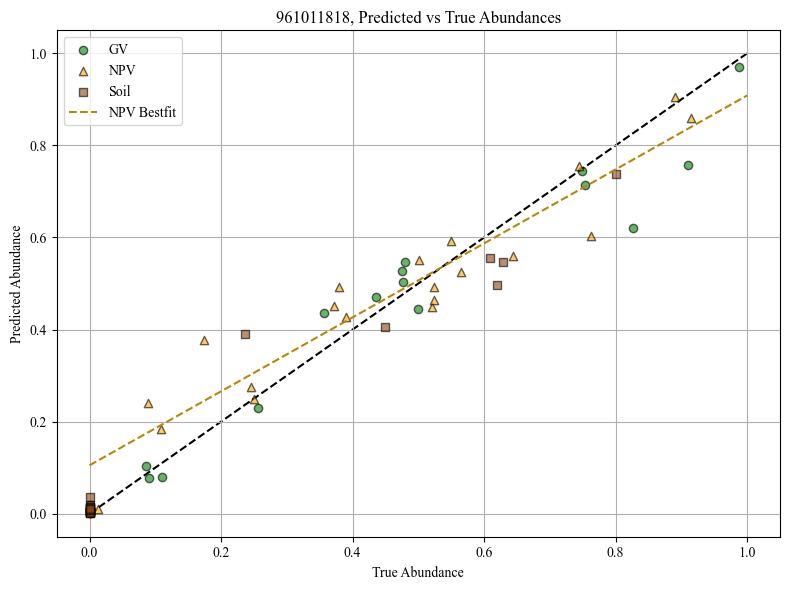

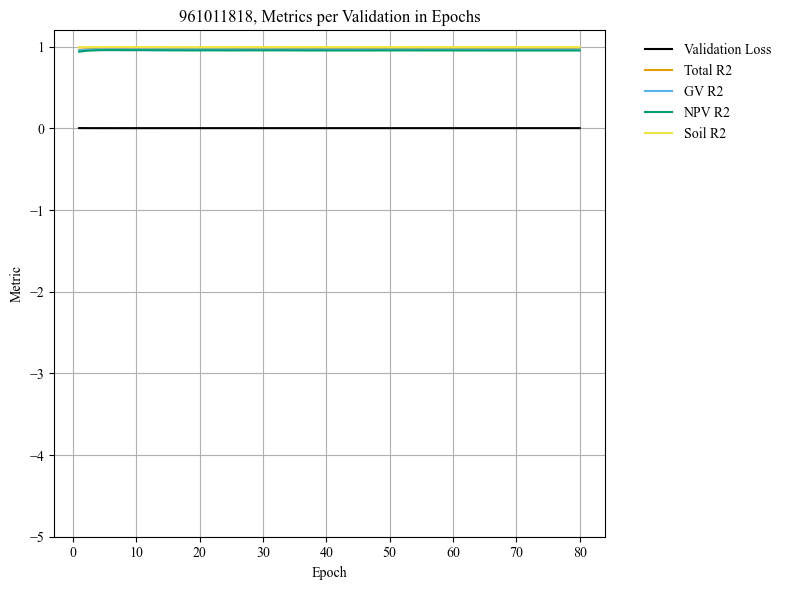

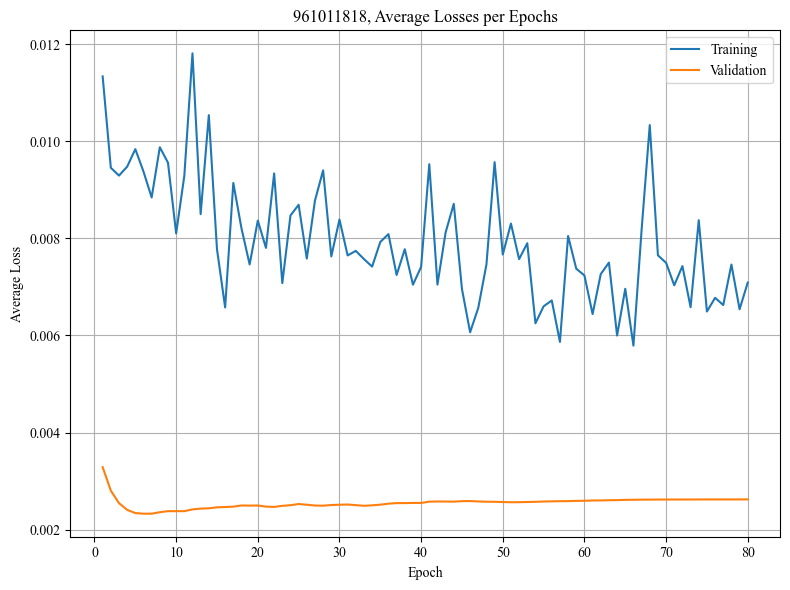

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006704
Epoch 1/80, Step 2/5, Train Loss: 0.007944
Epoch 1/80, Step 3/5, Train Loss: 0.010365
Epoch 1/80, Step 4/5, Train Loss: 0.007639
Epoch 1/80, Step 5/5, Train Loss: 0.005309
Epoch 1/80 complete. Train Loss: 0.007592, Val Loss: 0.005978
Epoch 2/80, Step 1/5, Train Loss: 0.013668
Epoch 2/80, Step 2/5, Train Loss: 0.004890
Epoch 2/80, Step 3/5, Train Loss: 0.009270
Epoch 2/80, Step 4/5, Train Loss: 0.005753
Epoch 2/80, Step 5/5, Train Loss: 0.009586
Epoch 2/80 complete. Train Loss: 0.008633, Val Loss: 0.005818
Epoch 3/80, Step 1/5, Train Loss: 0.003525
Epoch 3/80, Step 2/5, Train Loss: 0.007593
Epoch 3/80, Step 3/5, Train Loss: 0.008701
Epoch 3/80, Step 4/5, Train Loss: 0.003529
Epoch 3/80, Step 5/5, Train Loss: 0.006755
Epoch 3/80 complete. Train Loss: 0.006021, Val Loss: 0.005624
Epoch 4/80, Step 1/5, Train Loss: 0.005227
Epoch 4/80, Step 2/5, Train Loss: 0.008702
Epoch 4/80, Step 3/5, Train Loss: 0.010331
Epoch 4/80, Step 4/5, Train Loss: 0.0097

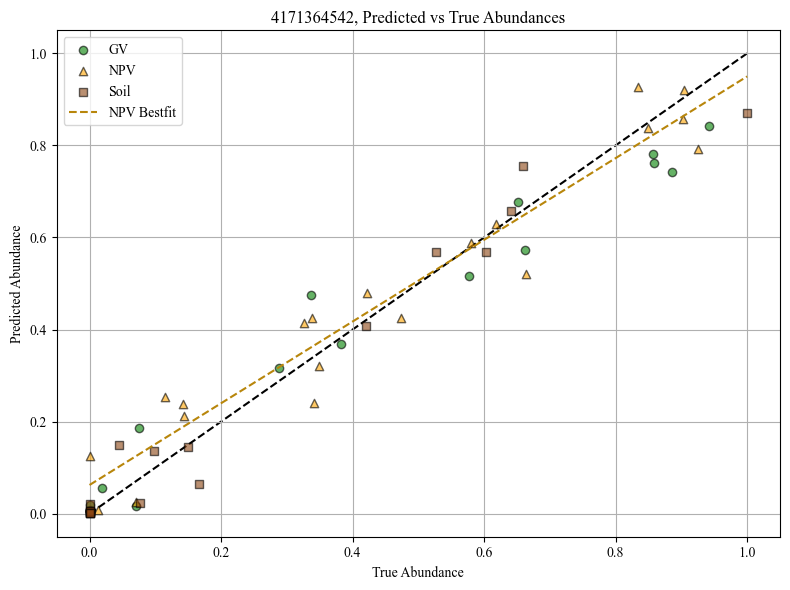

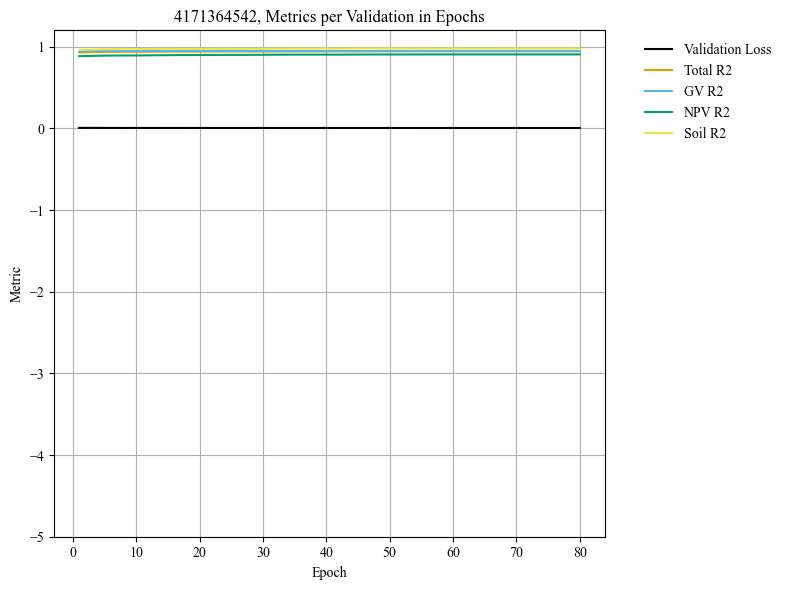

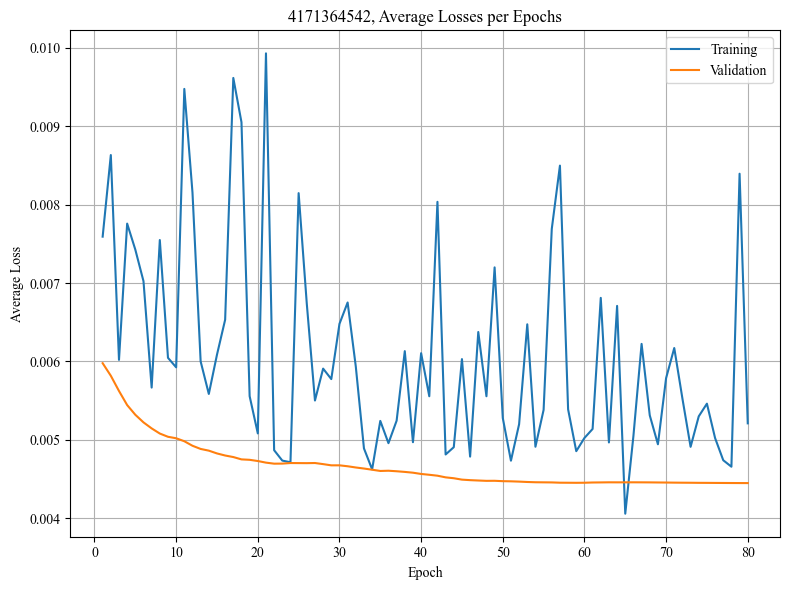

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007994
Epoch 1/80, Step 2/5, Train Loss: 0.015080
Epoch 1/80, Step 3/5, Train Loss: 0.017641
Epoch 1/80, Step 4/5, Train Loss: 0.005362
Epoch 1/80, Step 5/5, Train Loss: 0.004761
Epoch 1/80 complete. Train Loss: 0.010168, Val Loss: 0.008610
Epoch 2/80, Step 1/5, Train Loss: 0.004557
Epoch 2/80, Step 2/5, Train Loss: 0.012762
Epoch 2/80, Step 3/5, Train Loss: 0.009297
Epoch 2/80, Step 4/5, Train Loss: 0.006440
Epoch 2/80, Step 5/5, Train Loss: 0.011095
Epoch 2/80 complete. Train Loss: 0.008830, Val Loss: 0.008664
Epoch 3/80, Step 1/5, Train Loss: 0.006742
Epoch 3/80, Step 2/5, Train Loss: 0.008783
Epoch 3/80, Step 3/5, Train Loss: 0.013214
Epoch 3/80, Step 4/5, Train Loss: 0.004700
Epoch 3/80, Step 5/5, Train Loss: 0.010831
Epoch 3/80 complete. Train Loss: 0.008854, Val Loss: 0.008851
Epoch 4/80, Step 1/5, Train Loss: 0.009311
Epoch 4/80, Step 2/5, Train Loss: 0.010229
Epoch 4/80, Step 3/5, Train Loss: 0.005404
Epoch 4/80, Step 4/5, Train Loss: 0.0207

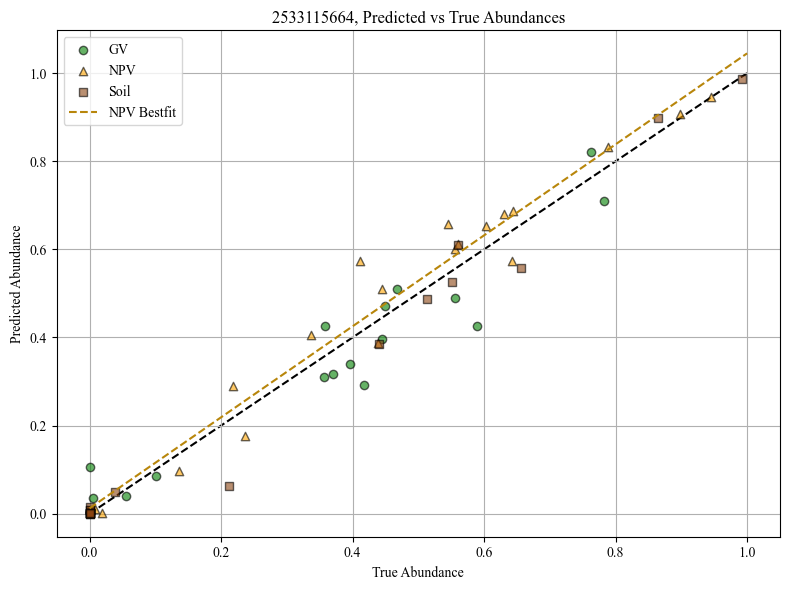

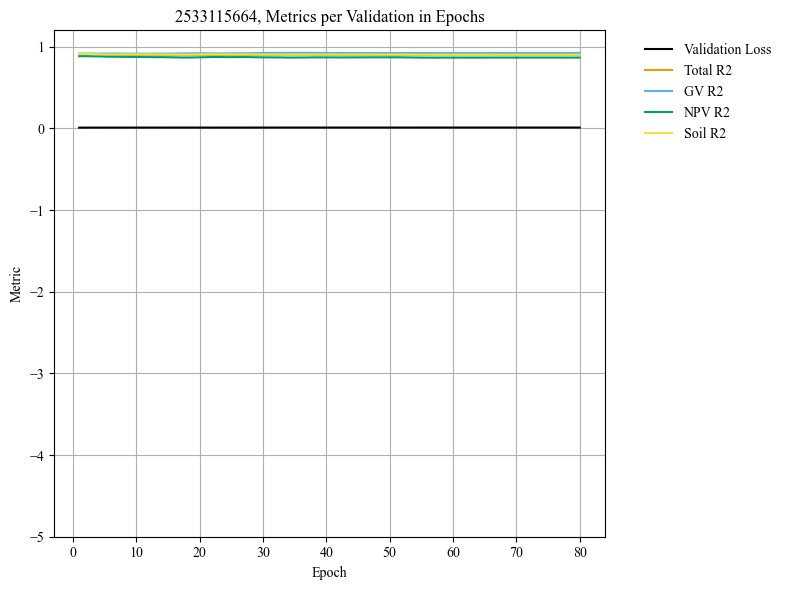

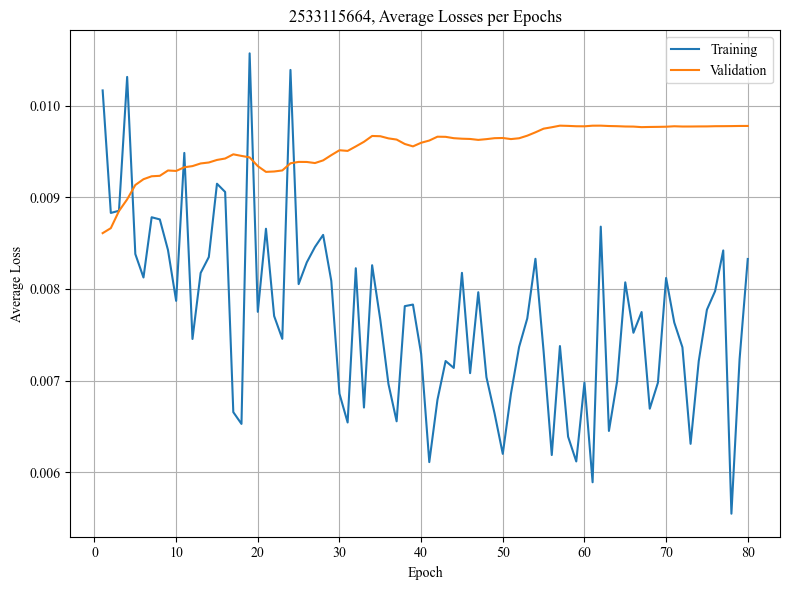

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011660
Epoch 1/80, Step 2/5, Train Loss: 0.007327
Epoch 1/80, Step 3/5, Train Loss: 0.008301
Epoch 1/80, Step 4/5, Train Loss: 0.008580
Epoch 1/80, Step 5/5, Train Loss: 0.007222
Epoch 1/80 complete. Train Loss: 0.008618, Val Loss: 0.010424
Epoch 2/80, Step 1/5, Train Loss: 0.009013
Epoch 2/80, Step 2/5, Train Loss: 0.014834
Epoch 2/80, Step 3/5, Train Loss: 0.008377
Epoch 2/80, Step 4/5, Train Loss: 0.009654
Epoch 2/80, Step 5/5, Train Loss: 0.008111
Epoch 2/80 complete. Train Loss: 0.009998, Val Loss: 0.009585
Epoch 3/80, Step 1/5, Train Loss: 0.005547
Epoch 3/80, Step 2/5, Train Loss: 0.005639
Epoch 3/80, Step 3/5, Train Loss: 0.004402
Epoch 3/80, Step 4/5, Train Loss: 0.011895
Epoch 3/80, Step 5/5, Train Loss: 0.018934
Epoch 3/80 complete. Train Loss: 0.009283, Val Loss: 0.009083
Epoch 4/80, Step 1/5, Train Loss: 0.009702
Epoch 4/80, Step 2/5, Train Loss: 0.006912
Epoch 4/80, Step 3/5, Train Loss: 0.006197
Epoch 4/80, Step 4/5, Train Loss: 0.0050

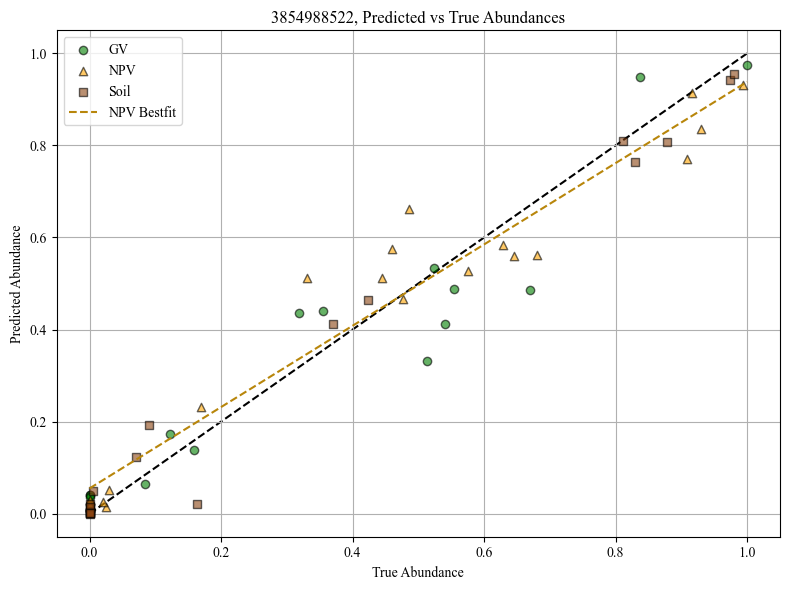

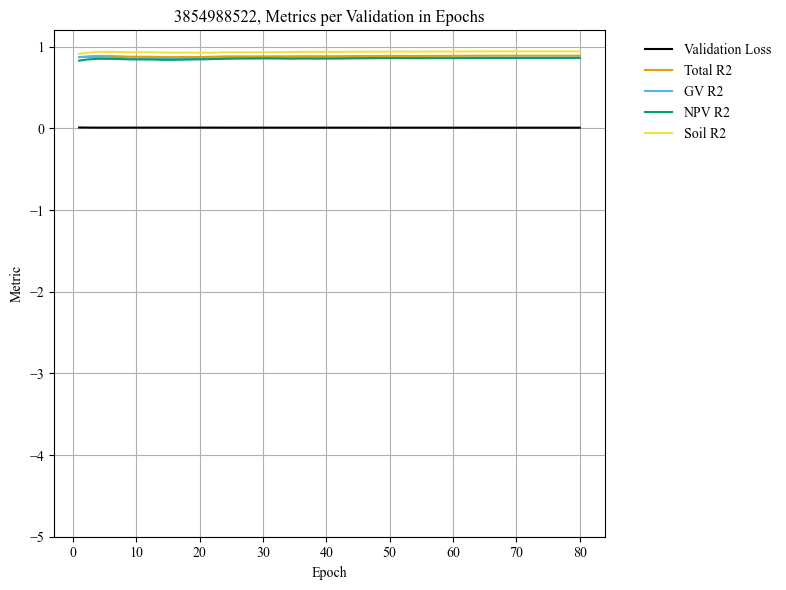

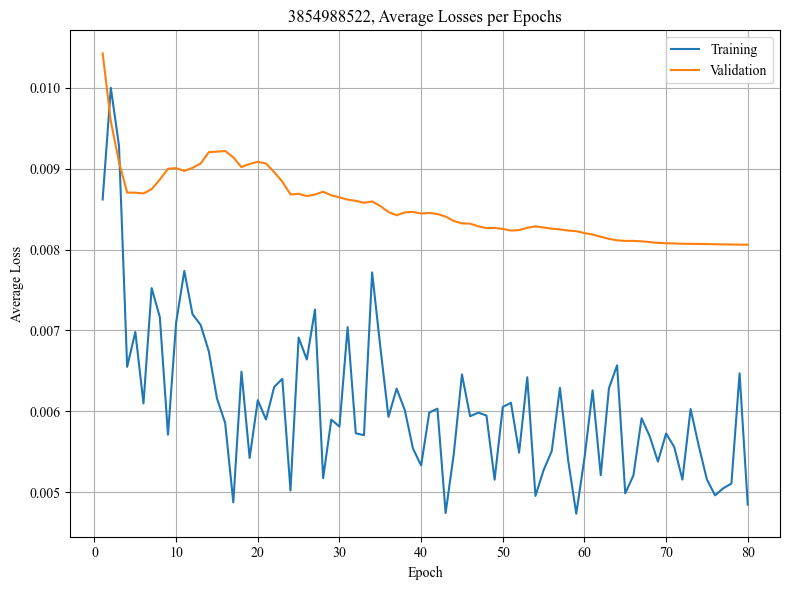

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008330
Epoch 1/80, Step 2/5, Train Loss: 0.010311
Epoch 1/80, Step 3/5, Train Loss: 0.007687
Epoch 1/80, Step 4/5, Train Loss: 0.005537
Epoch 1/80, Step 5/5, Train Loss: 0.013864
Epoch 1/80 complete. Train Loss: 0.009146, Val Loss: 0.006161
Epoch 2/80, Step 1/5, Train Loss: 0.005781
Epoch 2/80, Step 2/5, Train Loss: 0.010234
Epoch 2/80, Step 3/5, Train Loss: 0.005690
Epoch 2/80, Step 4/5, Train Loss: 0.018551
Epoch 2/80, Step 5/5, Train Loss: 0.014317
Epoch 2/80 complete. Train Loss: 0.010914, Val Loss: 0.005761
Epoch 3/80, Step 1/5, Train Loss: 0.011589
Epoch 3/80, Step 2/5, Train Loss: 0.005750
Epoch 3/80, Step 3/5, Train Loss: 0.013160
Epoch 3/80, Step 4/5, Train Loss: 0.005698
Epoch 3/80, Step 5/5, Train Loss: 0.009233
Epoch 3/80 complete. Train Loss: 0.009086, Val Loss: 0.005555
Epoch 4/80, Step 1/5, Train Loss: 0.011697
Epoch 4/80, Step 2/5, Train Loss: 0.010116
Epoch 4/80, Step 3/5, Train Loss: 0.007969
Epoch 4/80, Step 4/5, Train Loss: 0.0065

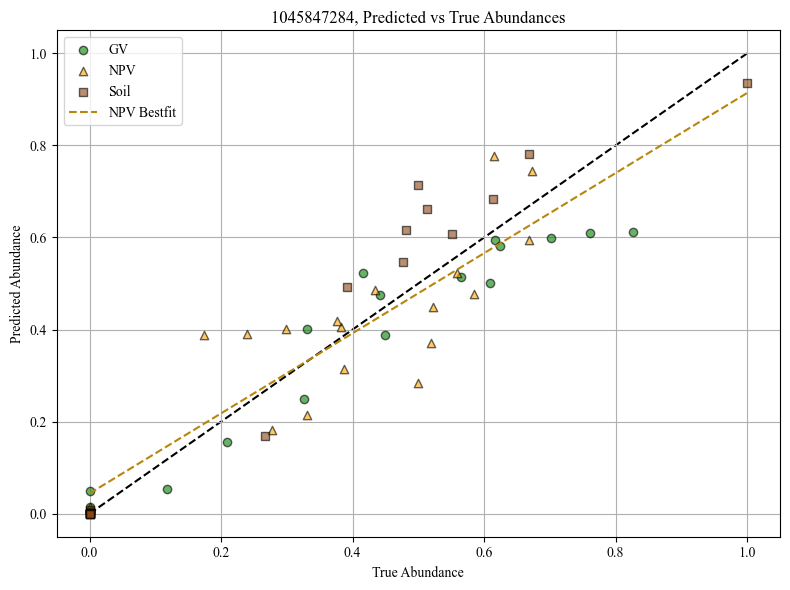

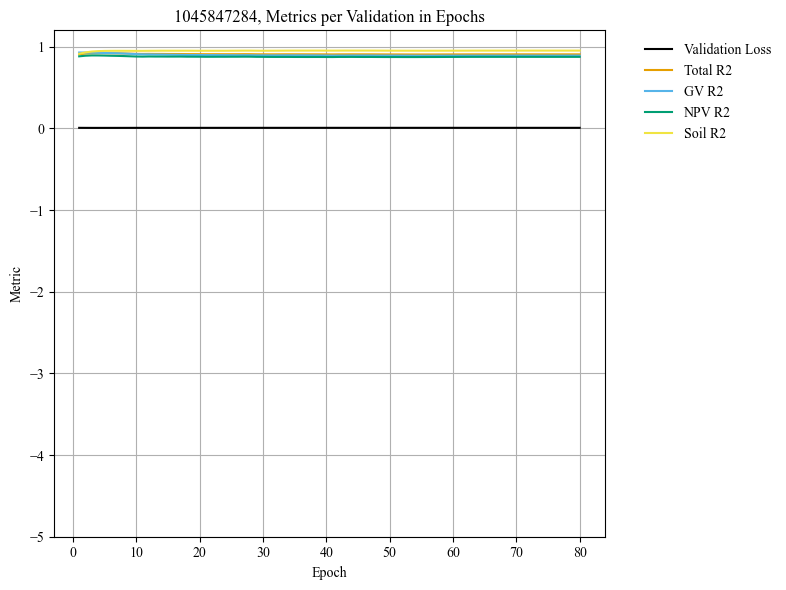

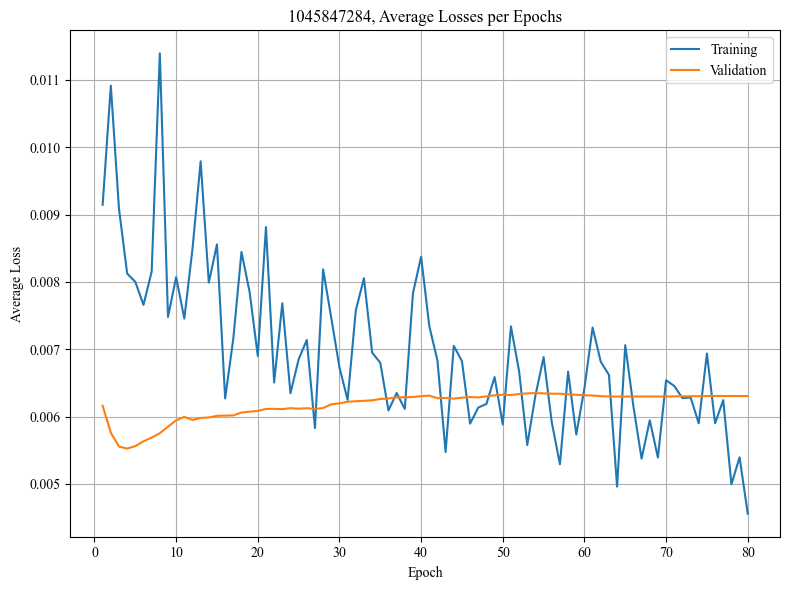

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008200
Epoch 1/80, Step 2/5, Train Loss: 0.010290
Epoch 1/80, Step 3/5, Train Loss: 0.009595
Epoch 1/80, Step 4/5, Train Loss: 0.010790
Epoch 1/80, Step 5/5, Train Loss: 0.009267
Epoch 1/80 complete. Train Loss: 0.009629, Val Loss: 0.006468
Epoch 2/80, Step 1/5, Train Loss: 0.006248
Epoch 2/80, Step 2/5, Train Loss: 0.008936
Epoch 2/80, Step 3/5, Train Loss: 0.014551
Epoch 2/80, Step 4/5, Train Loss: 0.008987
Epoch 2/80, Step 5/5, Train Loss: 0.005496
Epoch 2/80 complete. Train Loss: 0.008844, Val Loss: 0.006272
Epoch 3/80, Step 1/5, Train Loss: 0.011813
Epoch 3/80, Step 2/5, Train Loss: 0.006078
Epoch 3/80, Step 3/5, Train Loss: 0.003627
Epoch 3/80, Step 4/5, Train Loss: 0.007413
Epoch 3/80, Step 5/5, Train Loss: 0.012736
Epoch 3/80 complete. Train Loss: 0.008333, Val Loss: 0.006425
Epoch 4/80, Step 1/5, Train Loss: 0.007263
Epoch 4/80, Step 2/5, Train Loss: 0.009048
Epoch 4/80, Step 3/5, Train Loss: 0.009569
Epoch 4/80, Step 4/5, Train Loss: 0.0053

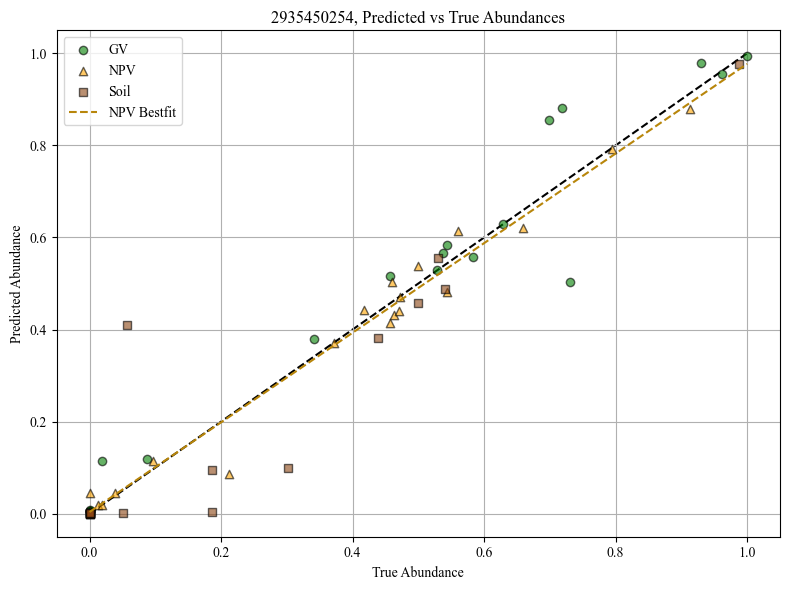

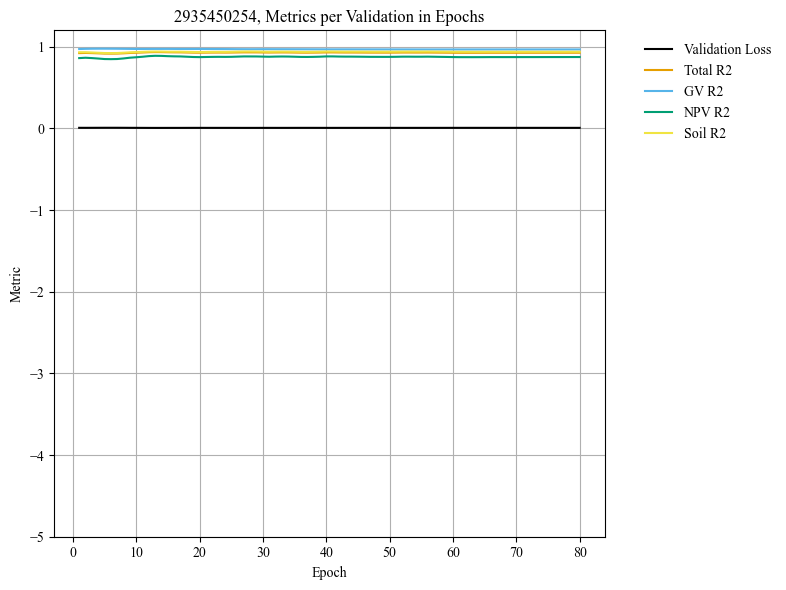

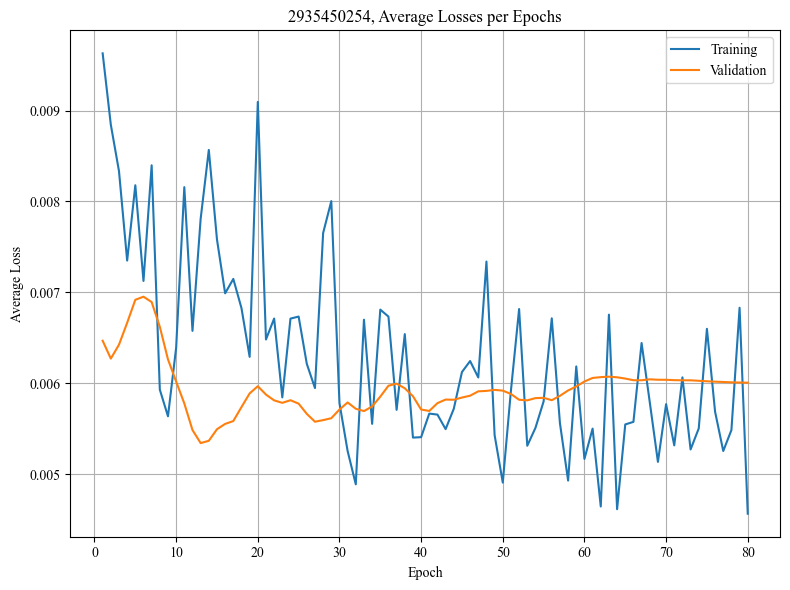

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006274
Epoch 1/80, Step 2/5, Train Loss: 0.003640
Epoch 1/80, Step 3/5, Train Loss: 0.005047
Epoch 1/80, Step 4/5, Train Loss: 0.003734
Epoch 1/80, Step 5/5, Train Loss: 0.004053
Epoch 1/80 complete. Train Loss: 0.004550, Val Loss: 0.005088
Epoch 2/80, Step 1/5, Train Loss: 0.005921
Epoch 2/80, Step 2/5, Train Loss: 0.005411
Epoch 2/80, Step 3/5, Train Loss: 0.007832
Epoch 2/80, Step 4/5, Train Loss: 0.003799
Epoch 2/80, Step 5/5, Train Loss: 0.004193
Epoch 2/80 complete. Train Loss: 0.005431, Val Loss: 0.005261
Epoch 3/80, Step 1/5, Train Loss: 0.005168
Epoch 3/80, Step 2/5, Train Loss: 0.003586
Epoch 3/80, Step 3/5, Train Loss: 0.003863
Epoch 3/80, Step 4/5, Train Loss: 0.004274
Epoch 3/80, Step 5/5, Train Loss: 0.007926
Epoch 3/80 complete. Train Loss: 0.004963, Val Loss: 0.005310
Epoch 4/80, Step 1/5, Train Loss: 0.004605
Epoch 4/80, Step 2/5, Train Loss: 0.007583
Epoch 4/80, Step 3/5, Train Loss: 0.002966
Epoch 4/80, Step 4/5, Train Loss: 0.0102

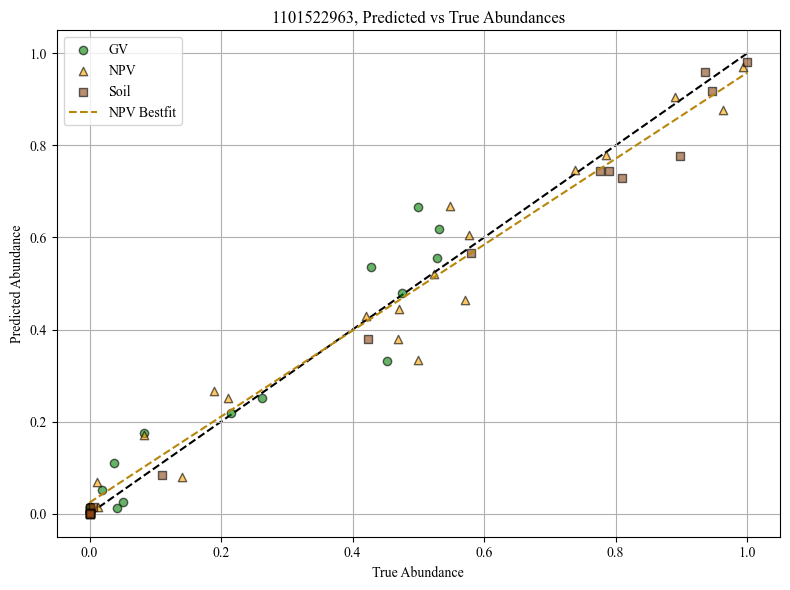

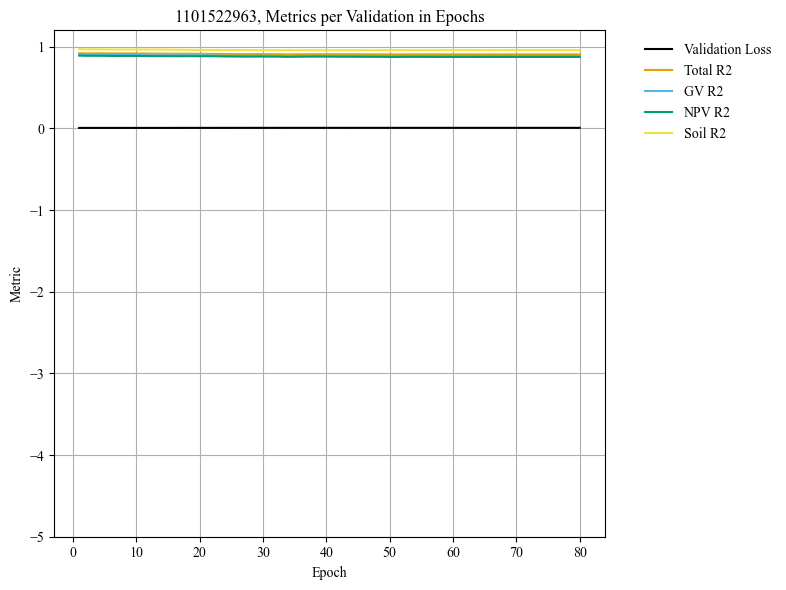

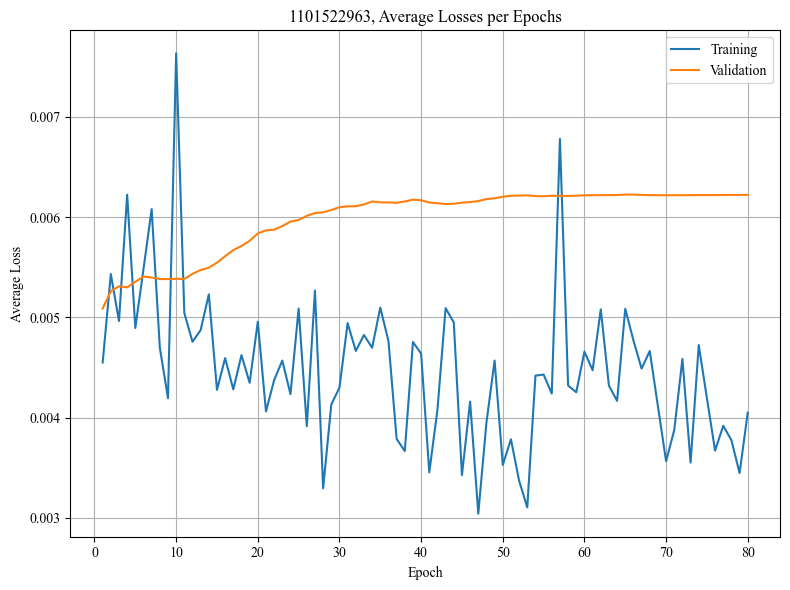

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010588
Epoch 1/80, Step 2/5, Train Loss: 0.006558
Epoch 1/80, Step 3/5, Train Loss: 0.009362
Epoch 1/80, Step 4/5, Train Loss: 0.009850
Epoch 1/80, Step 5/5, Train Loss: 0.003262
Epoch 1/80 complete. Train Loss: 0.007924, Val Loss: 0.005973
Epoch 2/80, Step 1/5, Train Loss: 0.005599
Epoch 2/80, Step 2/5, Train Loss: 0.017894
Epoch 2/80, Step 3/5, Train Loss: 0.010001
Epoch 2/80, Step 4/5, Train Loss: 0.010482
Epoch 2/80, Step 5/5, Train Loss: 0.008739
Epoch 2/80 complete. Train Loss: 0.010543, Val Loss: 0.005984
Epoch 3/80, Step 1/5, Train Loss: 0.008659
Epoch 3/80, Step 2/5, Train Loss: 0.006490
Epoch 3/80, Step 3/5, Train Loss: 0.010557
Epoch 3/80, Step 4/5, Train Loss: 0.005170
Epoch 3/80, Step 5/5, Train Loss: 0.009795
Epoch 3/80 complete. Train Loss: 0.008134, Val Loss: 0.006032
Epoch 4/80, Step 1/5, Train Loss: 0.003642
Epoch 4/80, Step 2/5, Train Loss: 0.006758
Epoch 4/80, Step 3/5, Train Loss: 0.005824
Epoch 4/80, Step 4/5, Train Loss: 0.0179

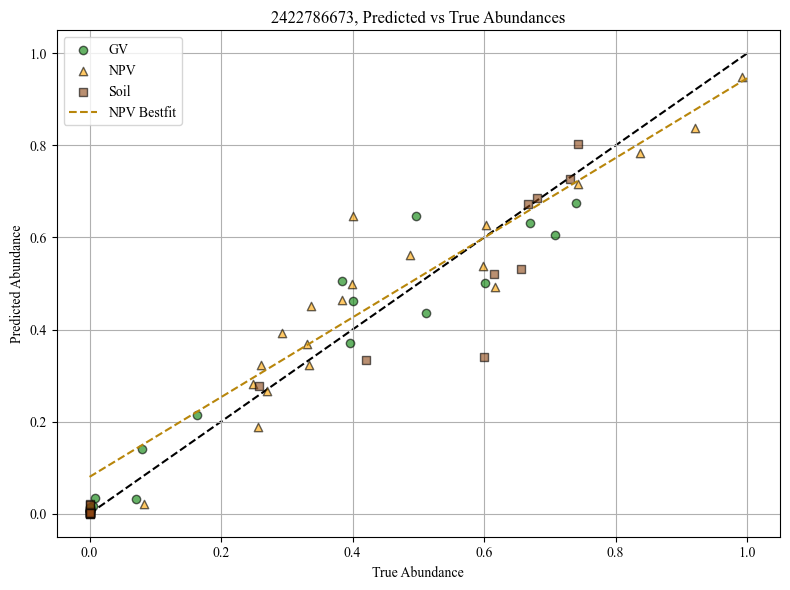

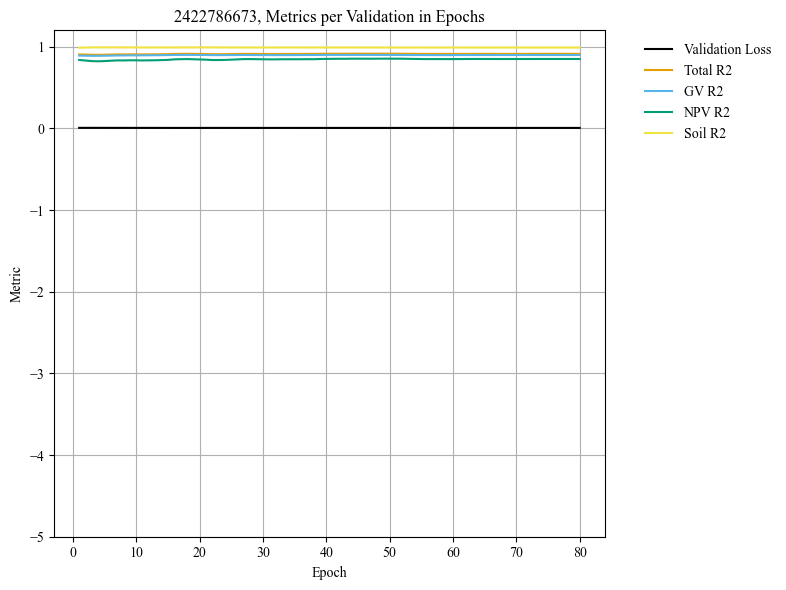

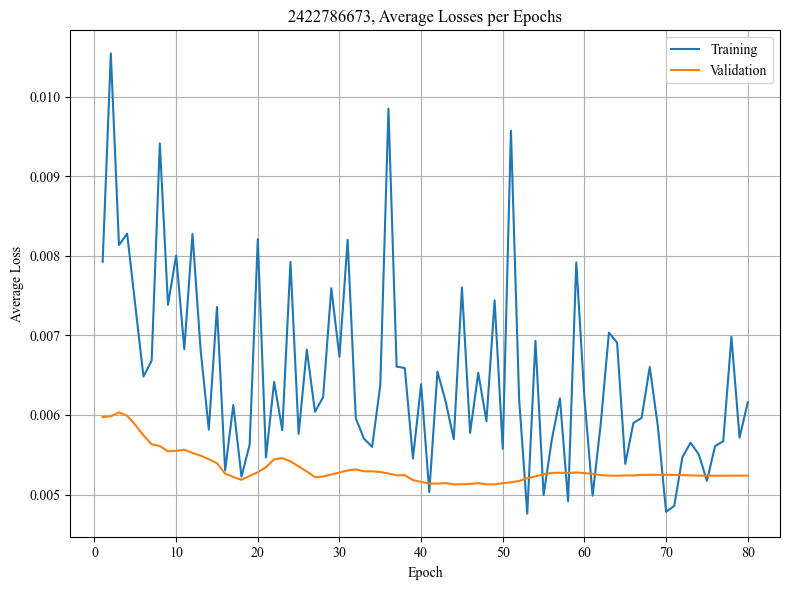

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004255
Epoch 1/80, Step 2/5, Train Loss: 0.012722
Epoch 1/80, Step 3/5, Train Loss: 0.004171
Epoch 1/80, Step 4/5, Train Loss: 0.005334
Epoch 1/80, Step 5/5, Train Loss: 0.006336
Epoch 1/80 complete. Train Loss: 0.006564, Val Loss: 0.005368
Epoch 2/80, Step 1/5, Train Loss: 0.006333
Epoch 2/80, Step 2/5, Train Loss: 0.004576
Epoch 2/80, Step 3/5, Train Loss: 0.004841
Epoch 2/80, Step 4/5, Train Loss: 0.004464
Epoch 2/80, Step 5/5, Train Loss: 0.006257
Epoch 2/80 complete. Train Loss: 0.005294, Val Loss: 0.005180
Epoch 3/80, Step 1/5, Train Loss: 0.004951
Epoch 3/80, Step 2/5, Train Loss: 0.003854
Epoch 3/80, Step 3/5, Train Loss: 0.008278
Epoch 3/80, Step 4/5, Train Loss: 0.008047
Epoch 3/80, Step 5/5, Train Loss: 0.003539
Epoch 3/80 complete. Train Loss: 0.005734, Val Loss: 0.005156
Epoch 4/80, Step 1/5, Train Loss: 0.009509
Epoch 4/80, Step 2/5, Train Loss: 0.005289
Epoch 4/80, Step 3/5, Train Loss: 0.005011
Epoch 4/80, Step 4/5, Train Loss: 0.0086

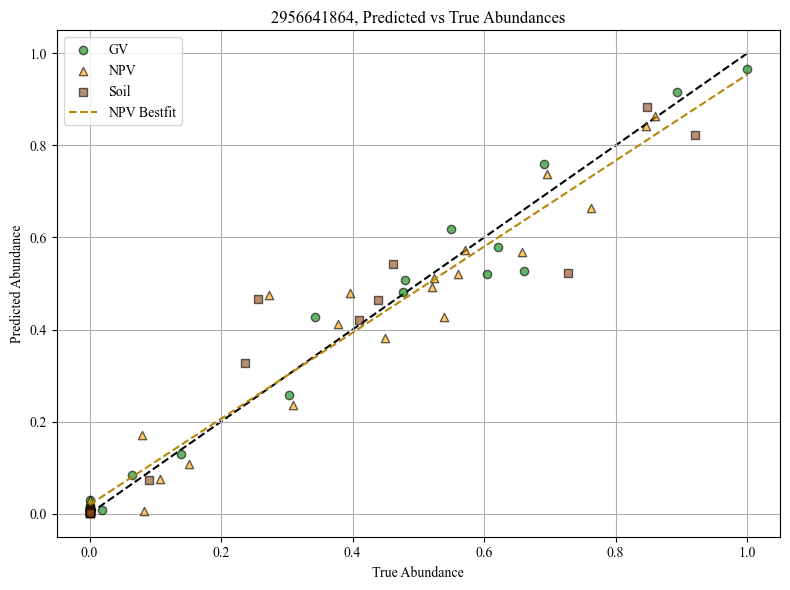

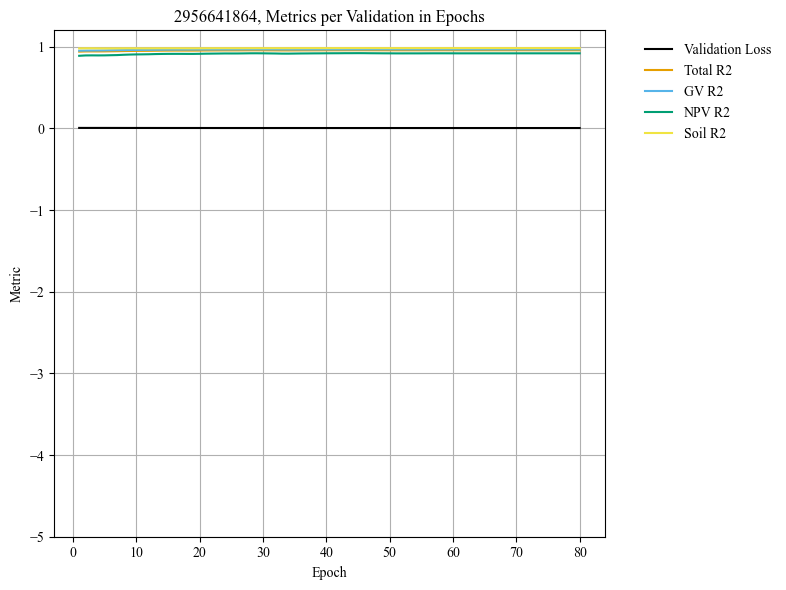

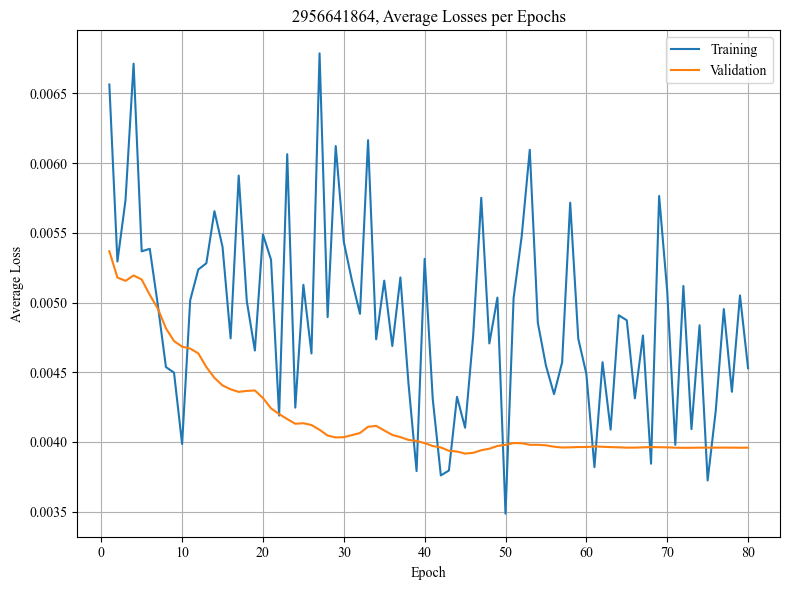

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011977
Epoch 1/80, Step 2/5, Train Loss: 0.010684
Epoch 1/80, Step 3/5, Train Loss: 0.007376
Epoch 1/80, Step 4/5, Train Loss: 0.010198
Epoch 1/80, Step 5/5, Train Loss: 0.021304
Epoch 1/80 complete. Train Loss: 0.012308, Val Loss: 0.014770
Epoch 2/80, Step 1/5, Train Loss: 0.010455
Epoch 2/80, Step 2/5, Train Loss: 0.003854
Epoch 2/80, Step 3/5, Train Loss: 0.009521
Epoch 2/80, Step 4/5, Train Loss: 0.013810
Epoch 2/80, Step 5/5, Train Loss: 0.011094
Epoch 2/80 complete. Train Loss: 0.009747, Val Loss: 0.013526
Epoch 3/80, Step 1/5, Train Loss: 0.011155
Epoch 3/80, Step 2/5, Train Loss: 0.009719
Epoch 3/80, Step 3/5, Train Loss: 0.009295
Epoch 3/80, Step 4/5, Train Loss: 0.008109
Epoch 3/80, Step 5/5, Train Loss: 0.011580
Epoch 3/80 complete. Train Loss: 0.009972, Val Loss: 0.012629
Epoch 4/80, Step 1/5, Train Loss: 0.013645
Epoch 4/80, Step 2/5, Train Loss: 0.009967
Epoch 4/80, Step 3/5, Train Loss: 0.006348
Epoch 4/80, Step 4/5, Train Loss: 0.0081

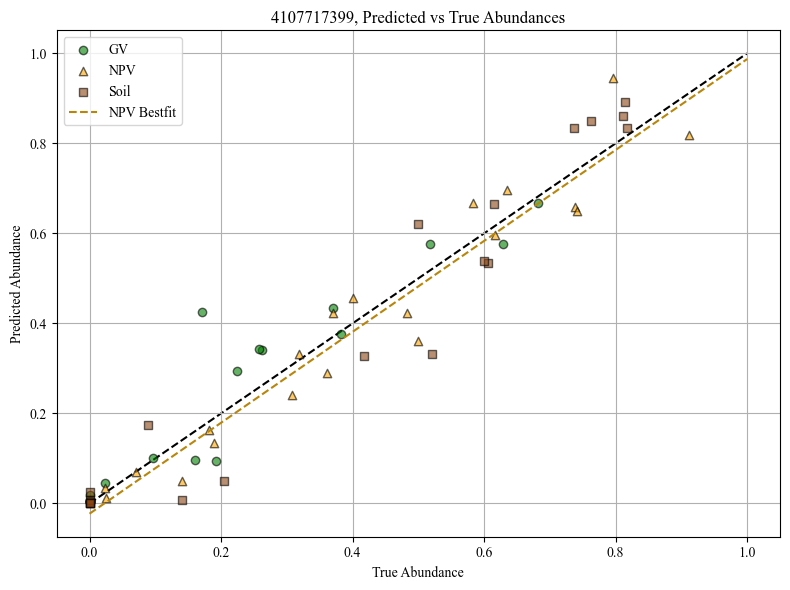

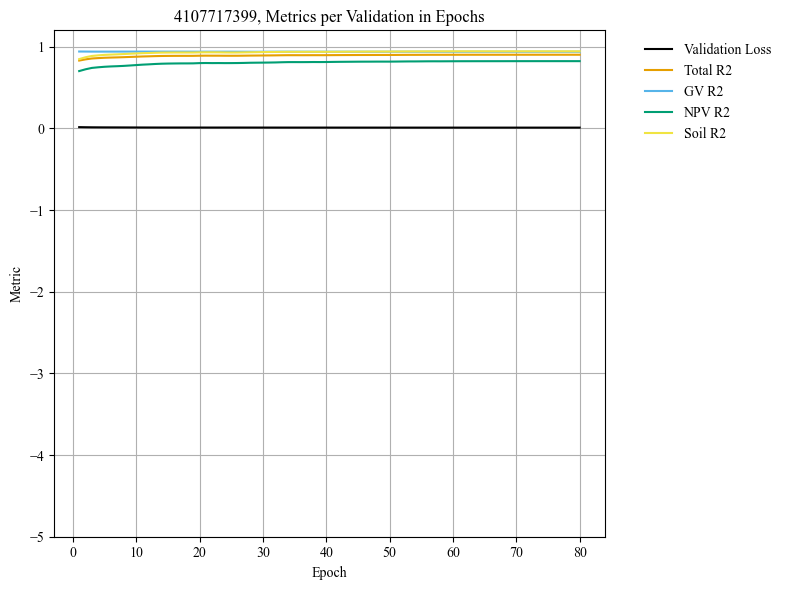

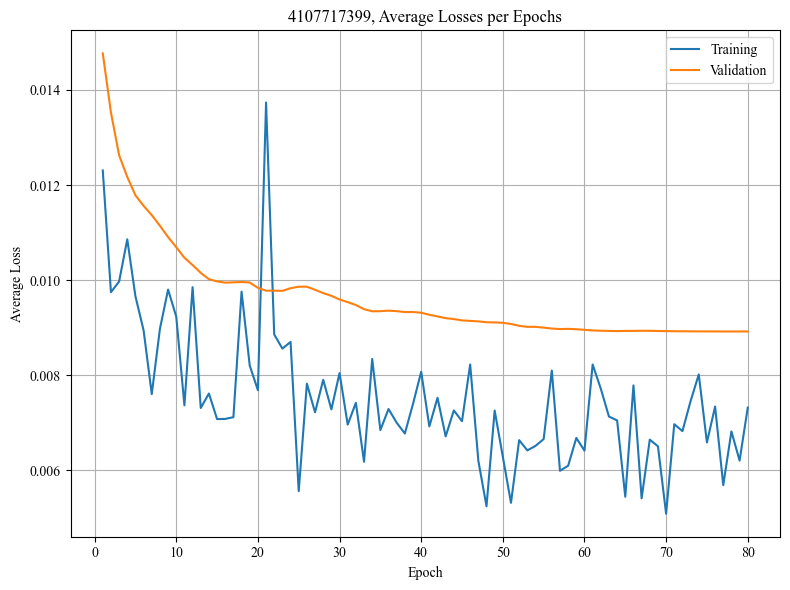

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006005
Epoch 1/80, Step 2/5, Train Loss: 0.008157
Epoch 1/80, Step 3/5, Train Loss: 0.011445
Epoch 1/80, Step 4/5, Train Loss: 0.005013
Epoch 1/80, Step 5/5, Train Loss: 0.005737
Epoch 1/80 complete. Train Loss: 0.007272, Val Loss: 0.005337
Epoch 2/80, Step 1/5, Train Loss: 0.005722
Epoch 2/80, Step 2/5, Train Loss: 0.005900
Epoch 2/80, Step 3/5, Train Loss: 0.009484
Epoch 2/80, Step 4/5, Train Loss: 0.007893
Epoch 2/80, Step 5/5, Train Loss: 0.007022
Epoch 2/80 complete. Train Loss: 0.007204, Val Loss: 0.005379
Epoch 3/80, Step 1/5, Train Loss: 0.008133
Epoch 3/80, Step 2/5, Train Loss: 0.009079
Epoch 3/80, Step 3/5, Train Loss: 0.003338
Epoch 3/80, Step 4/5, Train Loss: 0.005094
Epoch 3/80, Step 5/5, Train Loss: 0.012186
Epoch 3/80 complete. Train Loss: 0.007566, Val Loss: 0.005310
Epoch 4/80, Step 1/5, Train Loss: 0.007868
Epoch 4/80, Step 2/5, Train Loss: 0.003996
Epoch 4/80, Step 3/5, Train Loss: 0.015710
Epoch 4/80, Step 4/5, Train Loss: 0.0115

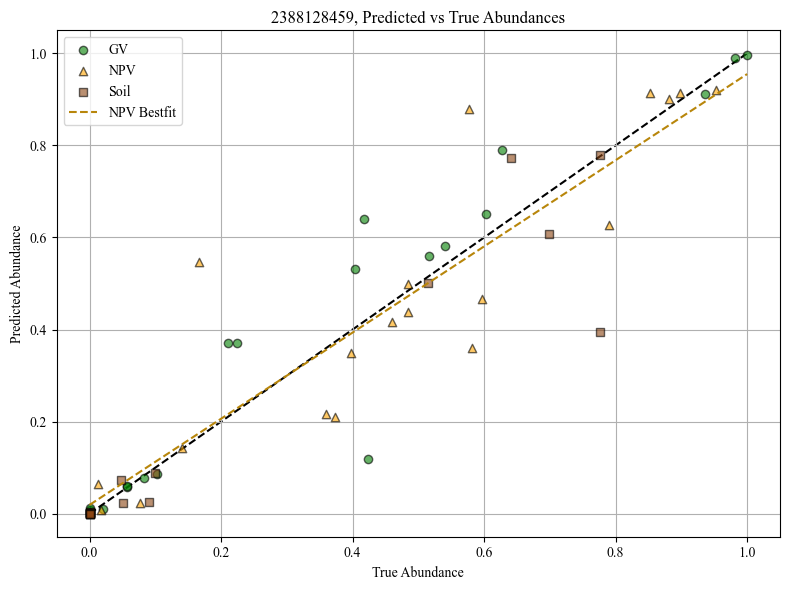

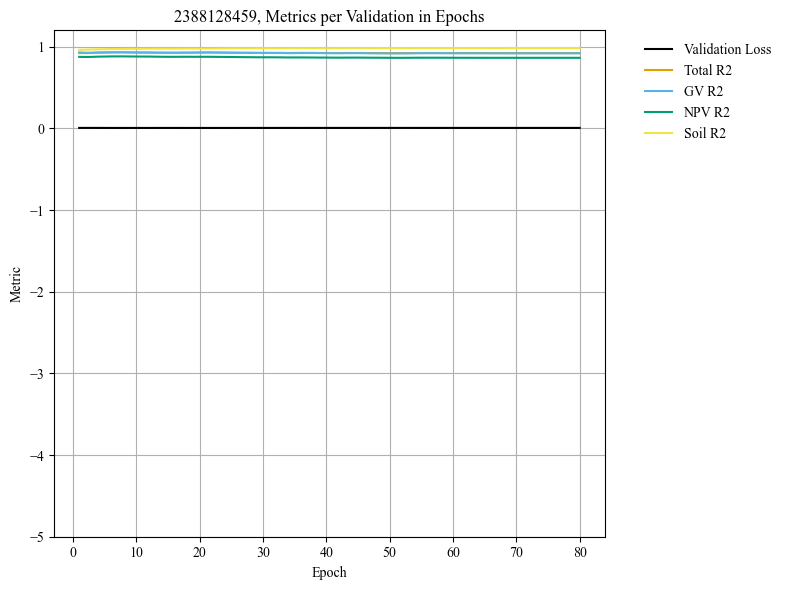

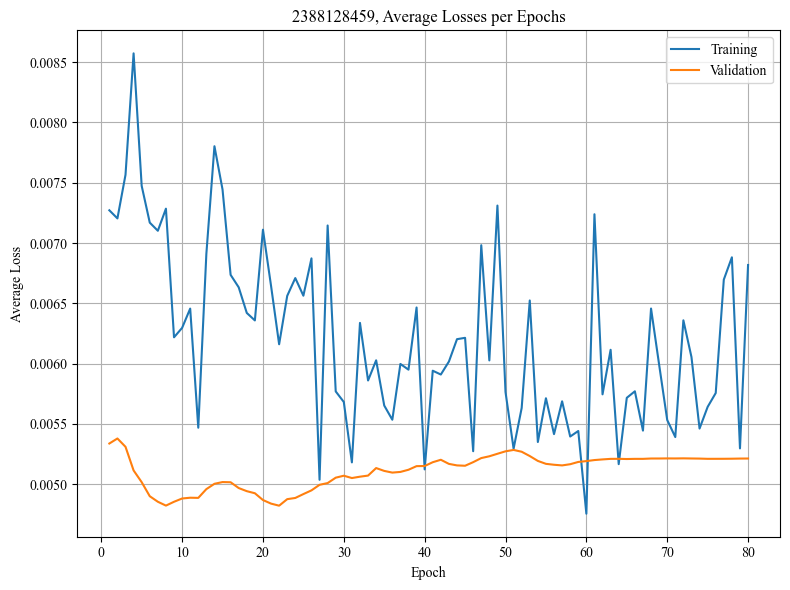

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018933
Epoch 1/80, Step 2/5, Train Loss: 0.007638
Epoch 1/80, Step 3/5, Train Loss: 0.007390
Epoch 1/80, Step 4/5, Train Loss: 0.022599
Epoch 1/80, Step 5/5, Train Loss: 0.010015
Epoch 1/80 complete. Train Loss: 0.013315, Val Loss: 0.008199
Epoch 2/80, Step 1/5, Train Loss: 0.015268
Epoch 2/80, Step 2/5, Train Loss: 0.015210
Epoch 2/80, Step 3/5, Train Loss: 0.014887
Epoch 2/80, Step 4/5, Train Loss: 0.010626
Epoch 2/80, Step 5/5, Train Loss: 0.017132
Epoch 2/80 complete. Train Loss: 0.014624, Val Loss: 0.007355
Epoch 3/80, Step 1/5, Train Loss: 0.020542
Epoch 3/80, Step 2/5, Train Loss: 0.008603
Epoch 3/80, Step 3/5, Train Loss: 0.010735
Epoch 3/80, Step 4/5, Train Loss: 0.018505
Epoch 3/80, Step 5/5, Train Loss: 0.008455
Epoch 3/80 complete. Train Loss: 0.013368, Val Loss: 0.006846
Epoch 4/80, Step 1/5, Train Loss: 0.015261
Epoch 4/80, Step 2/5, Train Loss: 0.027516
Epoch 4/80, Step 3/5, Train Loss: 0.011083
Epoch 4/80, Step 4/5, Train Loss: 0.0141

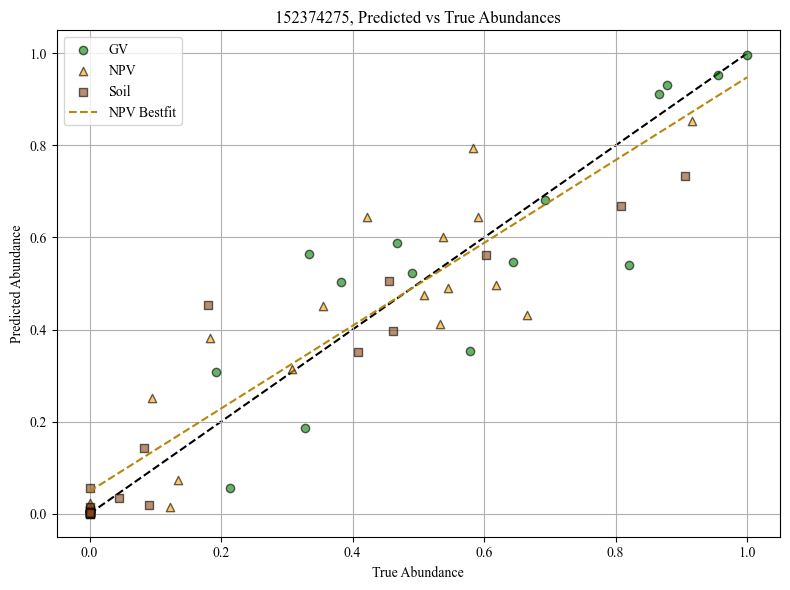

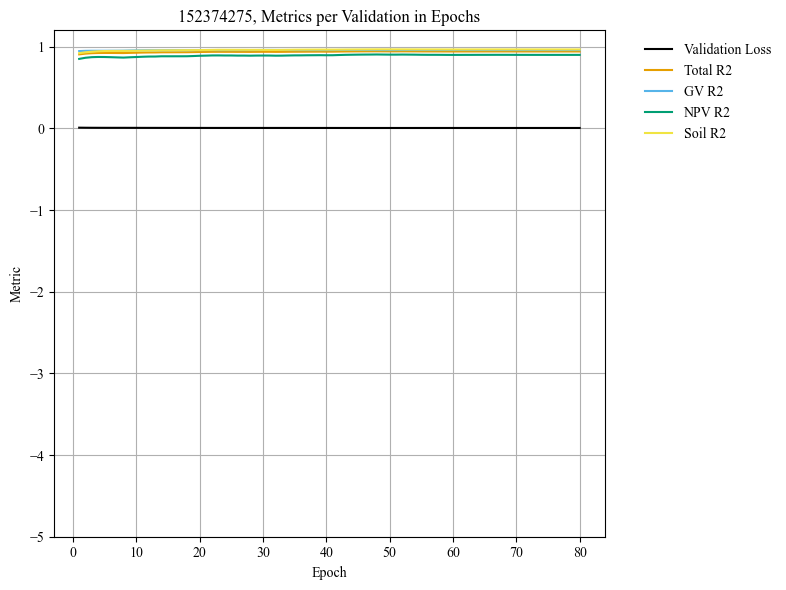

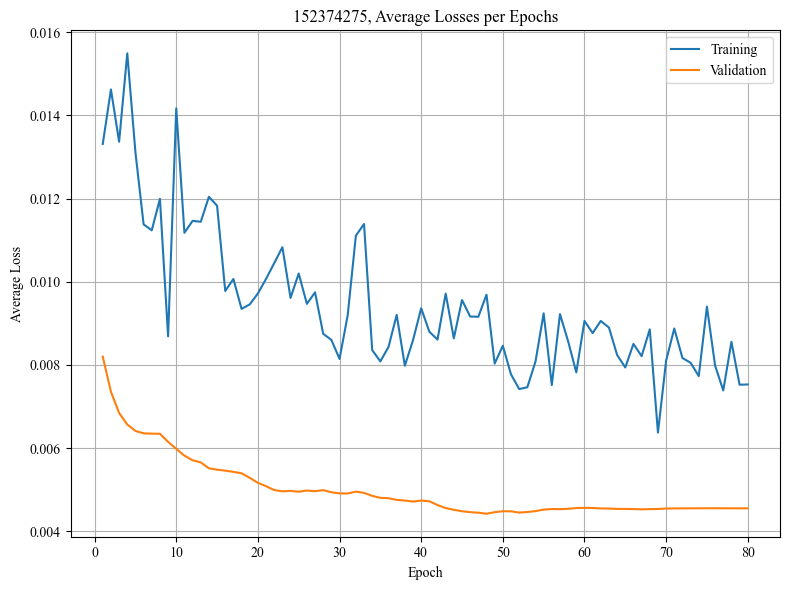

Testing complete


In [8]:
# Run the monte carlo cross validation loop

fno_16_dict = {}

for seed in mccv_seeds:
    torch.manual_seed(seed) # Set this as the global seed for all random ops in torch and numpy, just to be safe
    np.random.default_rng(seed)

    dataloaders = get_data(save_path=save_path, seed=seed, spec_range=[900, 1690], batch_size=batch_size, n_train=n_train, n_val=n_val, n_test=n_test)
    model = load_frozen(model_cfg, statedict_path, 'FNO').to(device)
    active_params = filter(lambda p: p.requires_grad, model.parameters()) # Filter the active params only
    optimizer = torch.optim.AdamW(active_params, lr=lr, weight_decay=weight_decay) # Only pass in the active params to the optim
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epoch*n_tb_epoch, eta_min=1e-6)
    loss = nn.MSELoss()

    model_dict = train_model(
        model=model,
        loss_fn=loss,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        configured_data=dataloaders,
        n_epoch=epoch,
        n_tb_epoch=n_tb_epoch,
        device=device,
        dtype=torch.float32,
        save_dir=str('results/'+str(seed)),
        model_name=str(seed),
        save_artifacts=True # Will only save metrics, artifacts are unnecessary
    )
    
    fno_16_dict[seed] = model_dict

In [9]:
import pickle
with open('fno_16_dict.pkl', 'wb') as fp:
    pickle.dump(fno_16_dict, fp)

NPV R^2 MCCV Results (M=50)
Mean (μ): 0.8471
Std (σ): ±0.1227
Min-Max: 0.3078-0.9747
Final Reported Metric: 0.8471 ± 0.1227


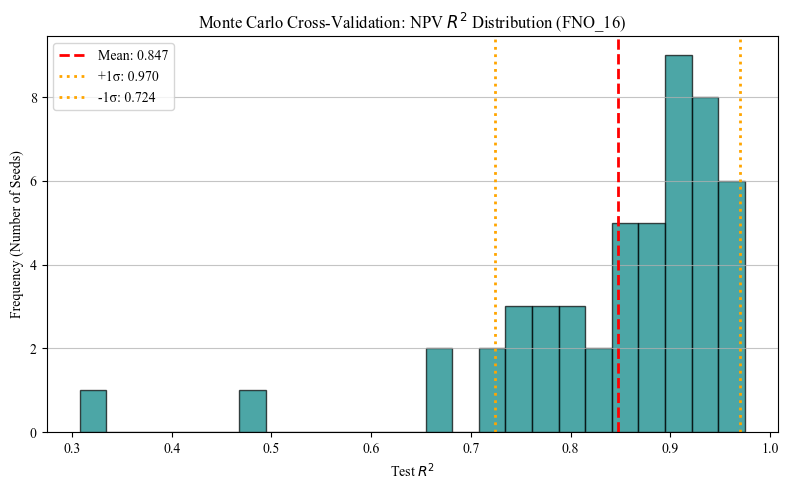

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Extract the NPV R2 metrics
npv_r2_list = [
    model_dict['metrics_total'][0][5] 
    for seed, model_dict in fno_16_dict.items()
]
npv_r2_array = np.array(npv_r2_list)

# Calculate the core statistical bounds
# Used ddof=1 for the unbiased sample standard deviation
mu_npv = np.mean(npv_r2_array)
sigma_npv = np.std(npv_r2_array, ddof=1)
min_npv = np.min(npv_r2_array)
max_npv = np.max(npv_r2_array)

# Plot stuff
print(f"NPV R^2 MCCV Results (M={len(npv_r2_array)})")
print(f"Mean (μ): {mu_npv:.4f}")
print(f"Std (σ): ±{sigma_npv:.4f}")
print(f"Min-Max: {min_npv:.4f}-{max_npv:.4f}")
print(f"Final Reported Metric: {mu_npv:.4f} ± {sigma_npv:.4f}")
plt.figure(figsize=(8, 5))
plt.hist(npv_r2_array, bins=25, color='teal', edgecolor='black', alpha=0.7)
plt.axvline(mu_npv, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mu_npv:.3f}')
plt.axvline(mu_npv + sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'+1σ: {(mu_npv + sigma_npv):.3f}')
plt.axvline(mu_npv - sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'-1σ: {(mu_npv - sigma_npv):.3f}')
plt.title('Monte Carlo Cross-Validation: NPV $R^2$ Distribution (FNO_16)')
plt.xlabel('Test $R^2$')
plt.ylabel('Frequency (Number of Seeds)')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.savefig('mccv_npv_r2_distribution.svg')
plt.show()